# Some plots of index trends and all events compounding trends

This file grabs the warm season indeces and sees if this shows us anything


You need to run cmipIndeces.ipnyb first

In [1]:
_work_dir='/g/data/gv90/as2285/compound'

import sys
sys.path.append(_work_dir)

#import my functions
import utils._modelDefinitions as _model
import utils._indexDefinitions as _index
import utils.overlapBins as overlapBins


In [2]:
import xarray
import matplotlib.pyplot as plt
import numpy
import pandas

%matplotlib inline

In [3]:
%run {_work_dir}/utils/emergence.ipynb

In [4]:
import warnings
warnings.filterwarnings('ignore')

In [5]:
compoundXr=xarray.open_dataset(f'{_work_dir}/results/cmip6Compounds.nc')

In [6]:
firePos=compoundXr.sel(fire='pos',experiment='ssp585',drop=True)
fireNeg=compoundXr.sel(fire='neg',experiment='ssp585',drop=True)
piConPos=compoundXr.sel(fire='pos',experiment='piControl',drop=True)
piConNeg=compoundXr.sel(fire='neg',experiment='piControl',drop=True)

# Overlapping bins

As compounds in individual years are not very good for determining trends, lets put them in 30 year bins

In [7]:
compoundXr

<xarray.Dataset>
Dimensions:                    (fire: 2, compound: 9, experiment: 2, model: 35,
                                year: 4997)
Coordinates:
  * experiment                 (experiment) object 'piControl' 'ssp585'
  * year                       (year) int64 1 2 3 4 5 ... 6196 6197 6198 6199
  * model                      (model) object 'ACCESS-CM2' ... 'UKESM1-0-LL'
  * compound                   (compound) object 'nEvents' ... 'anyCompound'
  * fire                       (fire) object 'pos' 'neg'
Data variables: (12/16)
    nino34EastioSamwinter      (fire, compound, experiment, model, year) float64 ...
    nino34EastioSamsummer      (fire, compound, experiment, model, year) float64 ...
    nino34DmiSamwinter         (fire, compound, experiment, model, year) float64 ...
    nino34DmiSamsummer         (fire, compound, experiment, model, year) float64 ...
    cIndexEastioSamwinter      (fire, compound, model, experiment, year) float64 ...
    cIndexEastioSamsummer      (fire, compound, model, experiment, year) float64 ...
    ...                         ...
    eIndexDmiSamwinter         (fire, compound, model, experiment, year) float64 ...
    eIndexDmiSamsummer         (fire, compound, model, experiment, year) float64 ...
    ecCombinedEastioSamwinter  (fire, compound, model, experiment, year) float64 ...
    ecCombinedEastioSamsummer  (fire, compound, model, experiment, year) float64 ...
    ecCombinedDmiSamwinter     (fire, compound, model, experiment, year) float64 ...
    ecCombinedDmiSamsummer     (fire, compound, model, experiment, year) float64 ...
Attributes:
    indexNames:  ['ecCombined', 'dmi', 'samWinter']
    indeces:     ['enso', 'iod', 'sam']
    pairs:       ['enso+iod', 'enso+sam', 'iod+sam']
    others:      ['all3', 'anyCompound', 'nEvents']

In [8]:
compoundCountsXr=compoundXr[[
    # 'ecCombinedDmiSamwinter','ecCombinedDmiSamsummer'
    'nino34DmiSamwinter', 'nino34DmiSamsummer'
]].sel(compound='anyCompound', drop=True).rolling(
    year=30, center=True
).sum('year')

35.0
27.0


<Figure size 900x500 with 0 Axes>

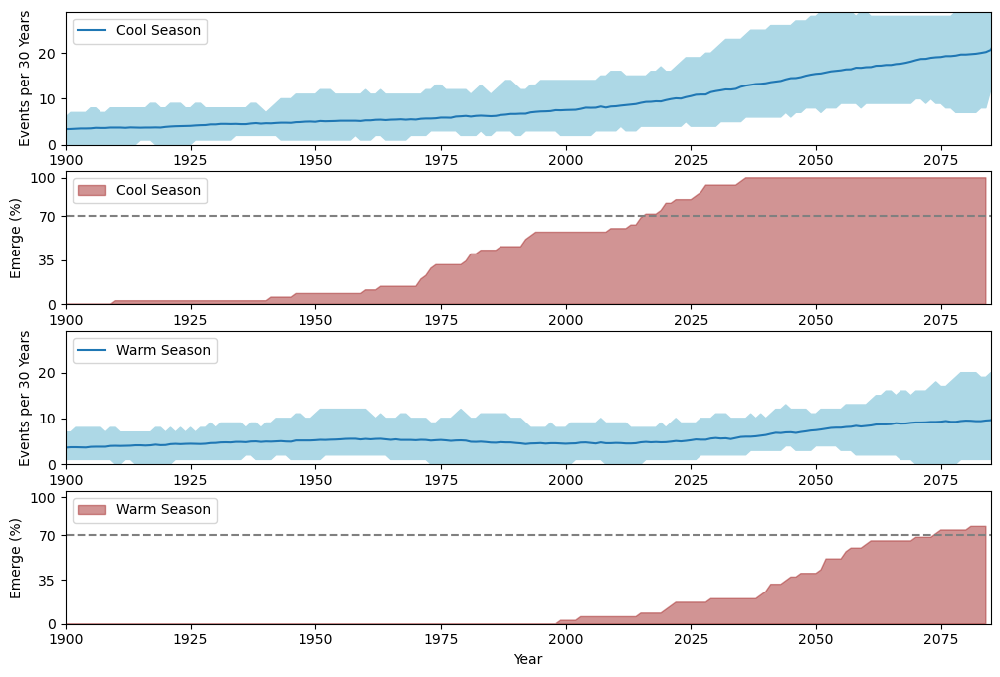

In [11]:
%run {_work_dir}/utils/emergence.ipynb

fig = plt.figure(figsize=(9,5))


ax=emergePlotWithModelCount(
    compoundCountsXr.sel(fire='pos',experiment='ssp585',year=slice(1850,2100),drop=True),
    compoundCountsXr.sel(fire='pos',experiment='piControl',drop=True),
    xlim=[1900,2085]
)
plt.xlabel('Year')

ax[0].legend(['Cool Season'], loc='upper left')
ax[1].legend(['Cool Season'], loc='upper left')
ax[2].legend(['Warm Season'], loc='upper left')
ax[3].legend(['Warm Season'], loc='upper left')

ax[0].set_ylim([0,29])
ax[2].set_ylim([0,29])


plt.savefig(f'{_work_dir}/figures/cmip6AllDryEmergence.pdf',bbox_inches='tight')

0.0
10.0


(0.0, 19.0)

<Figure size 900x500 with 0 Axes>

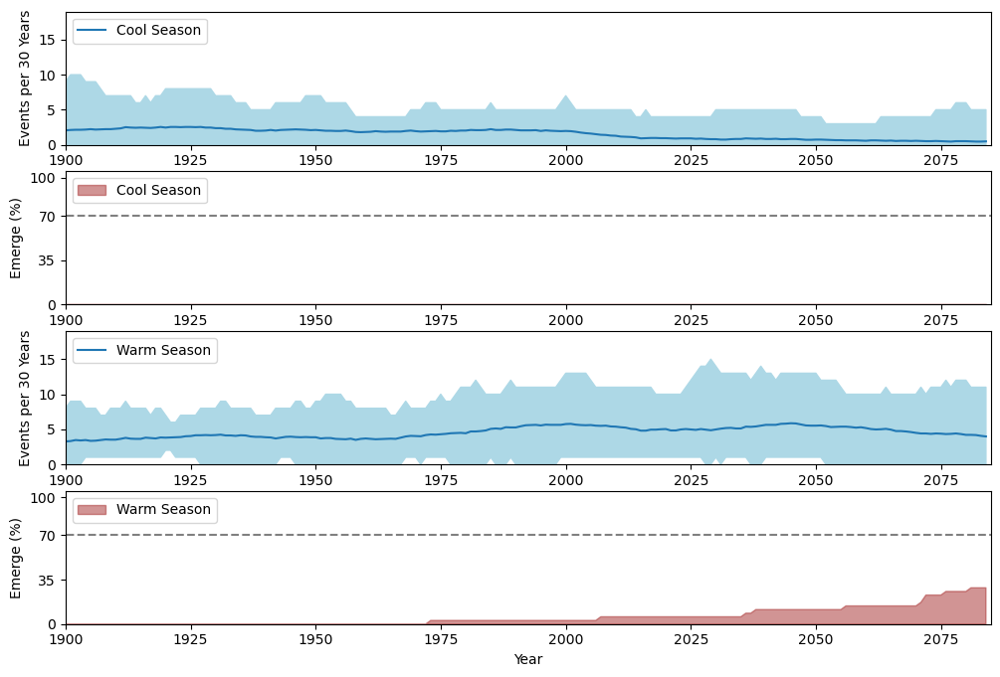

In [13]:
fig = plt.figure(figsize=(9,5))

ax=emergePlotWithModelCount(
    compoundCountsXr.sel(fire='neg',experiment='ssp585',year=slice(1850,2084),drop=True),
    compoundCountsXr.sel(fire='neg',experiment='piControl',drop=True),
    xlim=([1900,2085])
)
plt.xlabel('Year')


ax[0].legend(['Cool Season'], loc='upper left')
ax[1].legend(['Cool Season'], loc='upper left')
ax[2].legend(['Warm Season'], loc='upper left')
ax[3].legend(['Warm Season'], loc='upper left')

ax[0].set_ylim([0,19])
ax[2].set_ylim([0,19])


# plt.savefig('figures/cmip6AllWetEmergence.pdf',bbox_inches='tight')

In [10]:
summaryXr=compoundXr[[
    'ecCombinedDmiSamwinter','ecCombinedDmiSamsummer'
]].sel(experiment='ssp585', year=slice(1850,2099),compound='anyCompound',drop=True)

In [11]:
nEventsCurrentXr=summaryXr.sel(year=slice(1950,1999),drop=True).sum('year')
nEventsFutureXr=summaryXr.sel(year=slice(2050,2099),drop=True).sum('year')


ecCombinedDmiSamwinterDry-Promoting
6.0
2.8922018348623855
2.380952380952381
ecCombinedDmiSamwinterWet-Promoting
0.0
0.21465968586387435
0.5454545454545454
ecCombinedDmiSamsummerDry-Promoting
1.0
1.8513513513513515
1.6363636363636365
ecCombinedDmiSamsummerWet-Promoting
0.75
1.0512820512820513
1.1904761904761905


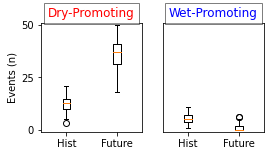

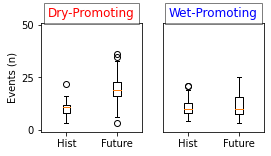

In [12]:
for iIndex in (
    ['ecCombinedDmiSamwinter','Dry-Promoting', 'Wet-Promoting' ],
    ['ecCombinedDmiSamsummer','Dry-Promoting', 'Wet-Promoting' ]
):
    plt.figure(figsize=(4,2))

    ax0=plt.subplot(1,2,1)

    plt.boxplot([
        nEventsCurrentXr[iIndex[0]].sel(fire='pos',drop=True),
        nEventsFutureXr[iIndex[0]].sel(fire='pos',drop=True)
    ])

    plt.xticks(ticks=[1,2],labels=['Hist','Future'])

    ax0.set_yticks(ticks=[0,25,50])
    #ax0.set_yticklabels(labels=[0,50,100])
    plt.ylabel('Events (n)')
    t=plt.title(iIndex[1], color='red')
    t.set_bbox(dict(facecolor='white', alpha=0.5))
    
    
    print(iIndex[0]+iIndex[1])
    print((nEventsFutureXr[iIndex[0]].sel(fire='pos').min()/nEventsCurrentXr[iIndex[0]].sel(fire='pos').min()).values)
    print((nEventsFutureXr[iIndex[0]].sel(fire='pos').mean()/nEventsCurrentXr[iIndex[0]].sel(fire='pos').mean()).values)
    print((nEventsFutureXr[iIndex[0]].sel(fire='pos').max()/nEventsCurrentXr[iIndex[0]].sel(fire='pos').max()).values)
    
    
    
    ax1=plt.subplot(1,2,2,sharey=ax0)

    plt.boxplot([
        nEventsCurrentXr[iIndex[0]].sel(fire='neg',drop=True),
        nEventsFutureXr[iIndex[0]].sel(fire='neg',drop=True)
    ])
    ax1.axes.yaxis.set_visible(False)
    plt.xticks(ticks=[1,2],labels=['Hist','Future'])
    plt.ylim([-1,51])
    t=plt.title(iIndex[2],color='blue')
    t.set_bbox(dict(facecolor='white', alpha=0.5))

    print(iIndex[0]+iIndex[2])
    print((nEventsFutureXr[iIndex[0]].sel(fire='neg').min()/nEventsCurrentXr[iIndex[0]].sel(fire='neg').min()).values)
    print((nEventsFutureXr[iIndex[0]].sel(fire='neg').mean()/nEventsCurrentXr[iIndex[0]].sel(fire='neg').mean()).values)
    print((nEventsFutureXr[iIndex[0]].sel(fire='neg').max()/nEventsCurrentXr[iIndex[0]].sel(fire='neg').max()).values)
    

# And by event type

It looks like there is a trend of increasing number of compounds, so lets look at which event pairs are most common

In [17]:
overlapBinFirePos=overlapBins.binSum(
    compoundXr.sel(fire='pos',experiment='ssp585',year=slice(1850,2099), drop=True)
)

In [18]:
overlapBinFireNeg=overlapBins.binSum(
    compoundXr.sel(fire='neg',experiment='ssp585',year=slice(1850,2099), drop=True)
)

In [15]:
%run {_work_dir}/utils/binPlot.ipynb

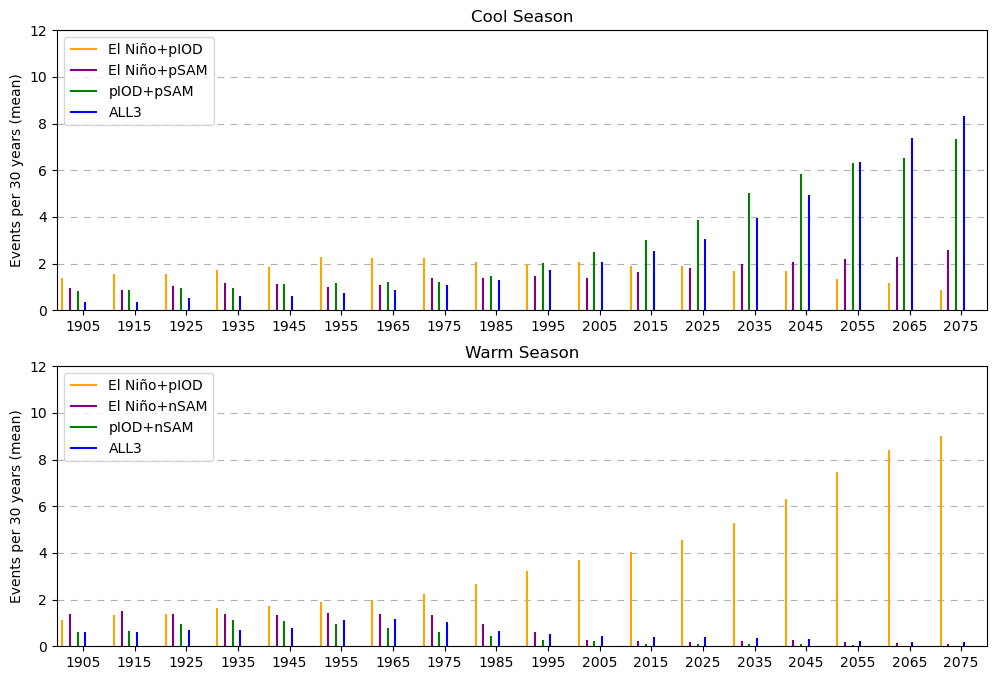

In [19]:
plt.figure(figsize=(12,8))

ax1=plt.subplot(2,1,1)

binPlot(
    overlapBinFirePos['nino34DmiSamwinter'].to_dataset('compound'), 
    ax1
)

ax1.set_ylabel('Events per 30 years (mean)')
ax1.minorticks_off()
ax1.set_ylim([0,12])
plt.xlim([1900,2080])
plt.title('Cool Season')
plt.legend(['El Niño+pIOD','El Niño+pSAM','pIOD+pSAM','ALL3'],loc='upper left')
plt.grid(axis='y', dashes=(6,6))


ax2=plt.subplot(2,1,2)

binPlot(
    overlapBinFirePos['nino34DmiSamsummer'].to_dataset('compound'), 
    ax2
)
ax2.set_ylabel('Events per 30 years (mean)')
ax2.minorticks_off()
ax2.set_ylim([0,12])
plt.xlim([1900,2080])
plt.title('Warm Season')
plt.legend(['El Niño+pIOD','El Niño+nSAM','pIOD+nSAM','ALL3'],loc='upper left')
plt.grid(axis='y', dashes=(6,6))

# plt.savefig('figures/cmip6DryCompoundsByType.pdf',bbox_inches='tight')

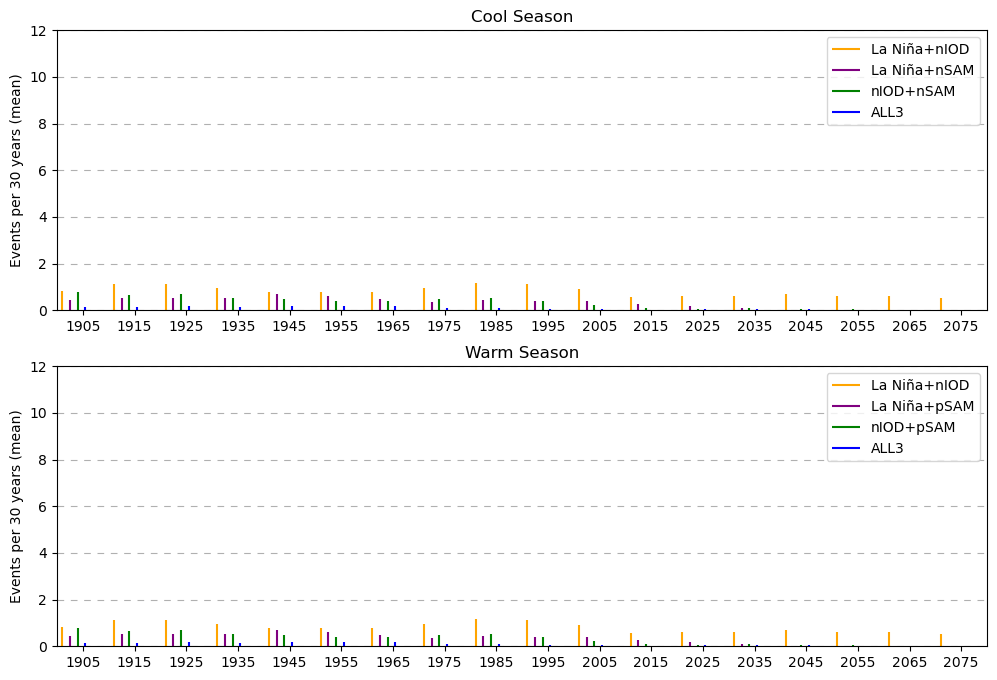

In [20]:
plt.figure(figsize=(12,8))

ax1=plt.subplot(2,1,1)

binPlot(
    overlapBinFireNeg['nino34DmiSamwinter'].to_dataset('compound'), 
    ax1
)

ax1.set_ylabel('Events per 30 years (mean)')
ax1.minorticks_off()
ax1.set_ylim([0,12])
plt.xlim([1900,2080])
plt.title('Cool Season')
plt.legend(['La Niña+nIOD','La Niña+nSAM','nIOD+nSAM', 'ALL3'])
plt.grid(axis='y', dashes=(6,6))


ax2=plt.subplot(2,1,2)

binPlot(
    overlapBinFireNeg['nino34DmiSamwinter'].to_dataset('compound'), 
    ax2
)
ax2.set_ylabel('Events per 30 years (mean)')
ax2.minorticks_off()
ax2.set_ylim([0,12])
plt.xlim([1900,2080])
plt.title('Warm Season')
plt.legend(['La Niña+nIOD','La Niña+pSAM','nIOD+pSAM', 'ALL3'])
plt.grid(axis='y', dashes=(6,6))

# plt.savefig('figures/cmip6WetCompoundsByType.pdf',bbox_inches='tight')

# Time of emergence - Fire Pos / Dry

Do a plot to show time of emergence.
Using mean/min/max in each interval as the trend, and number of events (95%CI) in piControl as the baseline

In [21]:
indexSet = 'nino34DmiSam' #'ecCombinedDmiSam'
compounds = [
    'all3','enso+iod','enso+sam','iod+sam'
]
rollingFirePos=firePos.rolling(year=30,min_periods=15,center=True).sum('year')
rollingFireNeg=fireNeg.rolling(year=30,min_periods=15,center=True).sum('year')

In [23]:
%run {_work_dir}/utils/emergence.ipynb

In [20]:
piConPos.ecCombinedDmiSamwinter.isel(model=-4)

<xarray.DataArray 'ecCombinedDmiSamwinter' (compound: 9, year: 4997)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
  * year      (year) int64 1 2 3 4 5 6 7 ... 6193 6194 6195 6196 6197 6198 6199
    model     <U10 'MRI-ESM2-0'
  * compound  (compound) object 'nEvents' 'all3' ... 'sam' 'anyCompound'
Attributes:
    indexNames:  ['ecCombined', 'dmi', 'samWinter']
    indeces:     ['enso', 'iod', 'sam']
    pairs:       ['enso+iod', 'enso+sam', 'iod+sam']
    others:      ['all3', 'anyCompound', 'nEvents']

34.0
2.0
21.0
24.0


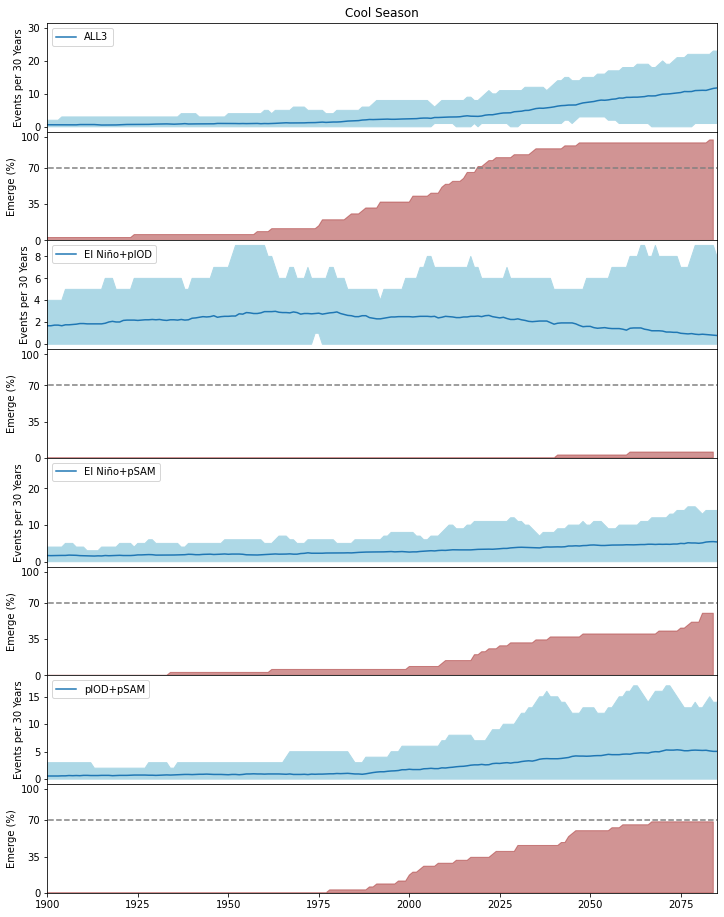

In [21]:
ax=emergePlotWithModelCount(
    rollingFirePos.ecCombinedDmiSamwinter.sel(compound=compounds).to_dataset('compound'), 
    piConPos.ecCombinedDmiSamwinter.sel(compound=compounds).to_dataset('compound').rolling(year=30,min_periods=15,center=True).sum('year'),
    xlim=[1900,2085]
)

ax[0].set_title('Cool Season')
ax[0].legend(['ALL3'], loc='upper left')
ax[2].legend(['El Niño+pIOD'], loc='upper left')
ax[4].legend(['El Niño+pSAM'], loc='upper left')
ax[6].legend(['pIOD+pSAM'], loc='upper left')


[axx.set_xticklabels([]) for axx in ax[:-1]]

plt.subplots_adjust(hspace=0)




1.0
33.0
0.0
0.0


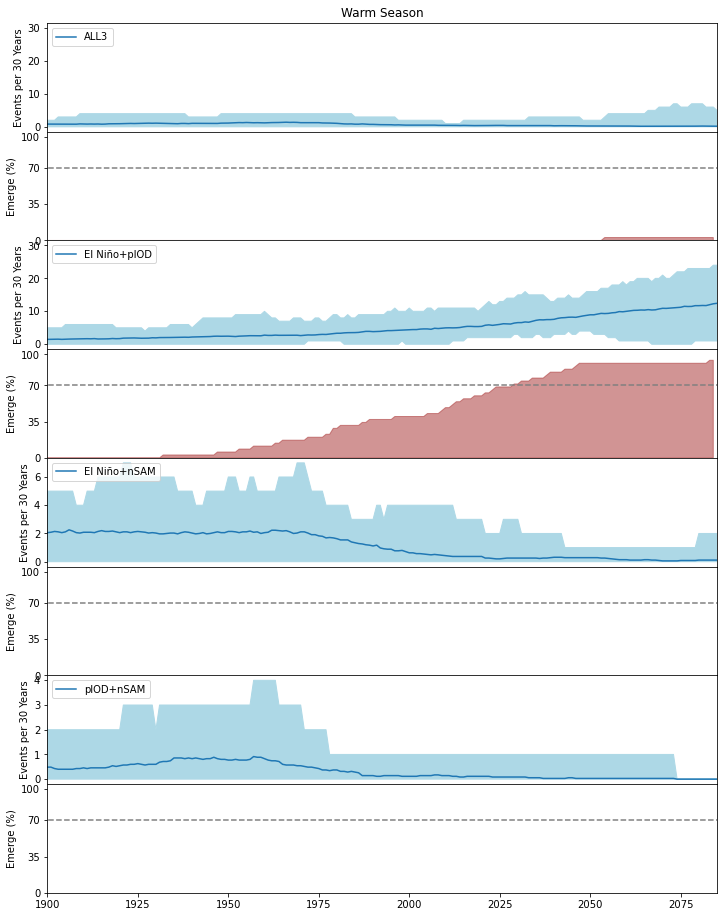

In [22]:
ax=emergePlotWithModelCount(
    rollingFirePos.ecCombinedDmiSamsummer.sel(compound=compounds).to_dataset('compound'), 
    piConPos.ecCombinedDmiSamsummer.sel(compound=compounds).to_dataset('compound').rolling(year=30,min_periods=15,center=True).sum('year'),
    xlim=[1900,2085]
)

ax[0].set_title('Warm Season')
ax[0].legend(['ALL3'], loc='upper left')
ax[2].legend(['El Niño+pIOD'], loc='upper left')
ax[4].legend(['El Niño+nSAM'], loc='upper left')
ax[6].legend(['pIOD+nSAM'], loc='upper left')


[axx.set_xticklabels([]) for axx in ax[:-1]]

plt.subplots_adjust(hspace=0)




As there is a trend towards SAM dominating, plot how SAM events are compounding the precvioudly ENSO/IOD only to create a greater impact.

<Figure size 900x500 with 0 Axes>

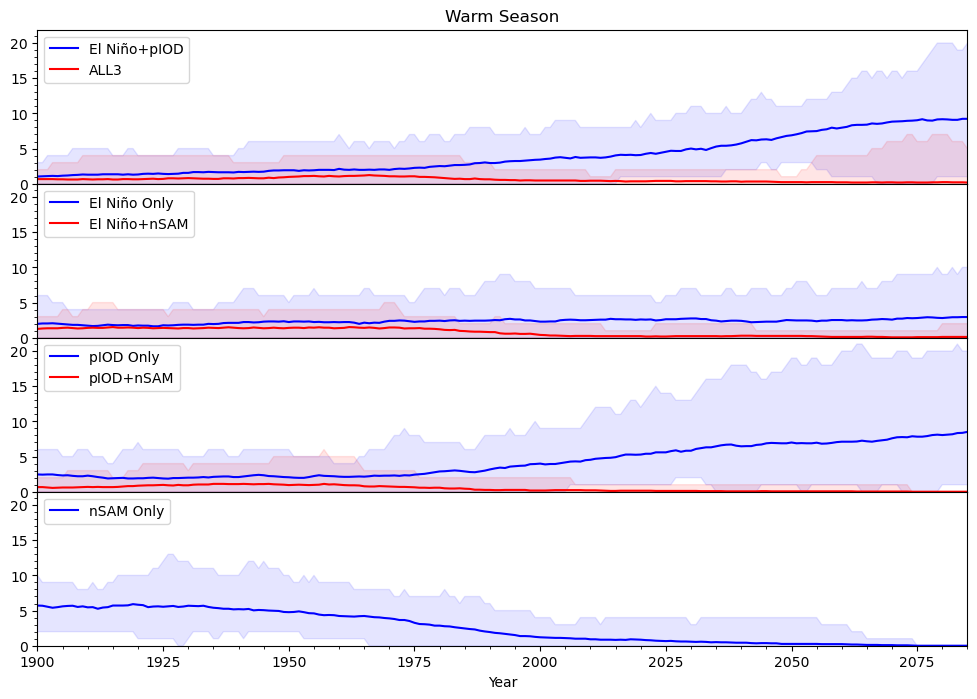

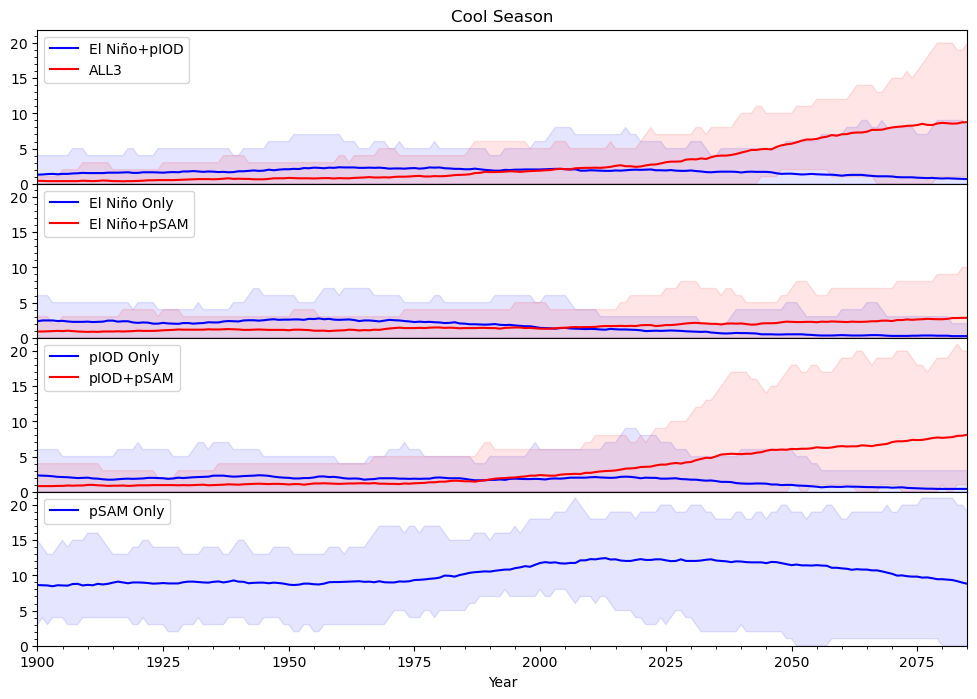

In [24]:
fig = plt.figure(figsize=(9,5))

for iSeason,iTitle in {('winter','Cool Season'),('summer','Warm Season')}:
    plt.figure(figsize=(12,8))
    axx=list()
    iPlot=1
    for indexPair in [
        ['enso+iod','all3'],
        ['enso','enso+sam'],
        ['iod','iod+sam'],
        ['sam']
    ]:
        axx.append(plt.subplot(4,1,iPlot))
        overlaidEmergePlot(
            rollingFirePos[indexSet+iSeason].sel(
                compound=indexPair
            ).to_dataset('compound')
        )
        plt.ylabel('')
        plt.xlim([1900,2085])
        plt.ylim([0,21.9])
        iPlot=iPlot+1

    plt.subplots_adjust(hspace=0)
    axx[0].set_title(iTitle)

    [ax.set_xticklabels([]) for ax in axx[:-1]]

    
    axx[0].legend(['El Niño+pIOD','ALL3'], loc='upper left')
    if iSeason=='winter':
        axx[1].legend(['El Niño Only','El Niño+pSAM'], loc='upper left')
        axx[2].legend(['pIOD Only','pIOD+pSAM'], loc='upper left')
        axx[3].legend(['pSAM Only'], loc='upper left')
    elif iSeason=='summer':
        axx[1].legend(['El Niño Only','El Niño+nSAM'], loc='upper left')
        axx[2].legend(['pIOD Only','pIOD+nSAM'], loc='upper left')
        axx[3].legend(['nSAM Only'], loc='upper left')

    # plt.savefig('figures/cmip6Dry'+iSeason.capitalize() + 'CompoundTrendCurated.pdf',bbox_inches='tight')

# Time of Emergence - Fire Neg / Wet

0.0
2.0
0.0
0.0


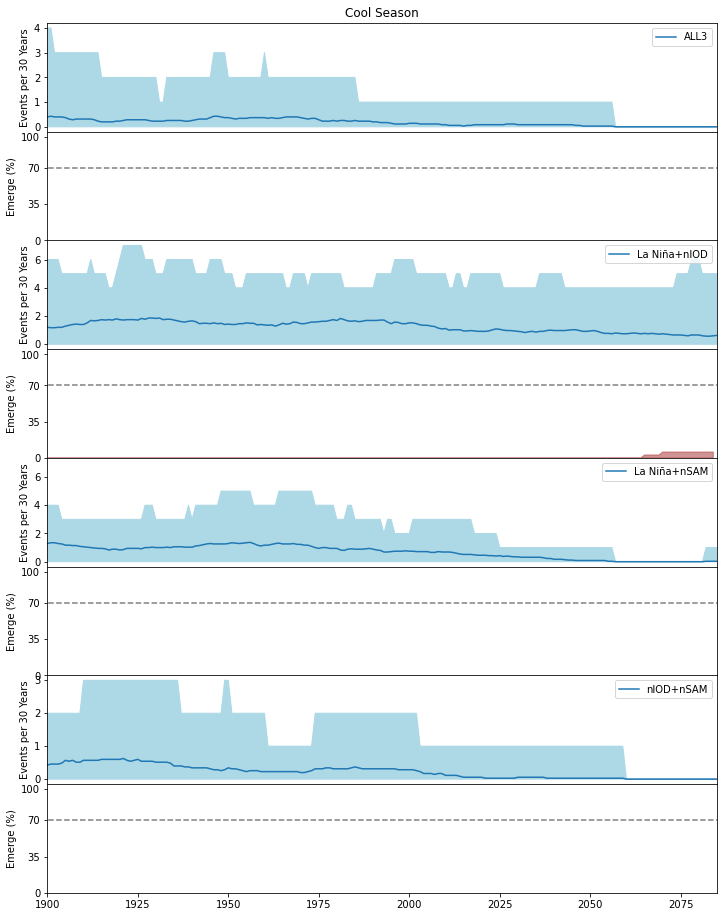

In [24]:
ax=emergePlotWithModelCount(
    fireNeg.ecCombinedDmiSamwinter.sel(compound=compounds).to_dataset('compound').rolling(year=30,min_periods=15,center=True).sum('year'), 
    piConNeg.ecCombinedDmiSamwinter.sel(compound=compounds).to_dataset('compound').rolling(year=30,min_periods=15,center=True).sum('year'),
    xlim=[1900,2085]
)

ax[0].set_title('Cool Season')
ax[0].legend(['ALL3'])
ax[2].legend(['La Niña+nIOD'])
ax[4].legend(['La Niña+nSAM'])
ax[6].legend(['nIOD+nSAM'])

[axx.set_xticklabels([]) for axx in ax[:-1]]

plt.subplots_adjust(hspace=0)




4.0
0.0
17.0
0.0


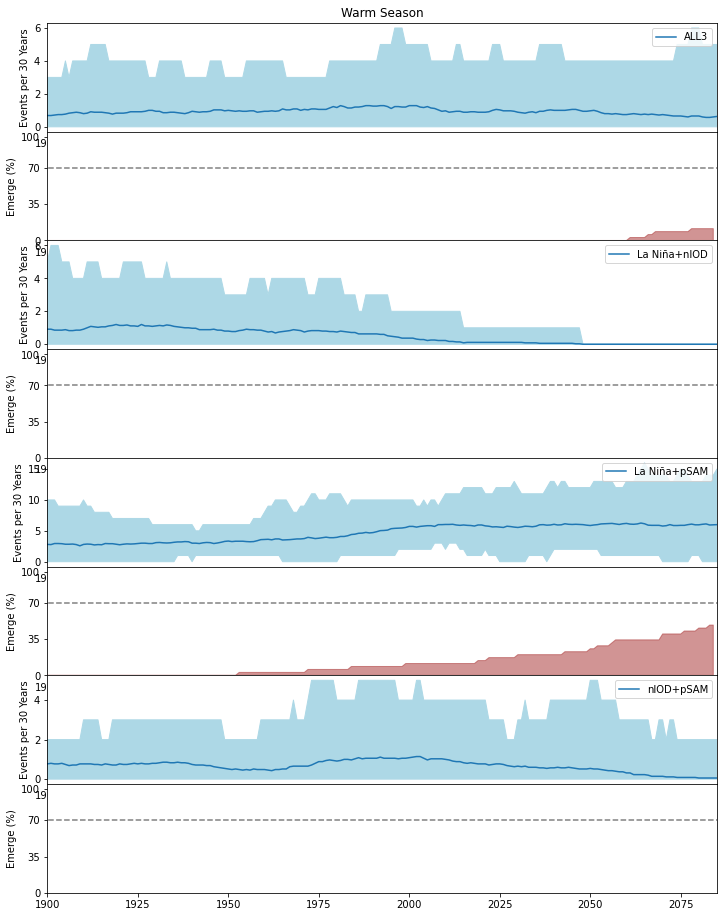

In [25]:
ax=emergePlotWithModelCount(
    fireNeg.ecCombinedDmiSamsummer.sel(compound=compounds).to_dataset('compound').rolling(year=30,min_periods=15,center=True).sum('year'), 
    piConNeg.ecCombinedDmiSamsummer.sel(compound=compounds).to_dataset('compound').rolling(year=30,min_periods=15,center=True).sum('year'),
    xlim=[1900,2085]
)

ax[0].set_title('Warm Season')
ax[0].legend(['ALL3'])
ax[2].legend(['La Niña+nIOD'])
ax[4].legend(['La Niña+pSAM'])
ax[6].legend(['nIOD+pSAM'])


plt.subplots_adjust(hspace=0)




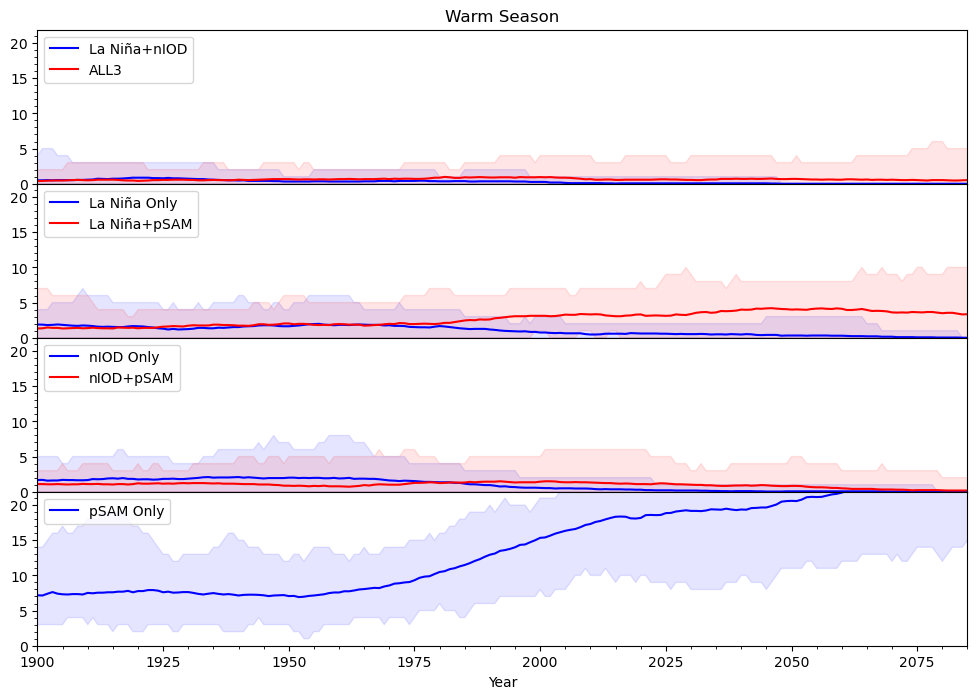

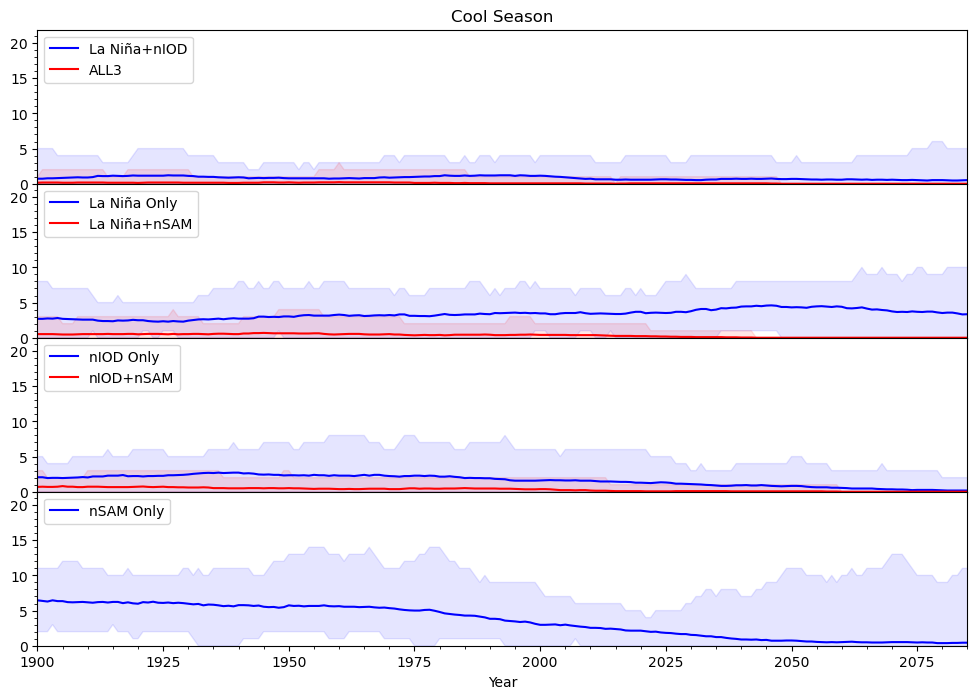

In [26]:
for iSeason,iTitle in {('winter','Cool Season'),('summer','Warm Season')}:
    plt.figure(figsize=(12,8))
    axx=list()
    iPlot=1
    for indexPair in [
        ['enso+iod','all3'],
        ['enso','enso+sam'],
        ['iod','iod+sam'],
        ['sam']
    ]:
        axx.append(plt.subplot(4,1,iPlot))
        overlaidEmergePlot(
            rollingFireNeg[indexSet+iSeason].sel(
                compound=indexPair
            ).to_dataset('compound')
        )
        plt.ylabel('')
        plt.xlim([1900,2085])
        plt.ylim([0,21.9])
        iPlot=iPlot+1

    plt.subplots_adjust(hspace=0)
    axx[0].set_title(iTitle)

    [ax.set_xticklabels([]) for ax in axx[:-1]]

    axx[0].legend(['La Niña+nIOD','ALL3'], loc='upper left')
    if iSeason=='winter':
        axx[1].legend(['La Niña Only','La Niña+nSAM'], loc='upper left')
        axx[2].legend(['nIOD Only','nIOD+nSAM'], loc='upper left')
        axx[3].legend(['nSAM Only'], loc='upper left')
    elif iSeason=='summer':
        axx[1].legend(['La Niña Only','La Niña+pSAM'], loc='upper left')
        axx[2].legend(['nIOD Only','nIOD+pSAM'], loc='upper left')
        axx[3].legend(['pSAM Only'], loc='upper left')

    
    # plt.savefig('figures/cmip6Wet'+iSeason.capitalize() + 'CompoundTrendCurated.pdf',bbox_inches='tight')
    plt.show()

# Index comparisons - ENSO Combined

enso+iod


(1900.0, 2075.0)

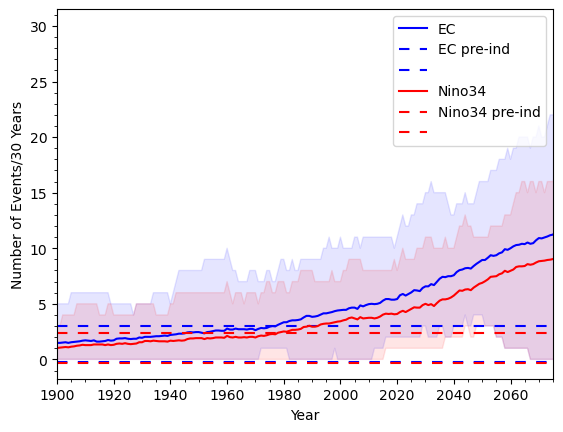

In [34]:
print('enso+iod')
overlaidEmergePlot(
        firePos[[
            'ecCombinedDmiSamsummer','nino34DmiSamsummer'
               ]].sel(compound='enso+iod').rolling(year=30,min_periods=15,center=True).sum('year'), 
        piConPos[[
            'ecCombinedDmiSamsummer','nino34DmiSamsummer'
                ]].sel(compound='enso+iod').rolling(year=30,min_periods=15,center=True).sum('year') 
)
plt.legend(['EC','EC pre-ind',None,'Nino34','Nino34 pre-ind', None])
plt.xlim([1900,2075])


enso+iod


(1900.0, 2075.0)

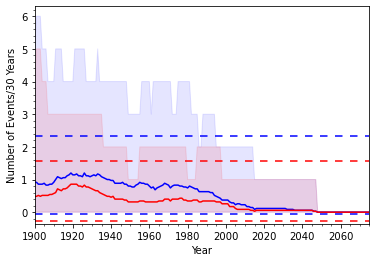

In [28]:
print('enso+iod')
overlaidEmergePlot(
        fireNeg[[
            'ecCombinedDmiSamsummer','nino34DmiSamsummer'
               ]].sel(compound='enso+iod').rolling(year=30,min_periods=15,center=True).sum('year'), 
        piConNeg[[
            'ecCombinedDmiSamsummer','nino34DmiSamsummer'
                ]].sel(compound='enso+iod').rolling(year=30,min_periods=15,center=True).sum('year') 
)
#plt.legend(['El Niño+East IO','El Niño+DMI'])
plt.xlim([1900,2075])


# Index comparisons - ENSO E vs C

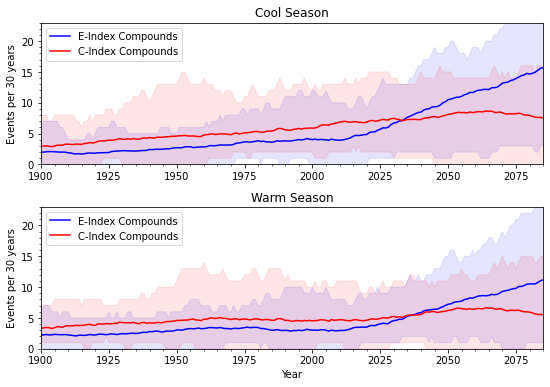

In [29]:
plt.figure(figsize=(9,6))
compounds=['enso+iod','enso+sam','all3']

for i,iSeason,iTitle in [[1,'winter', 'Cool Season'],[2,'summer', 'Warm Season']]:

    data_vars=[
        'eIndexDmiSam'+iSeason,'cIndexDmiSam'+iSeason
   ]
    
    ax=plt.subplot(2,1,i)
    overlaidEmergePlot(
            firePos[data_vars].sel(compound=compounds).any('compound').rolling(year=30,min_periods=15,center=True).sum('year'), 
            #piConPos[data_vars].sel(compound=compounds).any('compound').where(
            #            piConPos.eIndexDmiSamsummer.isnull()==False
            #        ).rolling(year=30,min_periods=15,center=True).sum('year') 
    )
    if i==1:
        plt.xlabel('')
    plt.legend(['E-Index Compounds','C-Index Compounds'], loc='upper left')
    plt.ylabel('Events per 30 years')
    plt.title(iTitle)
    plt.xlim([1900,2085])
    plt.ylim([0,23])

    
plt.subplots_adjust(hspace=0.3)

    
    
plt.savefig(
    'figures/cmipEVsCIndexEmergence.pdf'
    , bbox_inches='tight'
)

not compound enso


(0.0, 20.0)

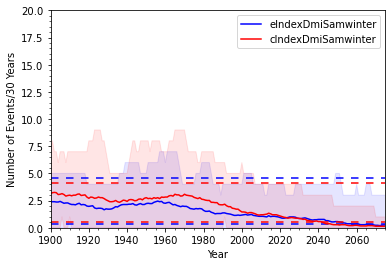

In [30]:
print('not compound enso')
overlaidEmergePlot(
        firePos[[
            'eIndexDmiSamwinter','cIndexDmiSamwinter'
               ]].sel(compound=['enso']).any('compound').rolling(year=30,min_periods=15,center=True).sum('year'), 
        piConPos[[
            'eIndexDmiSamwinter','cIndexDmiSamwinter'
                ]].sel(compound=['enso']).any('compound').where(piConPos.eIndexDmiSamsummer.isnull()==False).rolling(year=30,min_periods=15,center=True).sum('year') 
)
plt.legend()
#plt.legend(['El Niño+East IO','El Niño+DMI'])
plt.xlim([1900,2075])
plt.ylim([0,20])


# Index comparisons - IOD

In [31]:
%run utils/emergence.ipynb

In [32]:
ioSummerXr=compoundXr[['ecCombinedEastioSamsummer', 'ecCombinedDmiSamsummer']]

In [33]:
allIoSummerXr=(
    ioSummerXr.sel(compound='enso+iod')
    +ioSummerXr.sel(compound='all3')
).rolling(year=30,min_periods=15,center=True).sum('year')

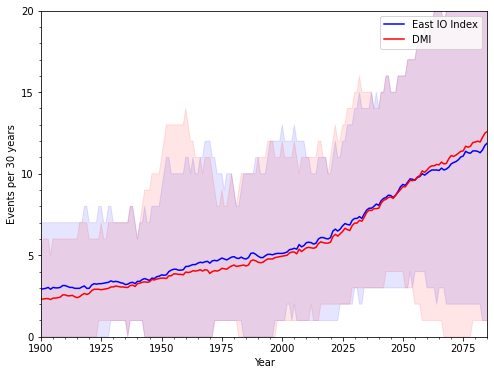

In [34]:
plt.figure(figsize=(8,6))
overlaidEmergePlot(
        allIoSummerXr.sel(fire='pos',experiment='ssp585'), 
)
plt.legend(['East IO Index','DMI'])
plt.xlim([1900,2085])
plt.ylim([0,20])
plt.yticks(range(0,21,5))
plt.ylabel('Events per 30 years')
plt.savefig('figures/ENSO+dmiandEastIOPos.pdf',bbox_inches='tight')

enso+iod


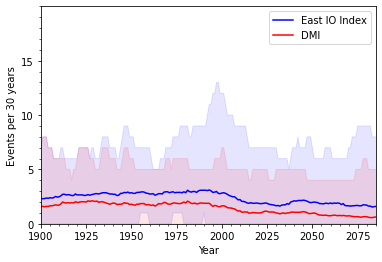

In [35]:
print('enso+iod')
overlaidEmergePlot(
        allIoSummerXr.sel(fire='neg',experiment='ssp585'), 
)
plt.legend(['East IO Index','DMI'])
plt.xlim([1900,2085])
plt.ylim([0,20])
plt.yticks(range(0,16,5))
plt.ylabel('Events per 30 years')
plt.savefig('figures/ENSO+dmiandEastIONeg.pdf',bbox_inches='tight')

# Emergence - Dry 

In [36]:
compoundXr

<xarray.Dataset>
Dimensions:                    (fire: 2, compound: 9, experiment: 2, model: 35, year: 4997)
Coordinates:
  * experiment                 (experiment) object 'piControl' 'ssp585'
  * year                       (year) int64 1 2 3 4 5 ... 6196 6197 6198 6199
  * model                      (model) object 'ACCESS-CM2' ... 'UKESM1-0-LL'
  * compound                   (compound) object 'nEvents' ... 'anyCompound'
  * fire                       (fire) object 'pos' 'neg'
Data variables: (12/16)
    nino34EastioSamwinter      (fire, compound, experiment, model, year) float64 ...
    nino34EastioSamsummer      (fire, compound, experiment, model, year) float64 ...
    nino34DmiSamwinter         (fire, compound, experiment, model, year) float64 ...
    nino34DmiSamsummer         (fire, compound, experiment, model, year) float64 ...
    cIndexEastioSamwinter      (fire, compound, model, experiment, year) float64 ...
    cIndexEastioSamsummer      (fire, compound, model, experiment, year) float64 ...
    ...                         ...
    eIndexDmiSamwinter         (fire, compound, model, experiment, year) float64 ...
    eIndexDmiSamsummer         (fire, compound, model, experiment, year) float64 ...
    ecCombinedEastioSamwinter  (fire, compound, model, experiment, year) float64 ...
    ecCombinedEastioSamsummer  (fire, compound, model, experiment, year) float64 ...
    ecCombinedDmiSamwinter     (fire, compound, model, experiment, year) float64 ...
    ecCombinedDmiSamsummer     (fire, compound, model, experiment, year) float64 ...
Attributes:
    indexNames:  ['ecCombined', 'dmi', 'samWinter']
    indeces:     ['enso', 'iod', 'sam']
    pairs:       ['enso+iod', 'enso+sam', 'iod+sam']
    others:      ['all3', 'anyCompound', 'nEvents']

In [37]:
indexSet = 'ecCombinedDmiSam'
compounds = [
    'anyCompound','all3','enso+iod','enso+sam','iod+sam'
]


pos
winter
anyCompound
ACCESS-CM2


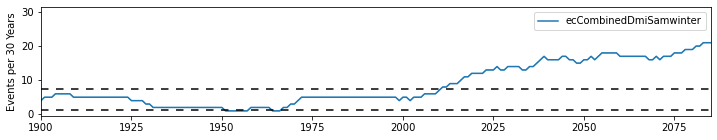

ACCESS-ESM1-5


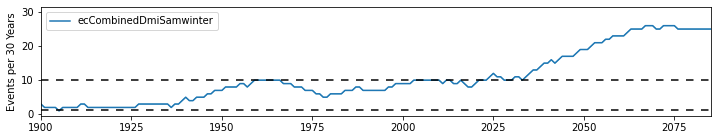

AWI-CM-1-1-MR


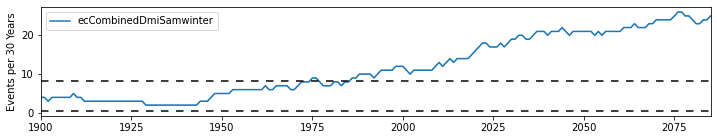

BCC-CSM2-MR


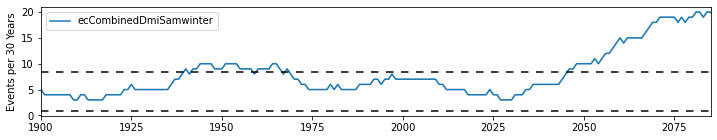

CAMS-CSM1-0


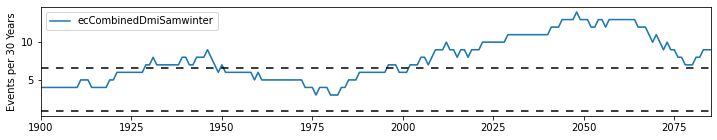

CAS-ESM2-0


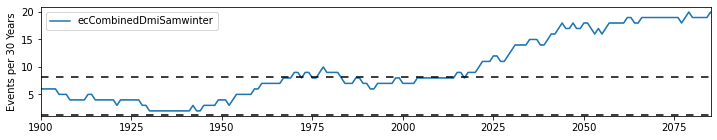

CESM2


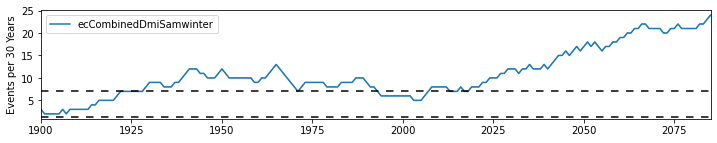

CESM2-WACCM


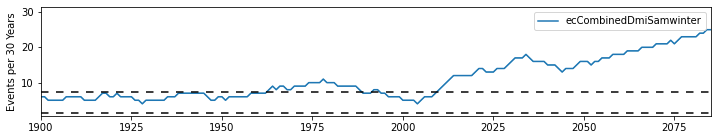

CIESM


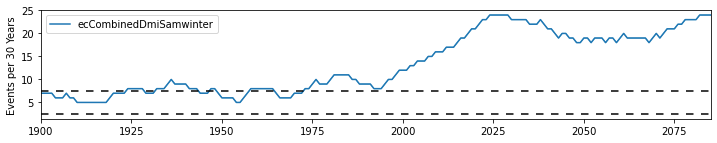

CMCC-CM2-SR5


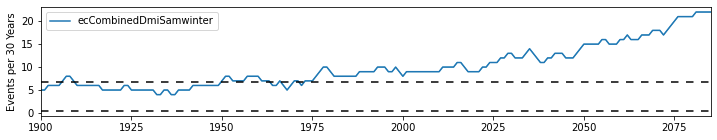

CMCC-ESM2


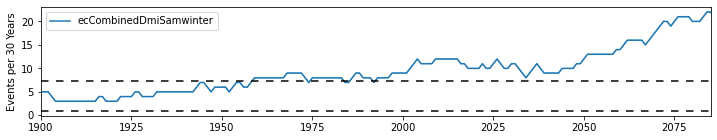

CNRM-CM6-1


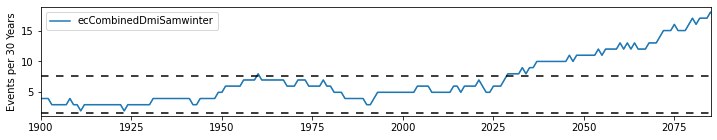

CNRM-ESM2-1


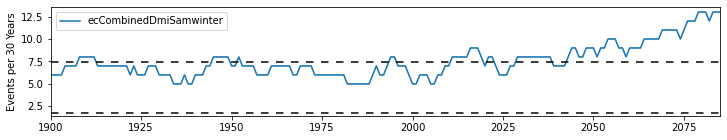

CanESM5


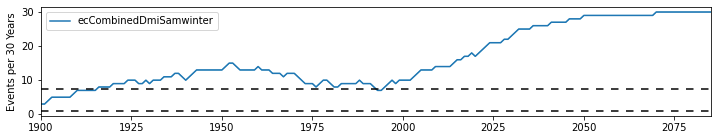

CanESM5-CanOE


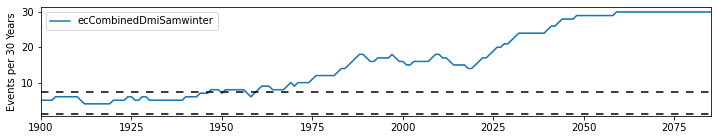

EC-Earth3


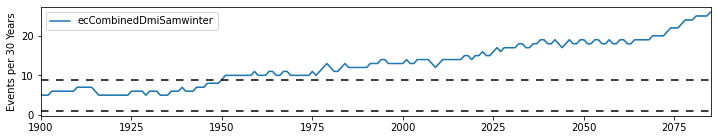

EC-Earth3-CC


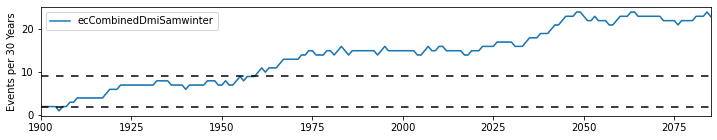

EC-Earth3-Veg


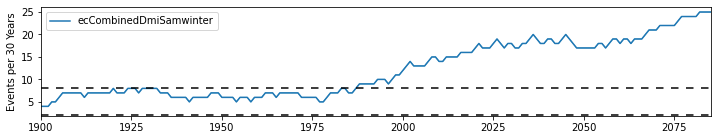

EC-Earth3-Veg-LR


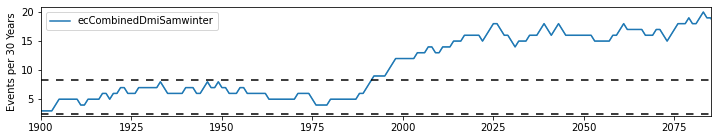

GFDL-CM4


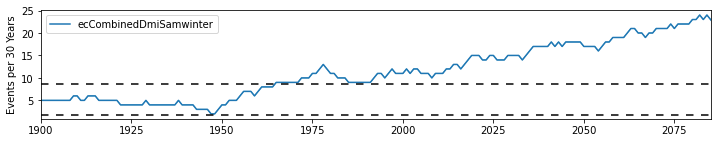

GFDL-ESM4


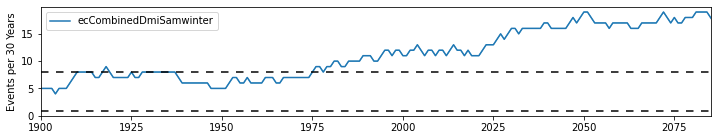

HadGEM3-GC31-LL


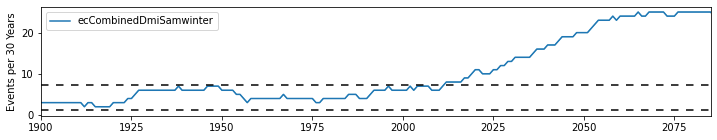

HadGEM3-GC31-MM


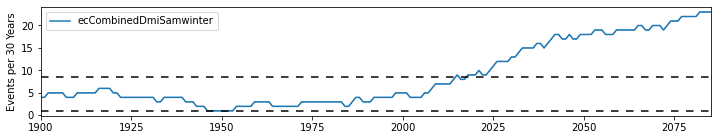

INM-CM4-8


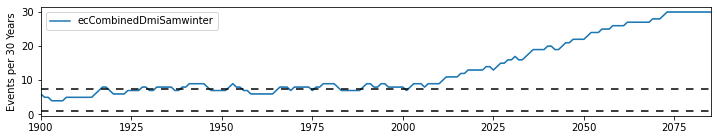

INM-CM5-0


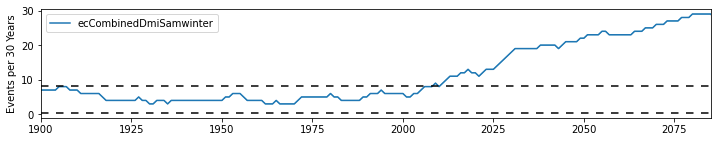

IPSL-CM6A-LR


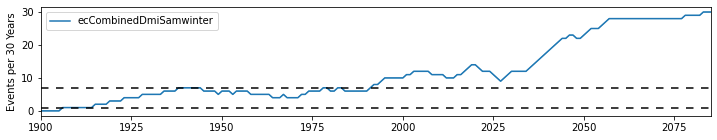

MCM-UA-1-0


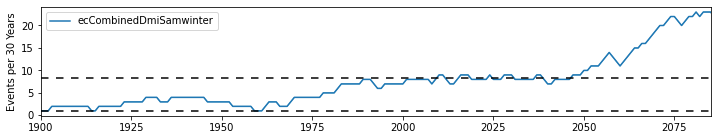

MIROC-ES2L


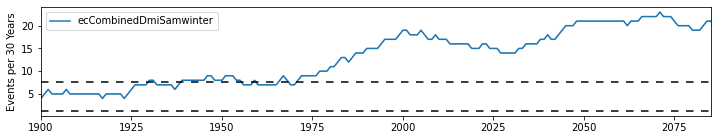

MIROC6


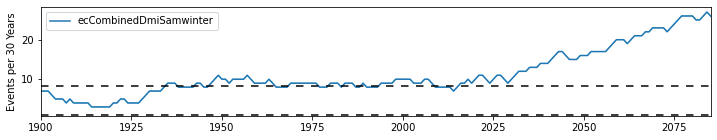

MPI-ESM1-2-HR


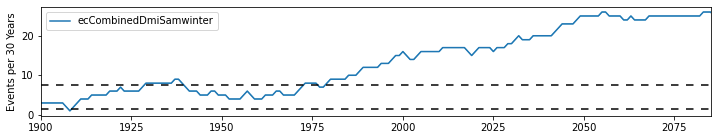

MPI-ESM1-2-LR


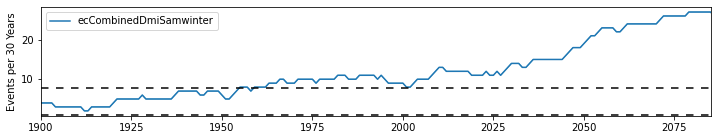

MRI-ESM2-0


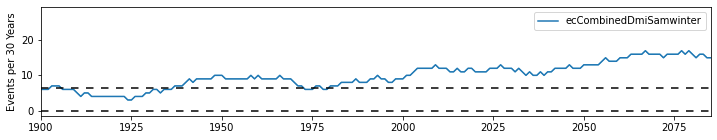

NorESM2-LM


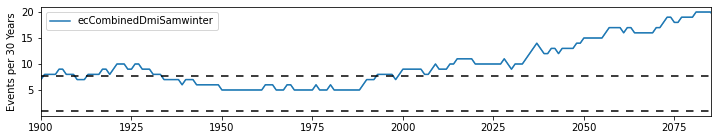

NorESM2-MM


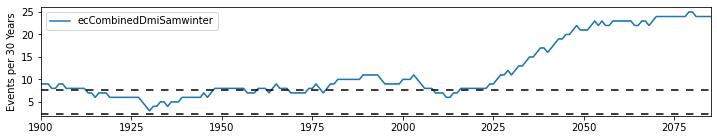

UKESM1-0-LL


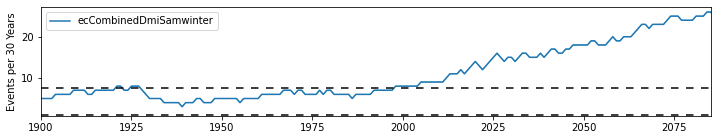

all3
ACCESS-CM2


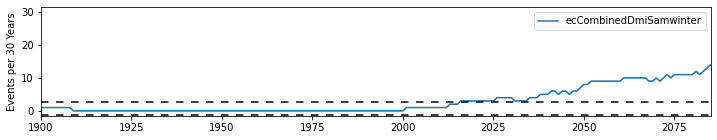

ACCESS-ESM1-5


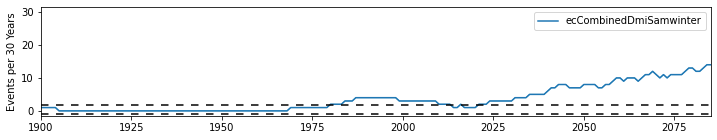

AWI-CM-1-1-MR


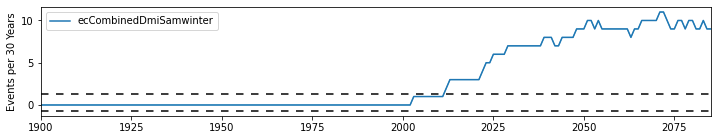

BCC-CSM2-MR


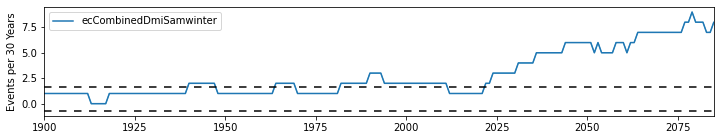

CAMS-CSM1-0


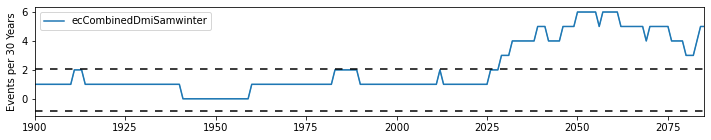

CAS-ESM2-0


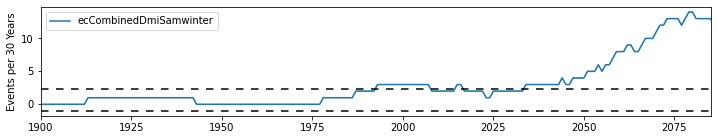

CESM2


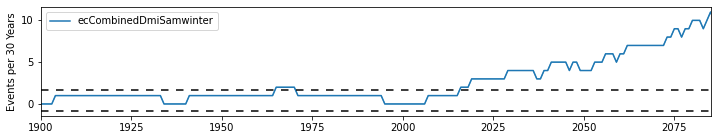

CESM2-WACCM


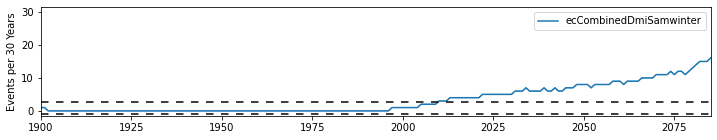

CIESM


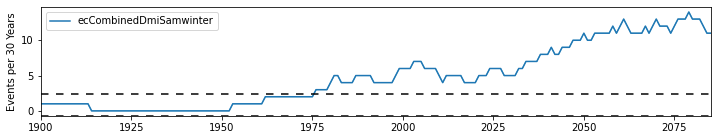

CMCC-CM2-SR5


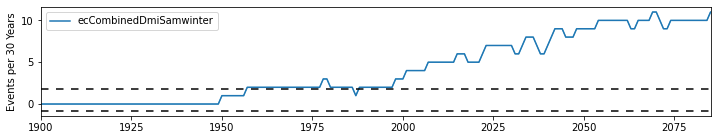

CMCC-ESM2


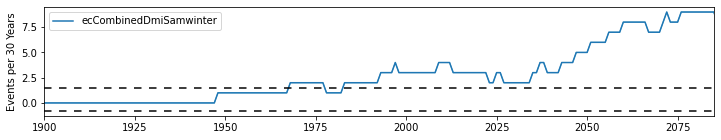

CNRM-CM6-1


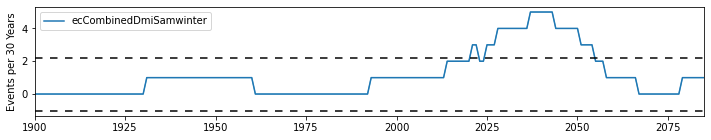

CNRM-ESM2-1


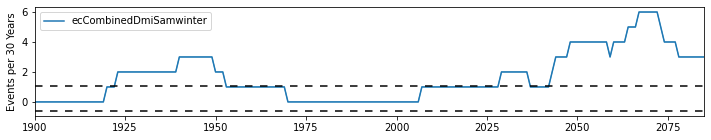

CanESM5


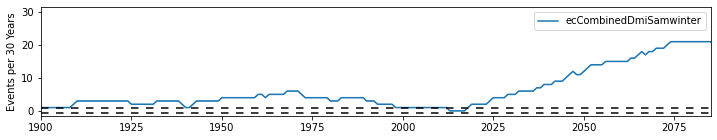

CanESM5-CanOE


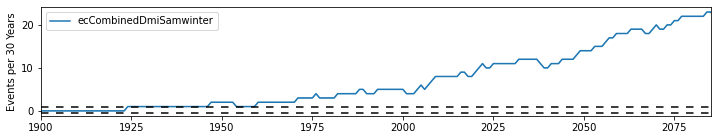

EC-Earth3


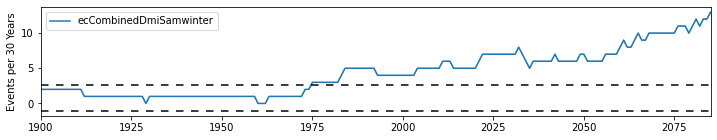

EC-Earth3-CC


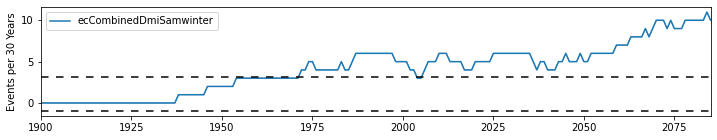

EC-Earth3-Veg


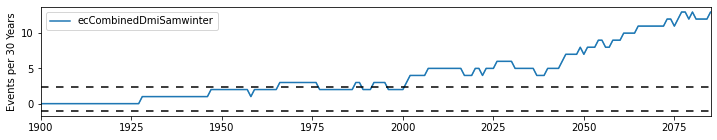

EC-Earth3-Veg-LR


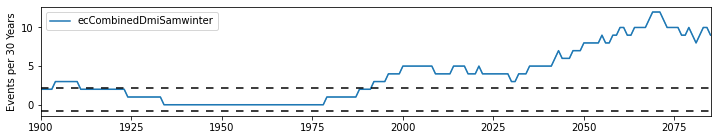

GFDL-CM4


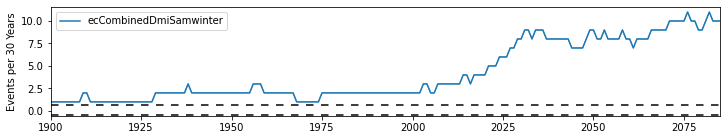

GFDL-ESM4


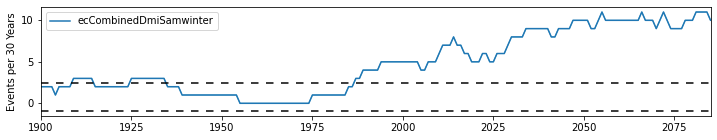

HadGEM3-GC31-LL


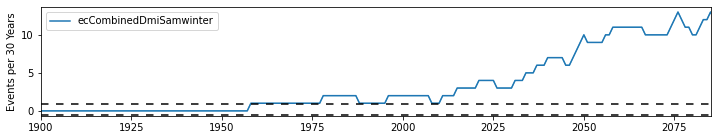

HadGEM3-GC31-MM


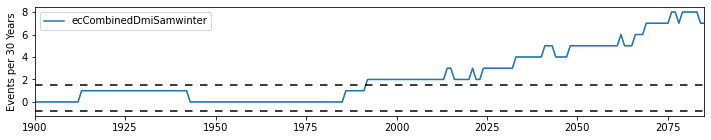

INM-CM4-8


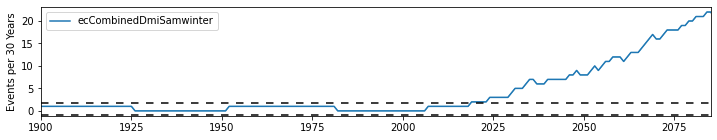

INM-CM5-0


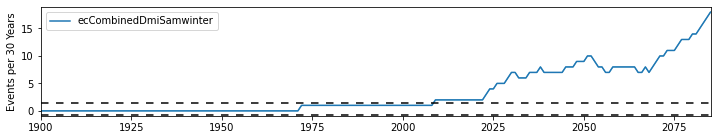

IPSL-CM6A-LR


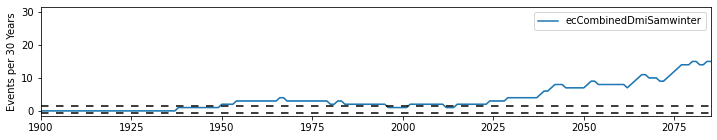

MCM-UA-1-0


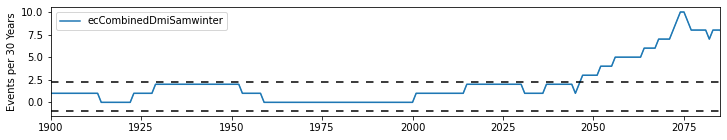

MIROC-ES2L


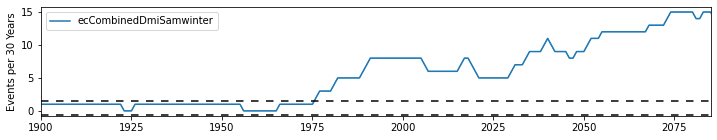

MIROC6


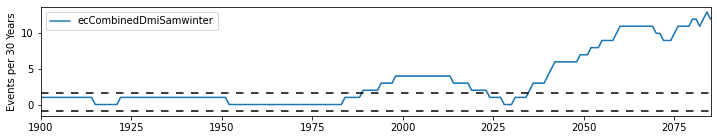

MPI-ESM1-2-HR


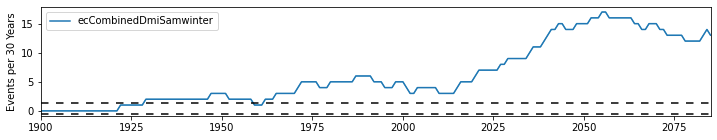

MPI-ESM1-2-LR


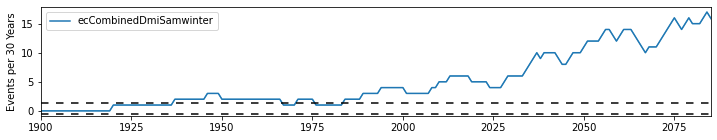

MRI-ESM2-0


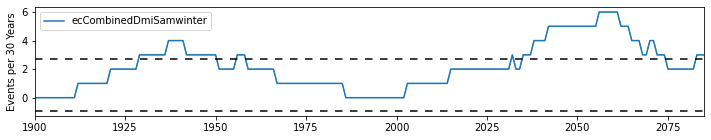

NorESM2-LM


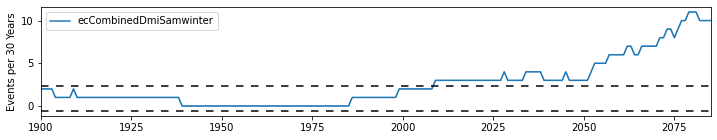

NorESM2-MM


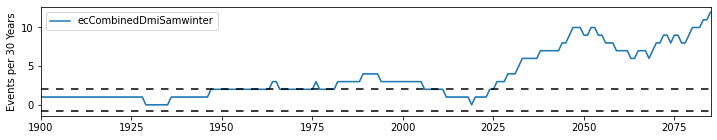

UKESM1-0-LL


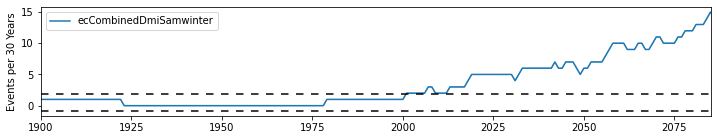

enso+iod
ACCESS-CM2


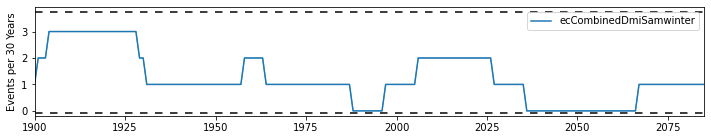

ACCESS-ESM1-5


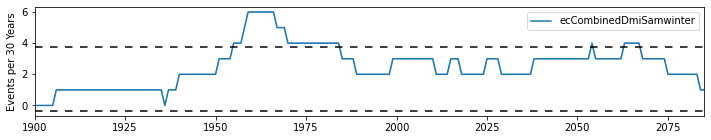

AWI-CM-1-1-MR


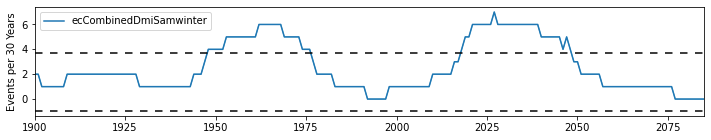

BCC-CSM2-MR


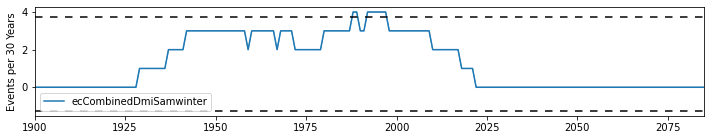

CAMS-CSM1-0


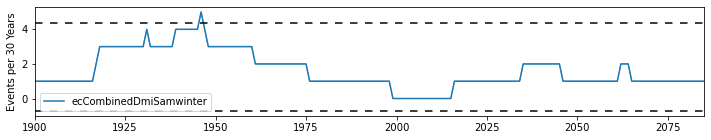

CAS-ESM2-0


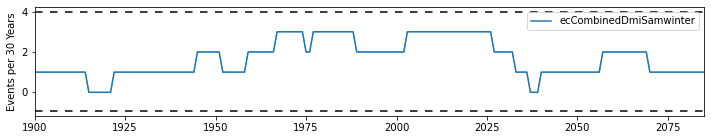

CESM2


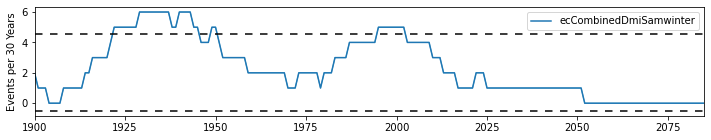

CESM2-WACCM


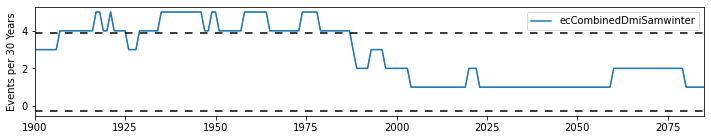

CIESM


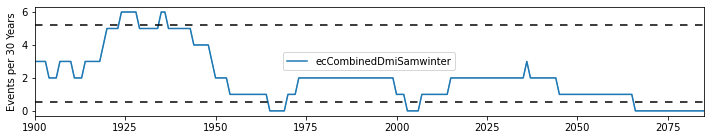

CMCC-CM2-SR5


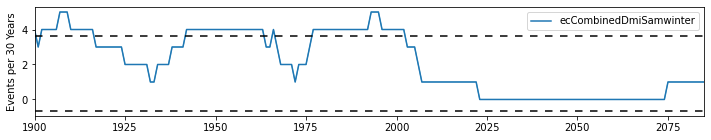

CMCC-ESM2


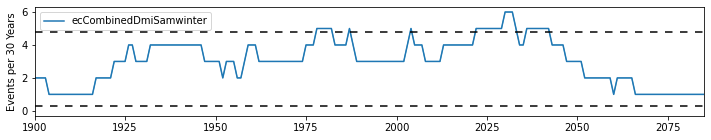

CNRM-CM6-1


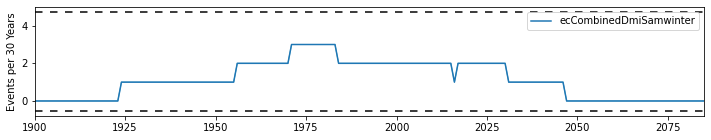

CNRM-ESM2-1


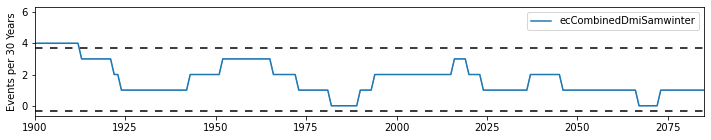

CanESM5


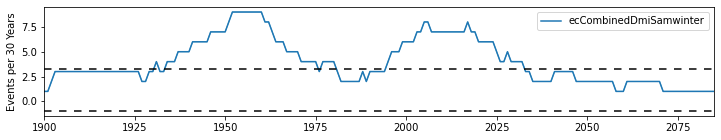

CanESM5-CanOE


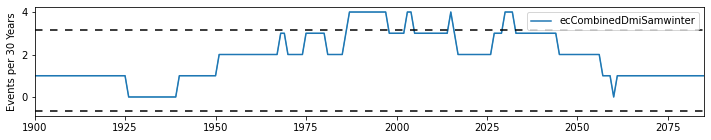

EC-Earth3


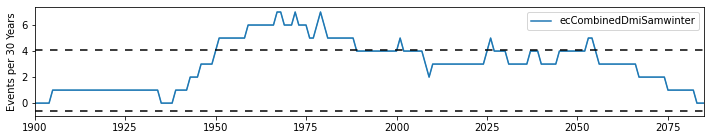

EC-Earth3-CC


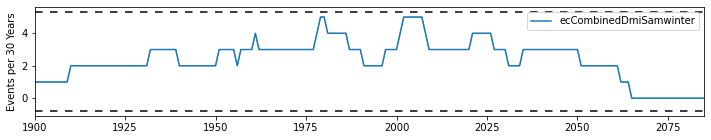

EC-Earth3-Veg


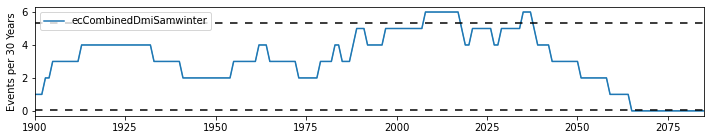

EC-Earth3-Veg-LR


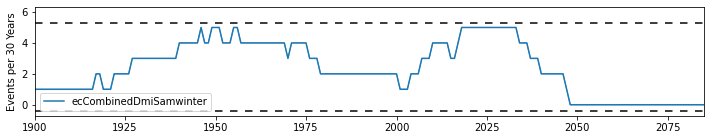

GFDL-CM4


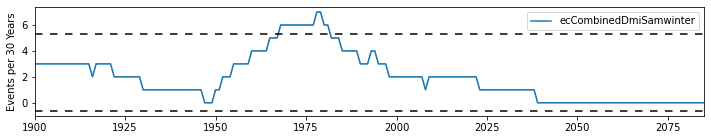

GFDL-ESM4


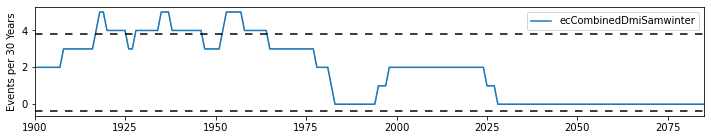

HadGEM3-GC31-LL


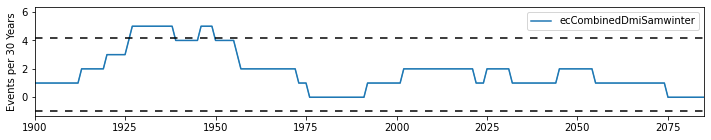

HadGEM3-GC31-MM


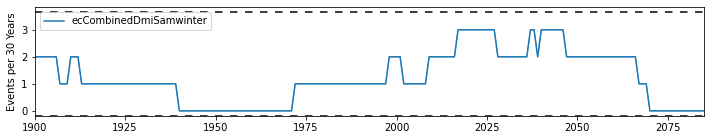

INM-CM4-8


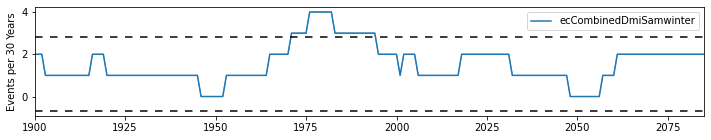

INM-CM5-0


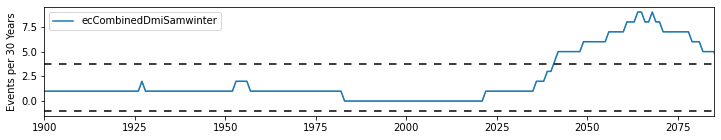

IPSL-CM6A-LR


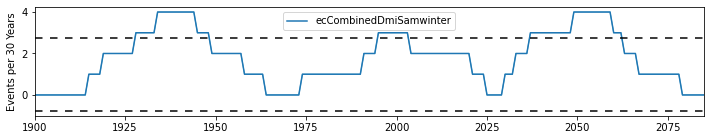

MCM-UA-1-0


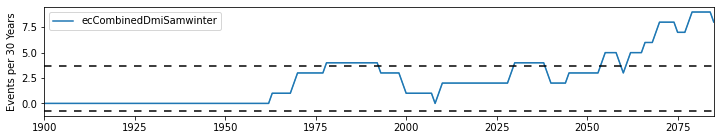

MIROC-ES2L


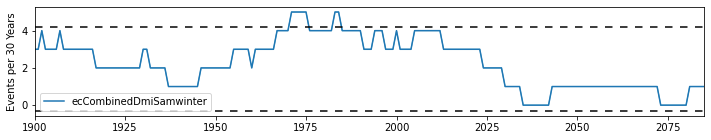

MIROC6


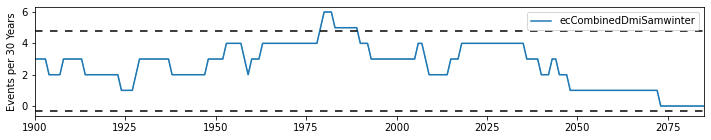

MPI-ESM1-2-HR


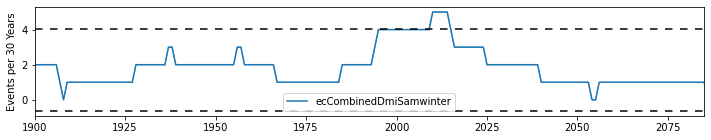

MPI-ESM1-2-LR


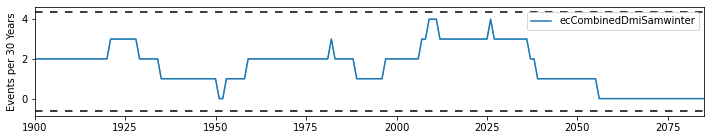

MRI-ESM2-0


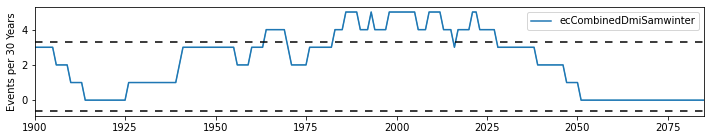

NorESM2-LM


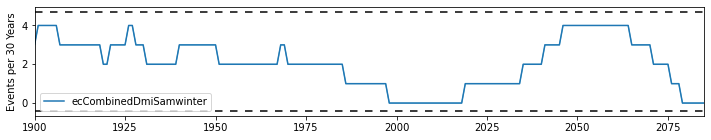

NorESM2-MM


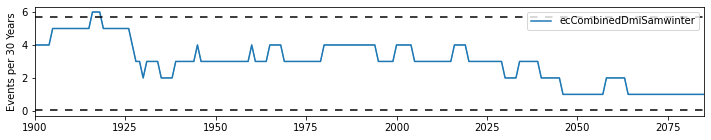

UKESM1-0-LL


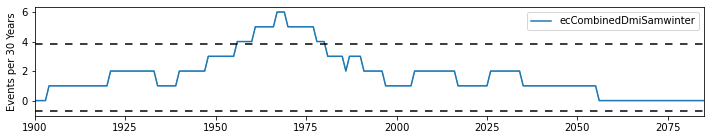

enso+sam
ACCESS-CM2


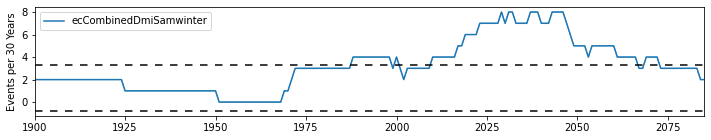

ACCESS-ESM1-5


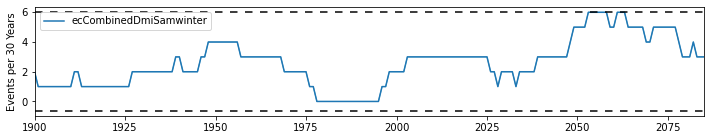

AWI-CM-1-1-MR


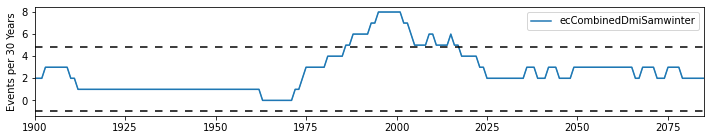

BCC-CSM2-MR


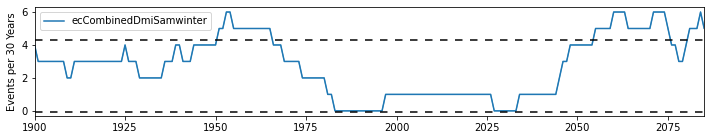

CAMS-CSM1-0


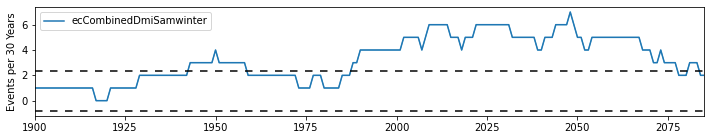

CAS-ESM2-0


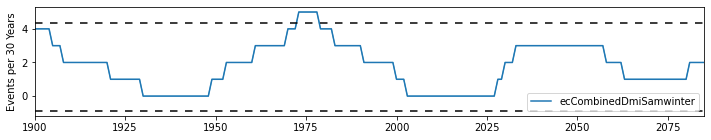

CESM2


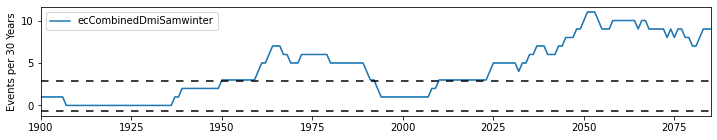

CESM2-WACCM


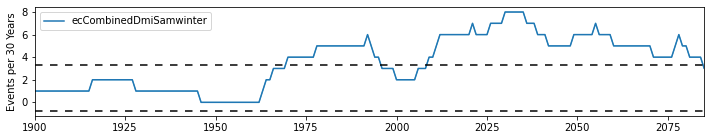

CIESM


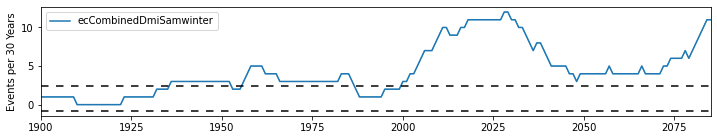

CMCC-CM2-SR5


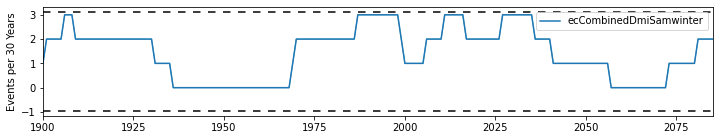

CMCC-ESM2


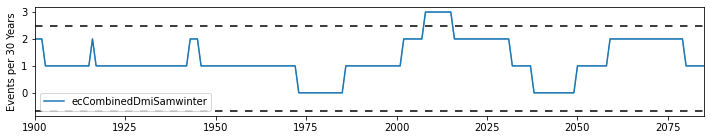

CNRM-CM6-1


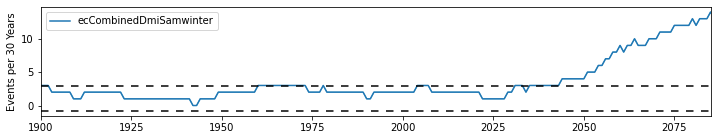

CNRM-ESM2-1


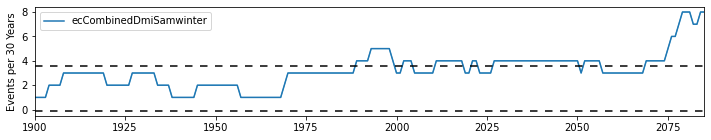

CanESM5


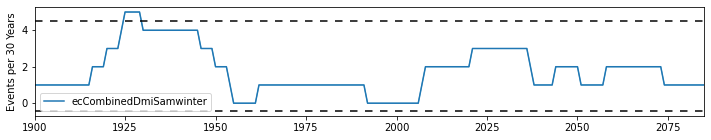

CanESM5-CanOE


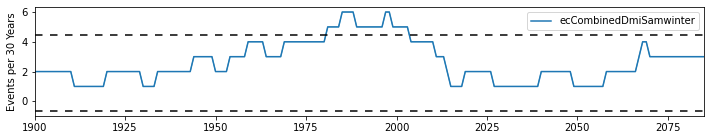

EC-Earth3


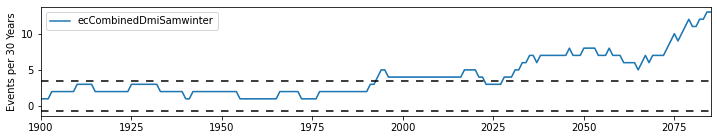

EC-Earth3-CC


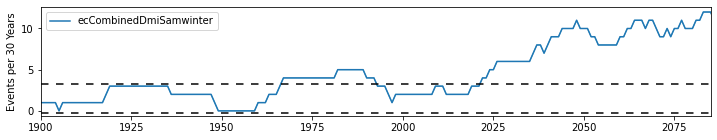

EC-Earth3-Veg


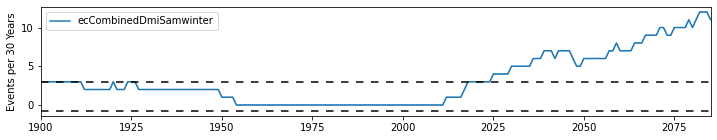

EC-Earth3-Veg-LR


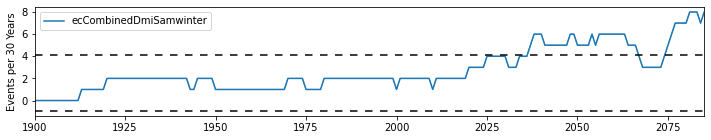

GFDL-CM4


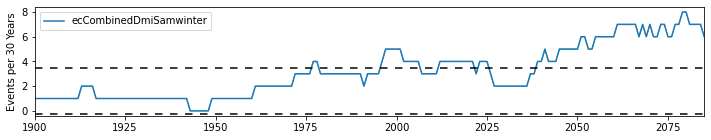

GFDL-ESM4


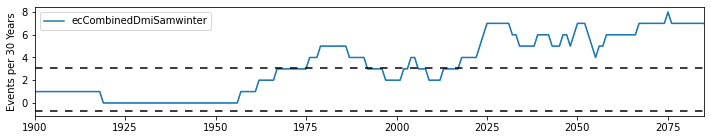

HadGEM3-GC31-LL


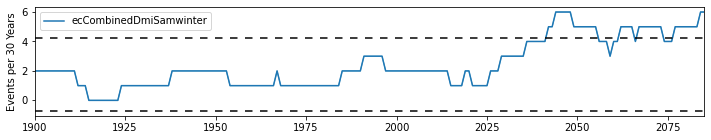

HadGEM3-GC31-MM


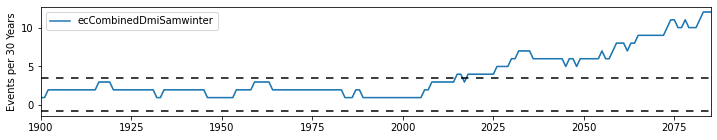

INM-CM4-8


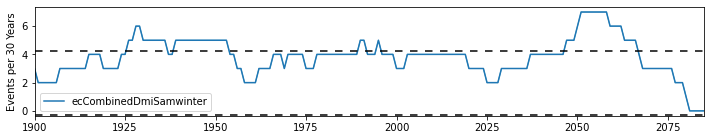

INM-CM5-0


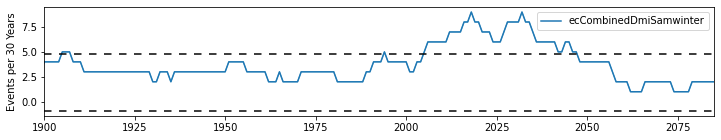

IPSL-CM6A-LR


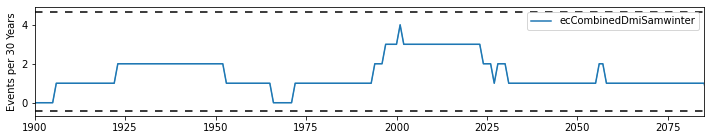

MCM-UA-1-0


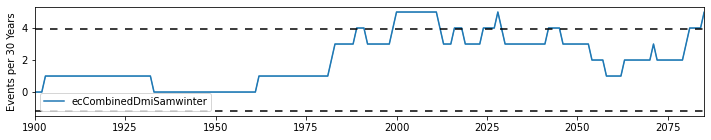

MIROC-ES2L


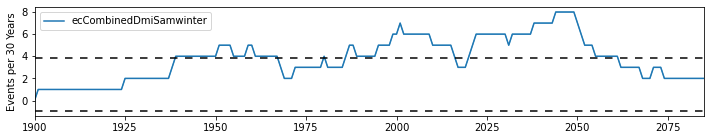

MIROC6


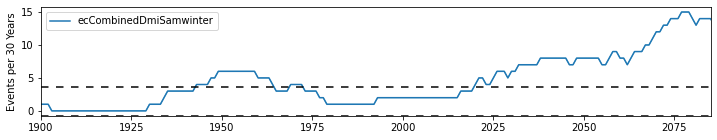

MPI-ESM1-2-HR


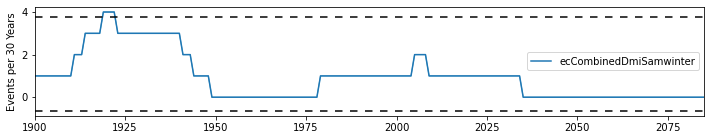

MPI-ESM1-2-LR


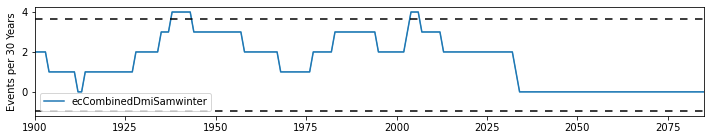

MRI-ESM2-0


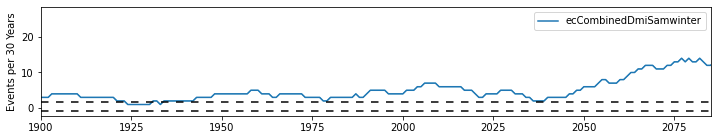

NorESM2-LM


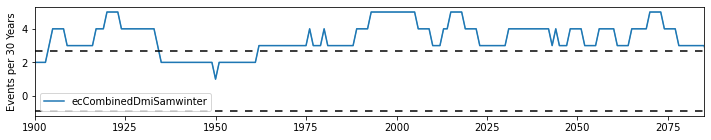

NorESM2-MM


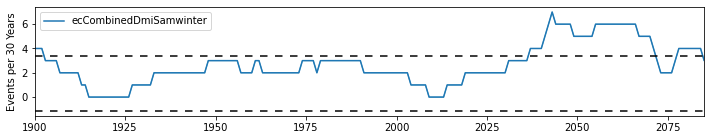

UKESM1-0-LL


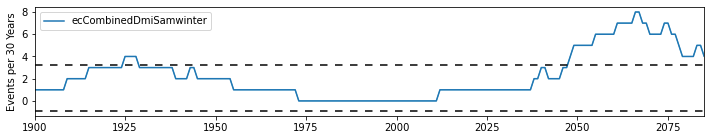

iod+sam
ACCESS-CM2


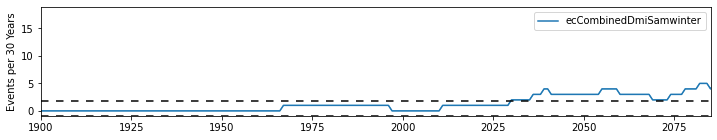

ACCESS-ESM1-5


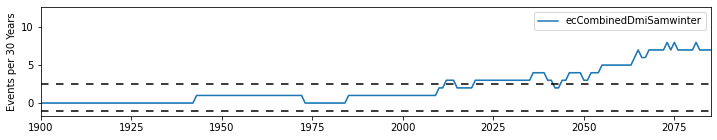

AWI-CM-1-1-MR


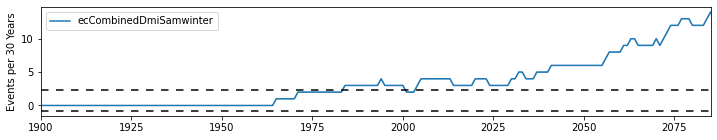

BCC-CSM2-MR


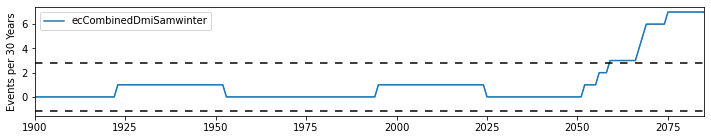

CAMS-CSM1-0


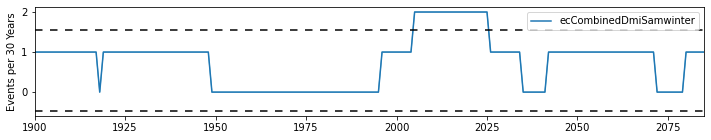

CAS-ESM2-0


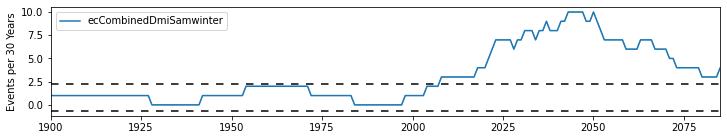

CESM2


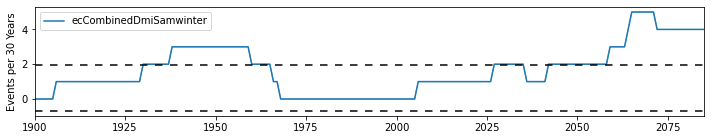

CESM2-WACCM


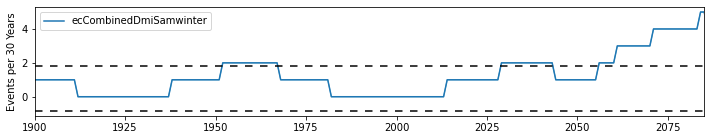

CIESM


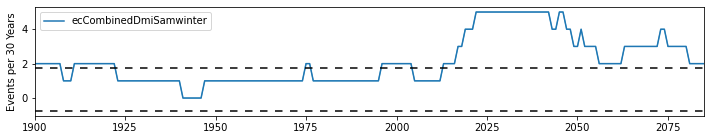

CMCC-CM2-SR5


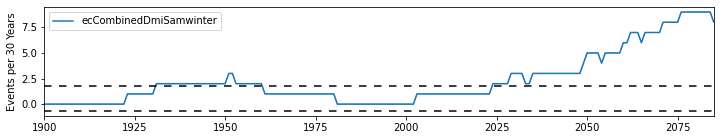

CMCC-ESM2


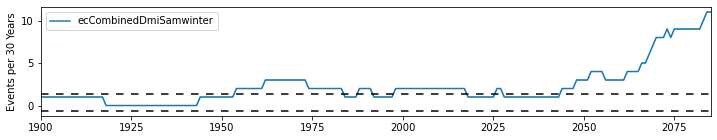

CNRM-CM6-1


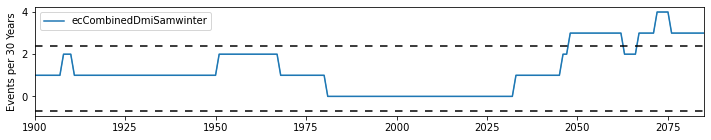

CNRM-ESM2-1


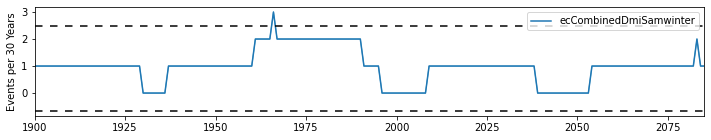

CanESM5


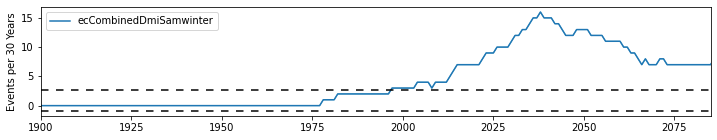

CanESM5-CanOE


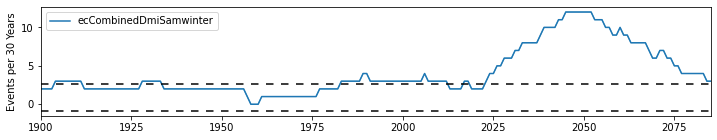

EC-Earth3


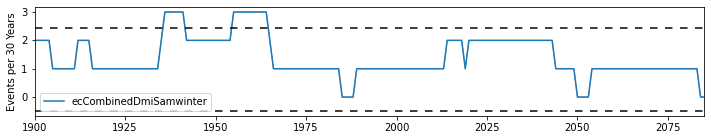

EC-Earth3-CC


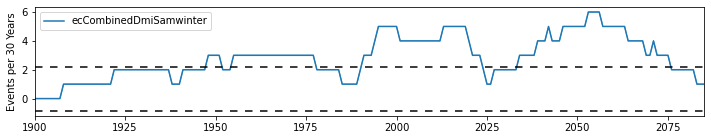

EC-Earth3-Veg


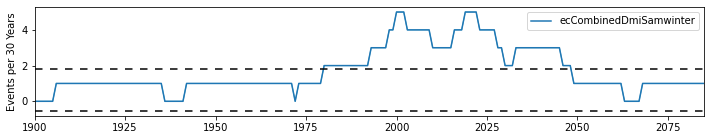

EC-Earth3-Veg-LR


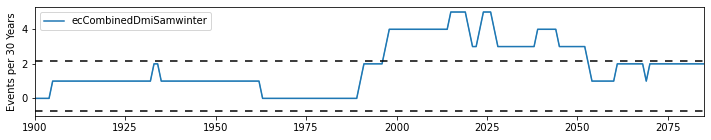

GFDL-CM4


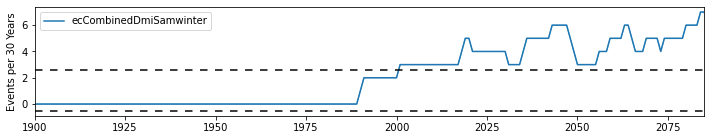

GFDL-ESM4


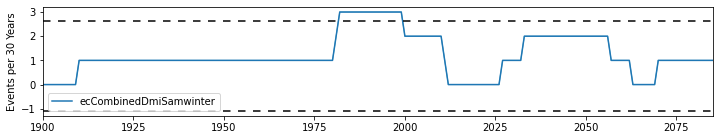

HadGEM3-GC31-LL


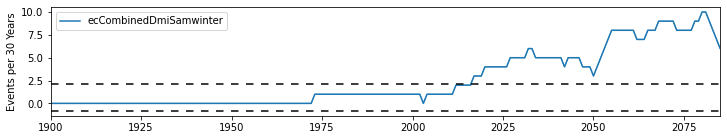

HadGEM3-GC31-MM


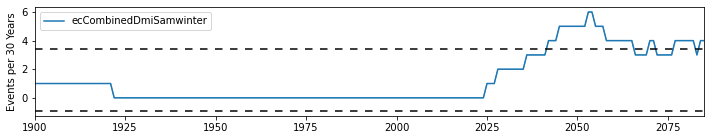

INM-CM4-8


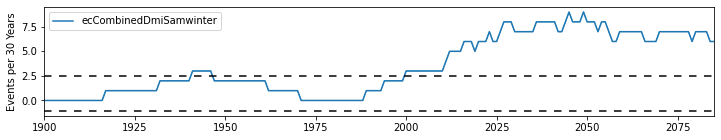

INM-CM5-0


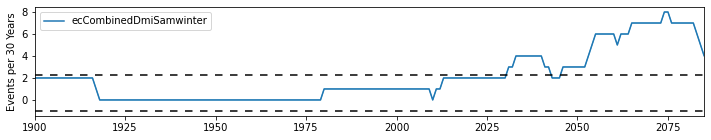

IPSL-CM6A-LR


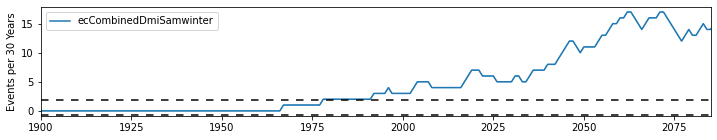

MCM-UA-1-0


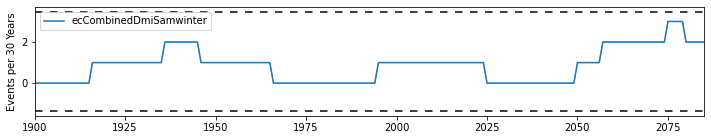

MIROC-ES2L


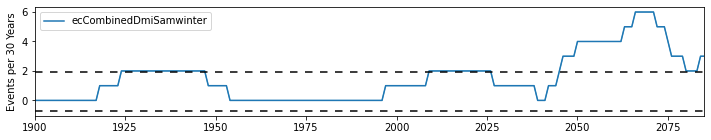

MIROC6


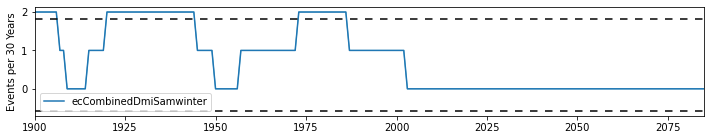

MPI-ESM1-2-HR


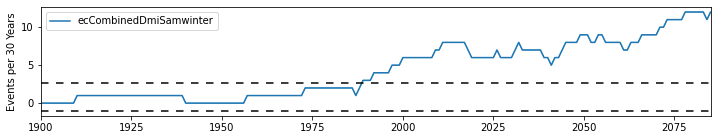

MPI-ESM1-2-LR


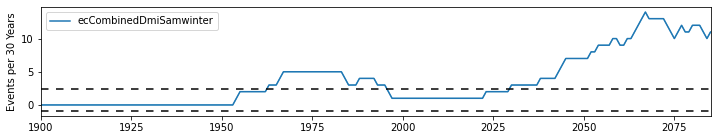

MRI-ESM2-0


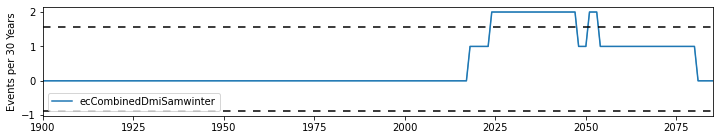

NorESM2-LM


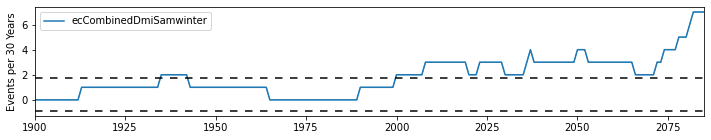

NorESM2-MM


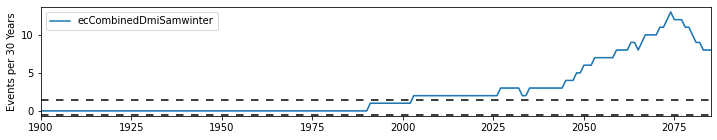

UKESM1-0-LL


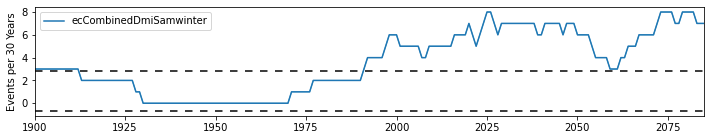

summer
anyCompound
ACCESS-CM2


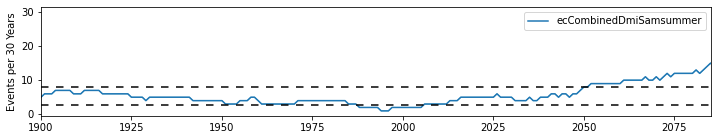

ACCESS-ESM1-5


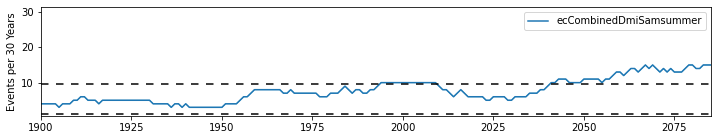

AWI-CM-1-1-MR


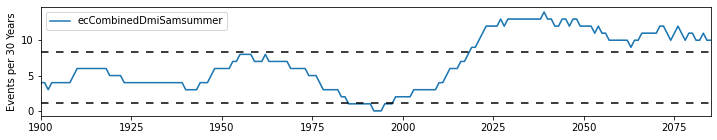

BCC-CSM2-MR


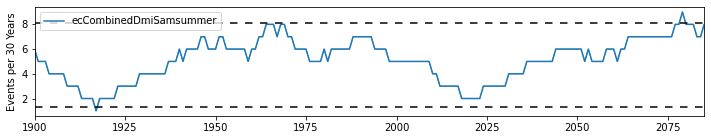

CAMS-CSM1-0


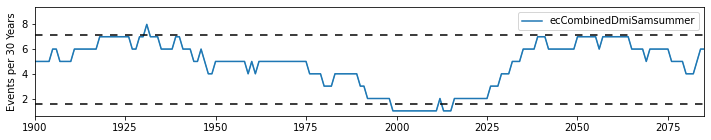

CAS-ESM2-0


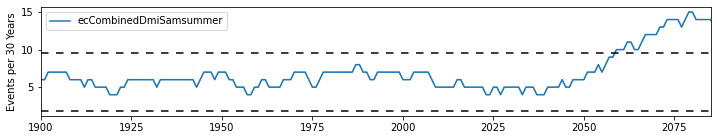

CESM2


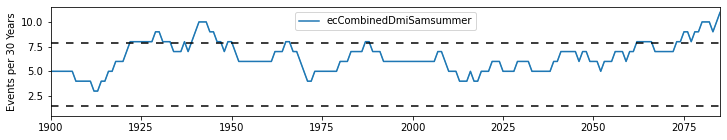

CESM2-WACCM


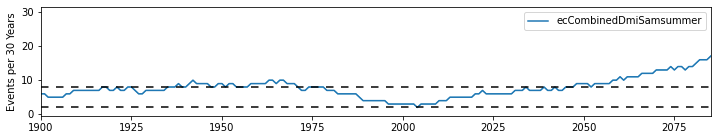

CIESM


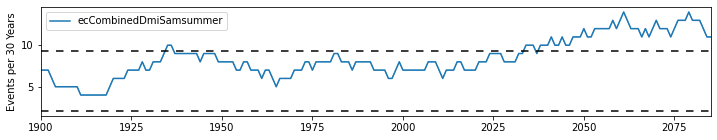

CMCC-CM2-SR5


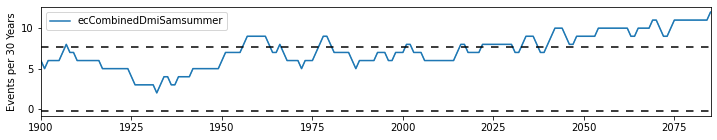

CMCC-ESM2


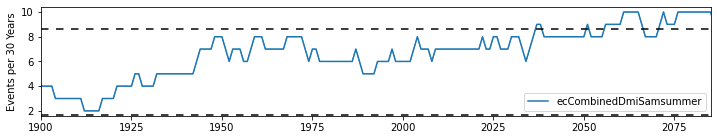

CNRM-CM6-1


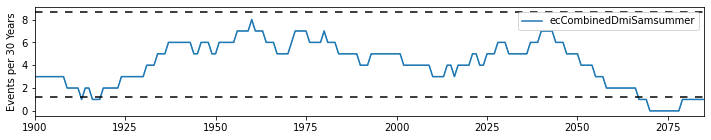

CNRM-ESM2-1


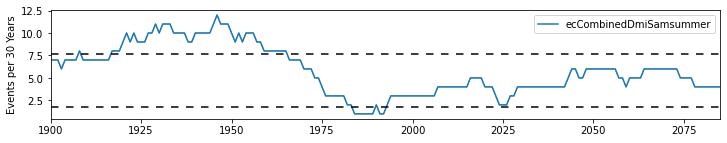

CanESM5


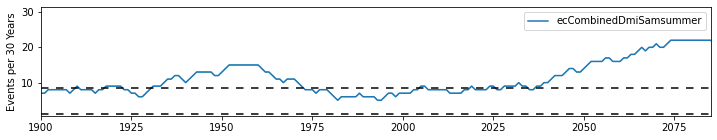

CanESM5-CanOE


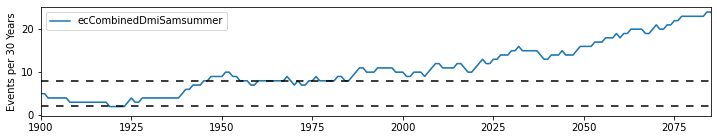

EC-Earth3


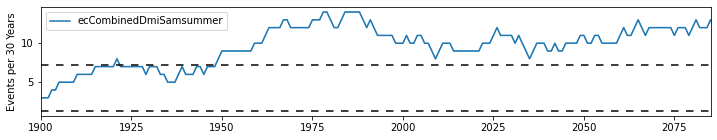

EC-Earth3-CC


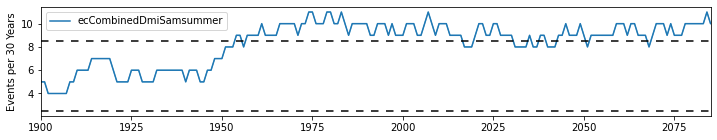

EC-Earth3-Veg


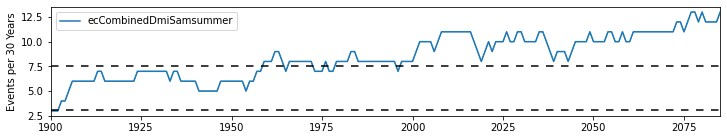

EC-Earth3-Veg-LR


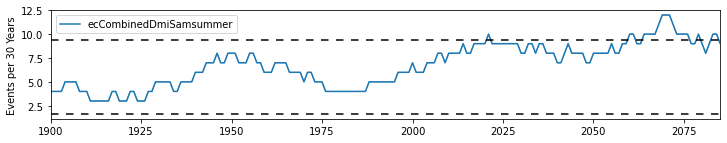

GFDL-CM4


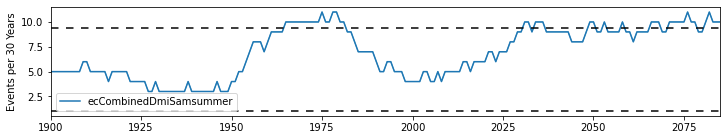

GFDL-ESM4


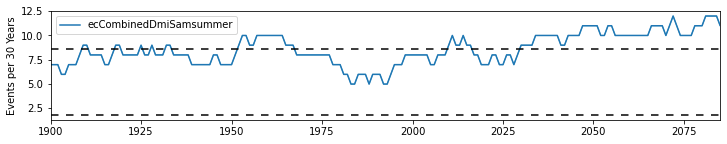

HadGEM3-GC31-LL


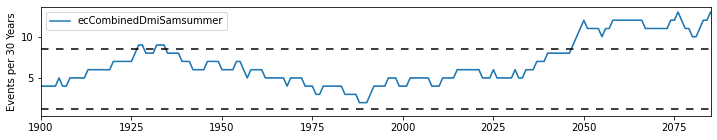

HadGEM3-GC31-MM


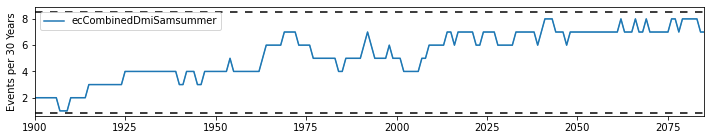

INM-CM4-8


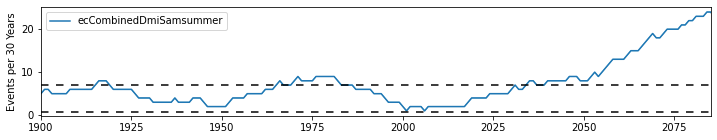

INM-CM5-0


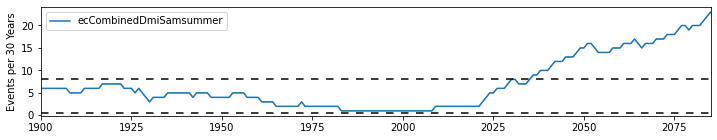

IPSL-CM6A-LR


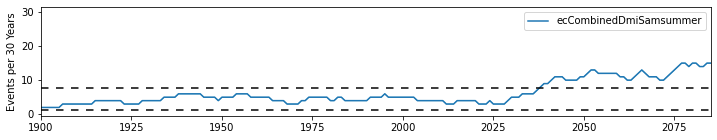

MCM-UA-1-0


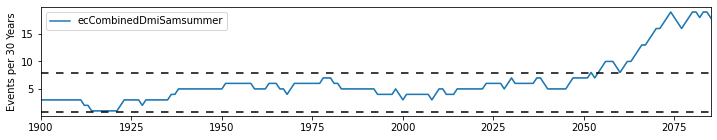

MIROC-ES2L


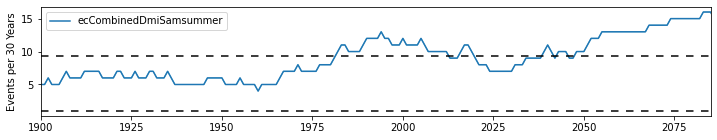

MIROC6


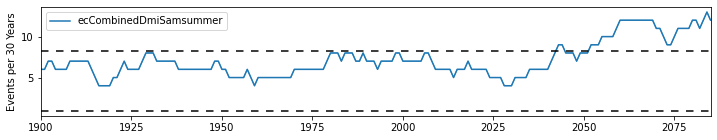

MPI-ESM1-2-HR


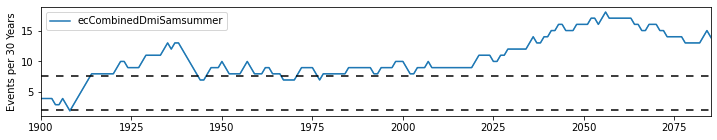

MPI-ESM1-2-LR


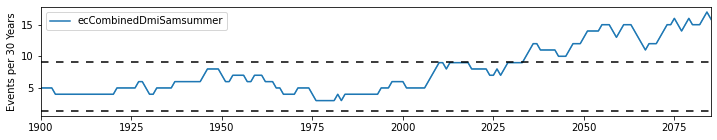

MRI-ESM2-0


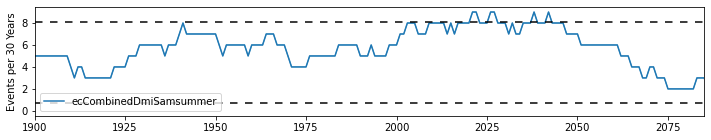

NorESM2-LM


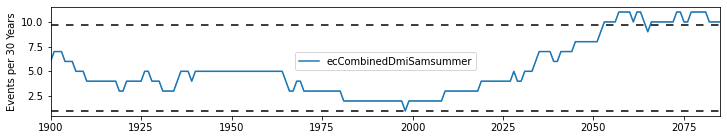

NorESM2-MM


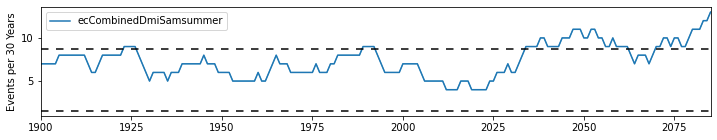

UKESM1-0-LL


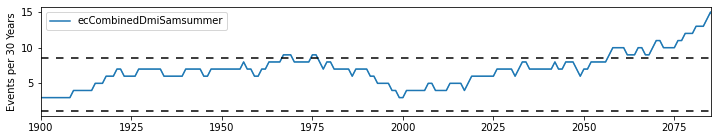

all3
ACCESS-CM2


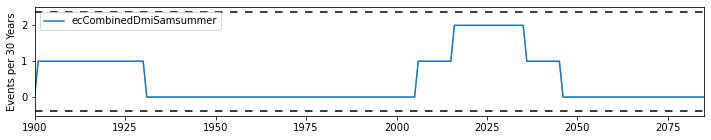

ACCESS-ESM1-5


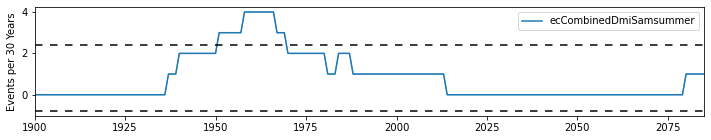

AWI-CM-1-1-MR


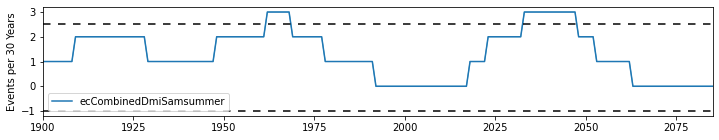

BCC-CSM2-MR


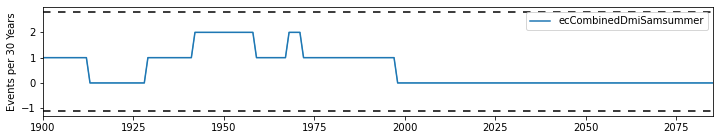

CAMS-CSM1-0


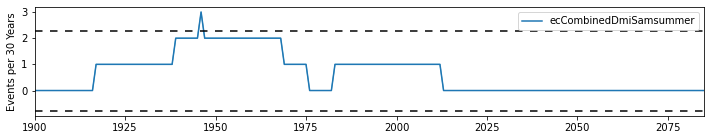

CAS-ESM2-0


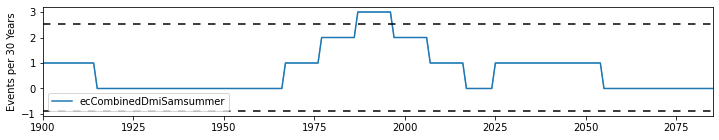

CESM2


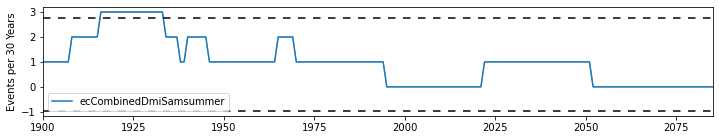

CESM2-WACCM


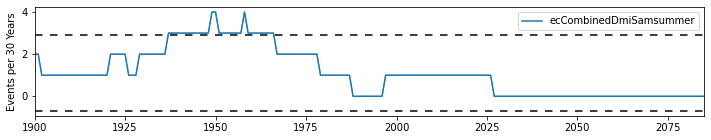

CIESM


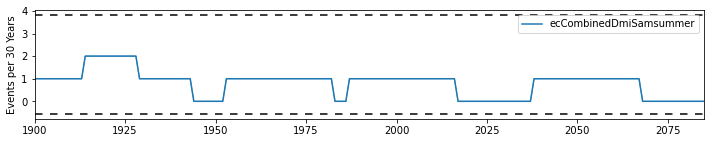

CMCC-CM2-SR5


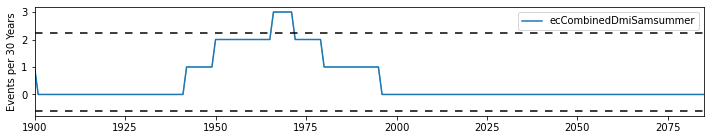

CMCC-ESM2


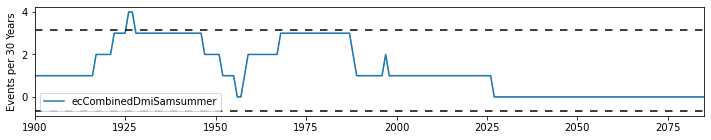

CNRM-CM6-1


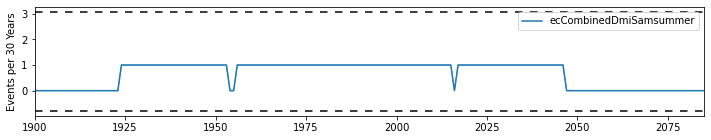

CNRM-ESM2-1


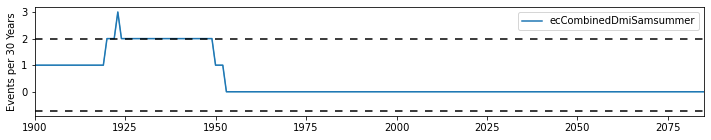

CanESM5


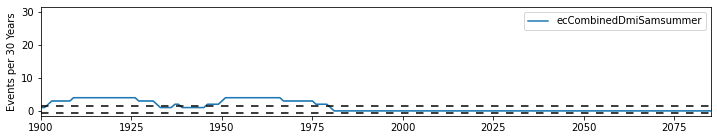

CanESM5-CanOE


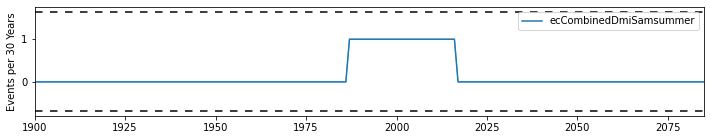

EC-Earth3


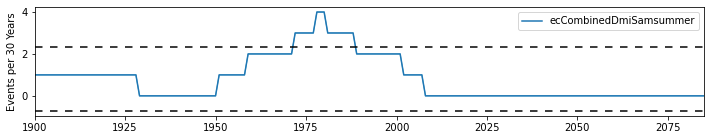

EC-Earth3-CC


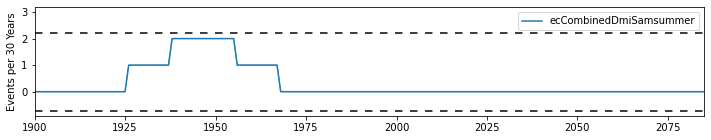

EC-Earth3-Veg


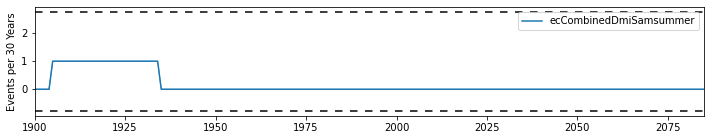

EC-Earth3-Veg-LR


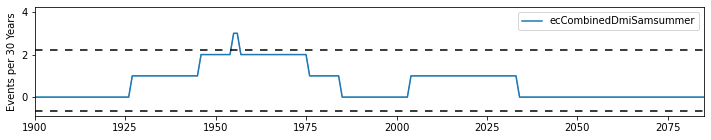

GFDL-CM4


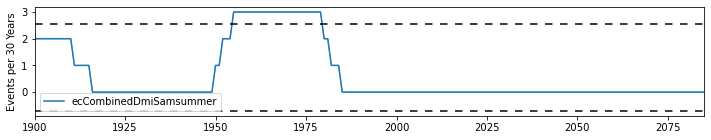

GFDL-ESM4


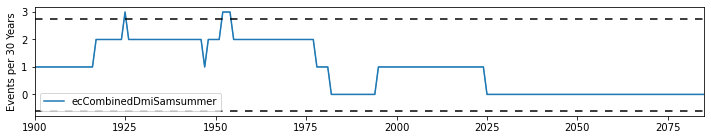

HadGEM3-GC31-LL


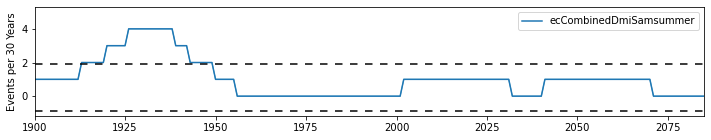

HadGEM3-GC31-MM


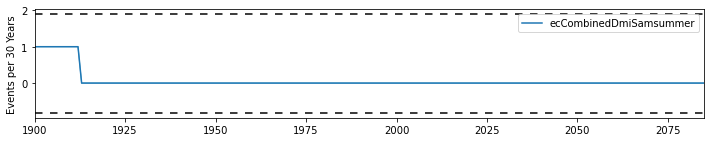

INM-CM4-8


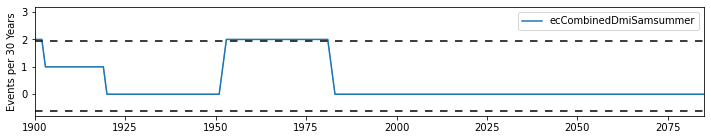

INM-CM5-0


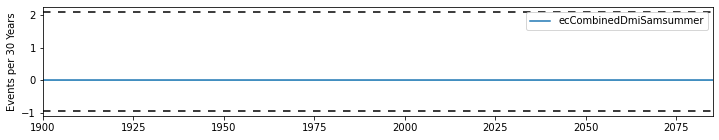

IPSL-CM6A-LR


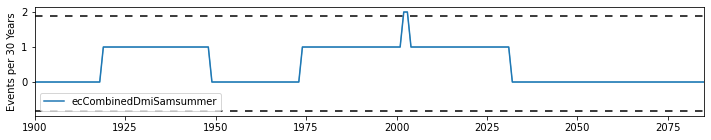

MCM-UA-1-0


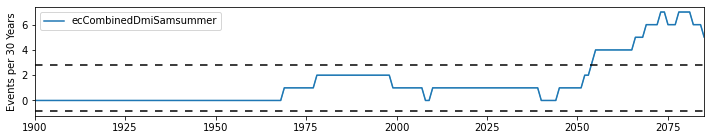

MIROC-ES2L


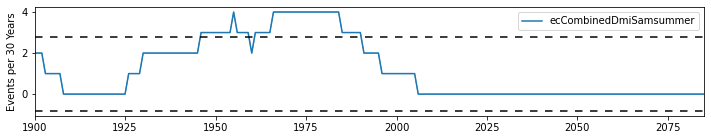

MIROC6


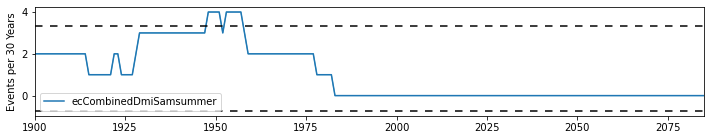

MPI-ESM1-2-HR


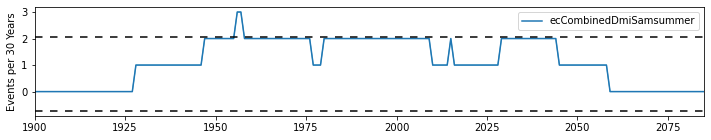

MPI-ESM1-2-LR


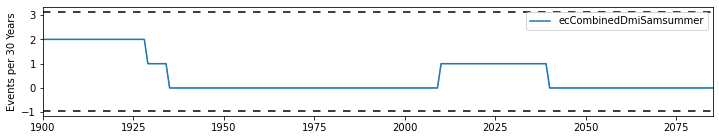

MRI-ESM2-0


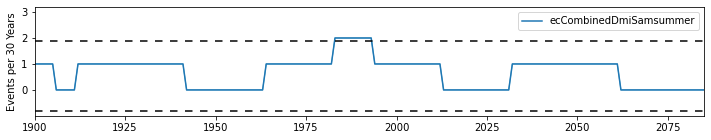

NorESM2-LM


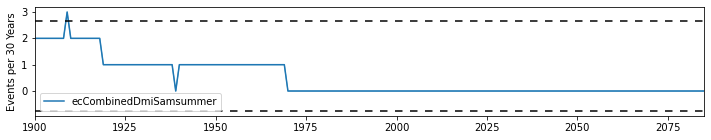

NorESM2-MM


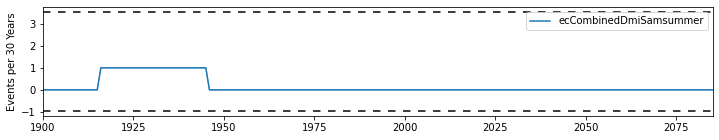

UKESM1-0-LL


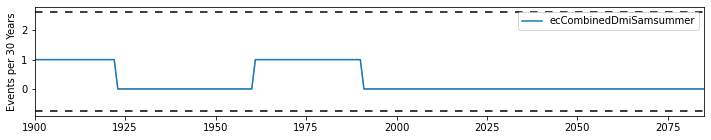

enso+iod
ACCESS-CM2


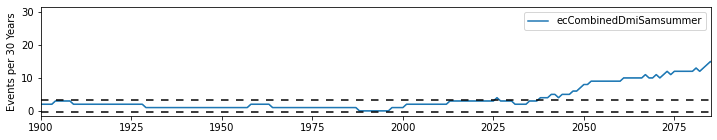

ACCESS-ESM1-5


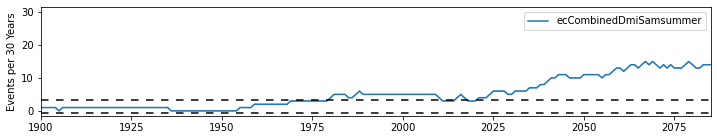

AWI-CM-1-1-MR


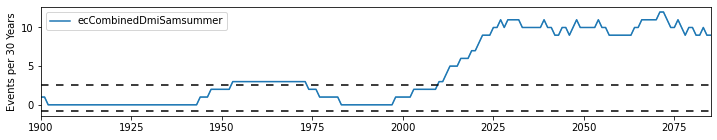

BCC-CSM2-MR


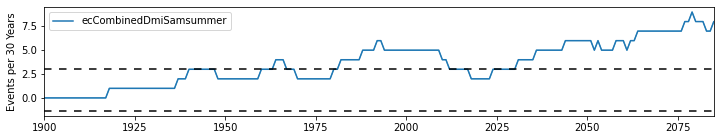

CAMS-CSM1-0


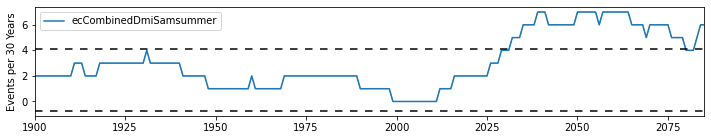

CAS-ESM2-0


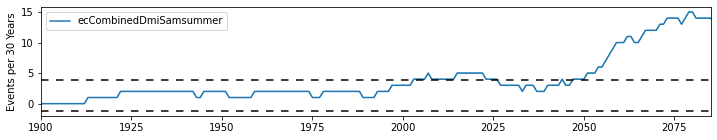

CESM2


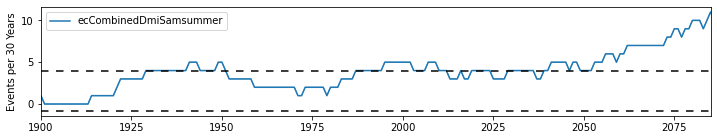

CESM2-WACCM


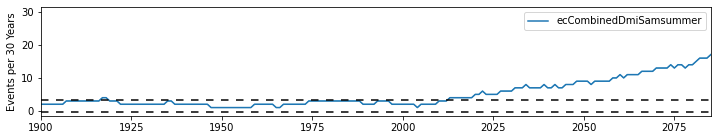

CIESM


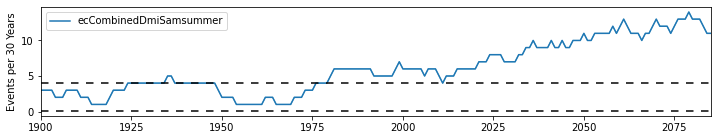

CMCC-CM2-SR5


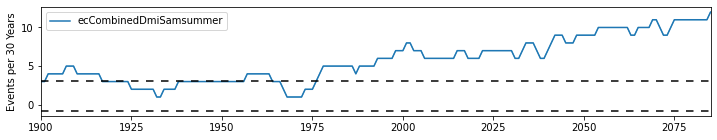

CMCC-ESM2


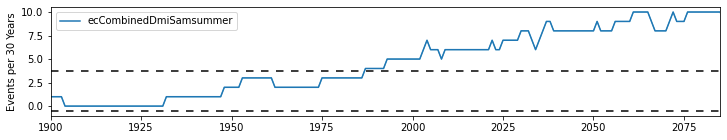

CNRM-CM6-1


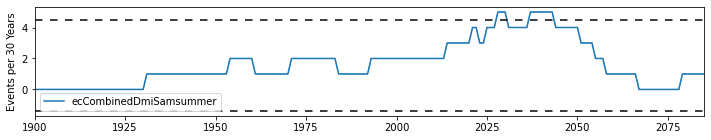

CNRM-ESM2-1


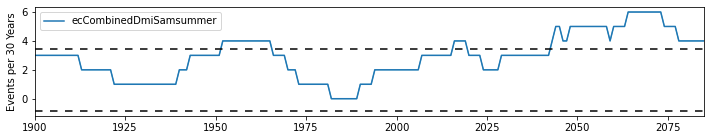

CanESM5


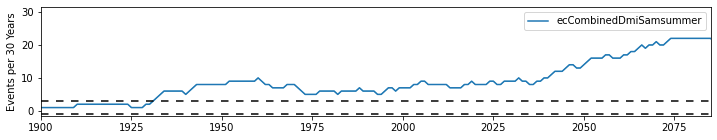

CanESM5-CanOE


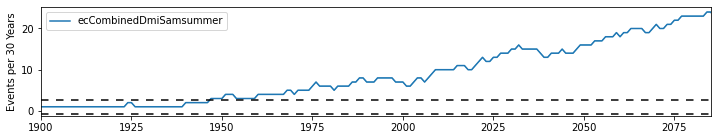

EC-Earth3


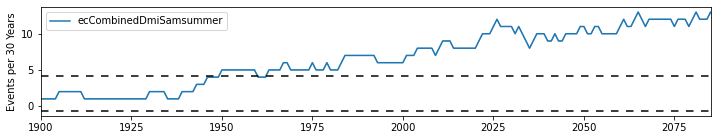

EC-Earth3-CC


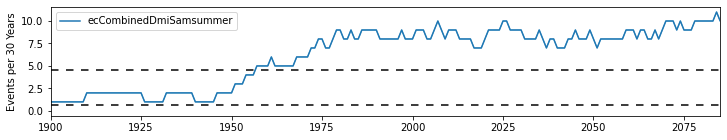

EC-Earth3-Veg


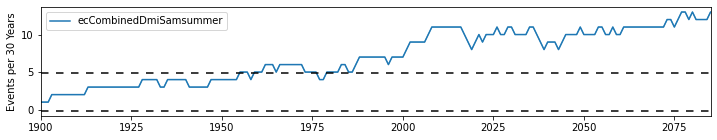

EC-Earth3-Veg-LR


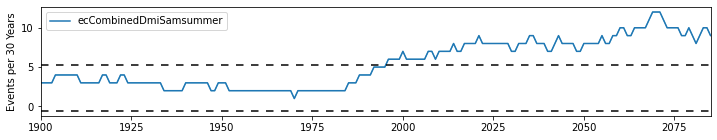

GFDL-CM4


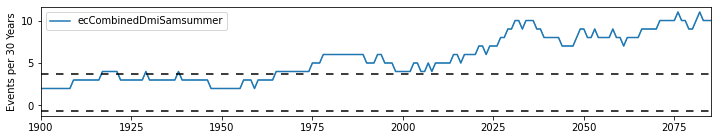

GFDL-ESM4


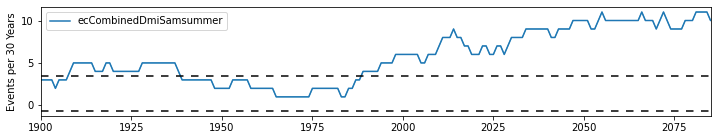

HadGEM3-GC31-LL


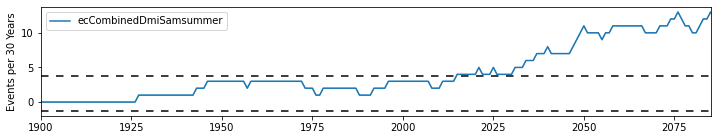

HadGEM3-GC31-MM


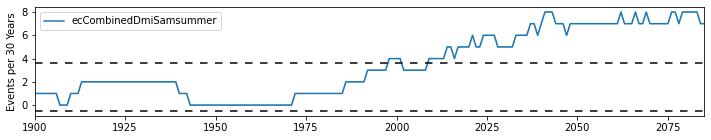

INM-CM4-8


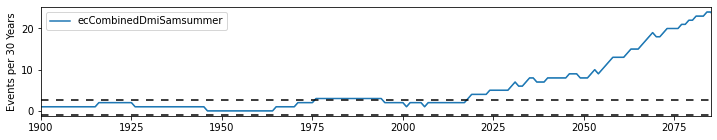

INM-CM5-0


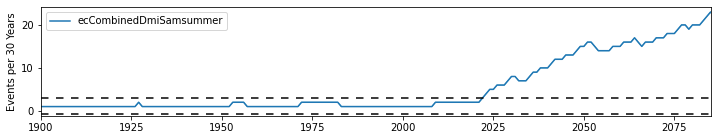

IPSL-CM6A-LR


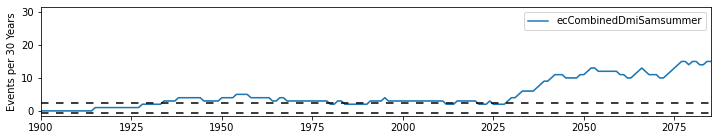

MCM-UA-1-0


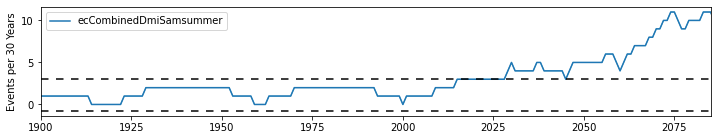

MIROC-ES2L


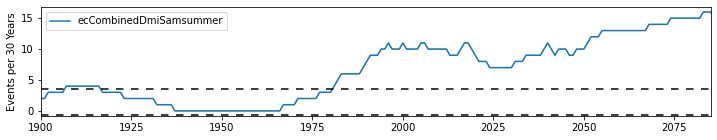

MIROC6


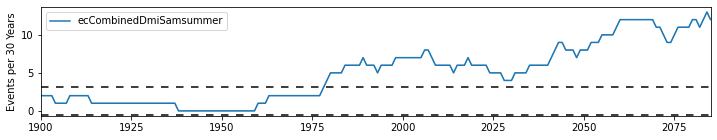

MPI-ESM1-2-HR


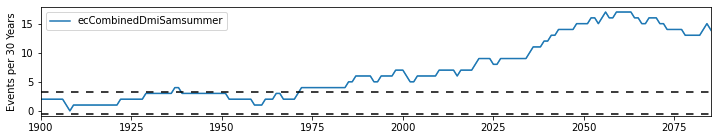

MPI-ESM1-2-LR


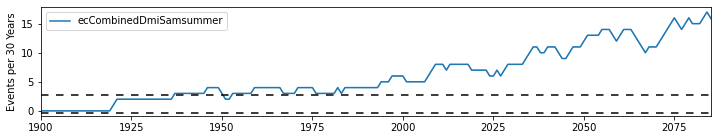

MRI-ESM2-0


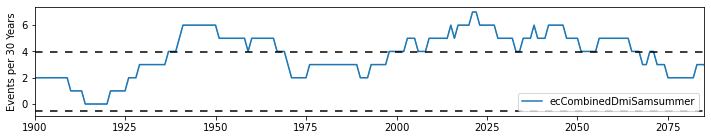

NorESM2-LM


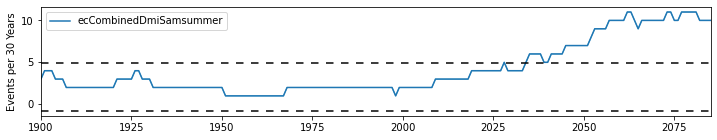

NorESM2-MM


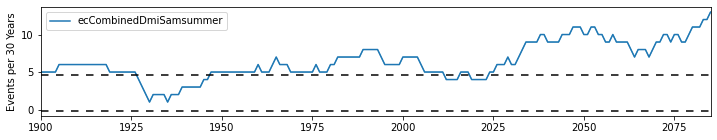

UKESM1-0-LL


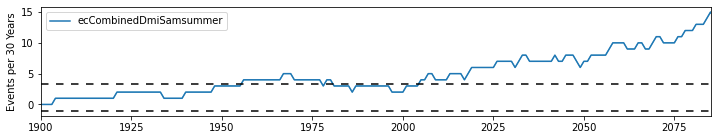

enso+sam
ACCESS-CM2


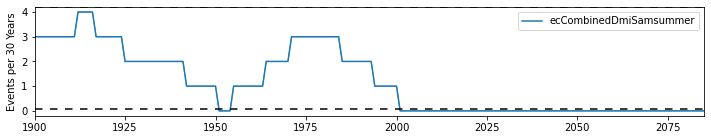

ACCESS-ESM1-5


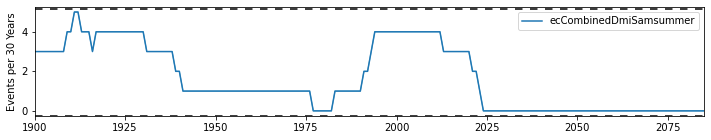

AWI-CM-1-1-MR


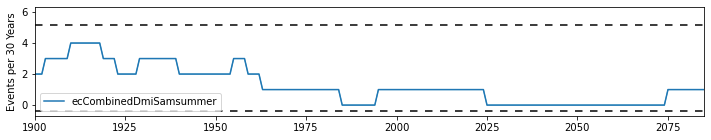

BCC-CSM2-MR


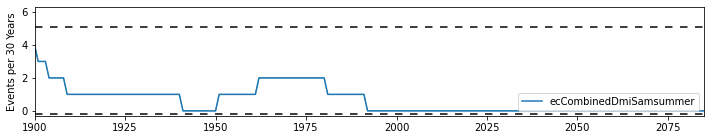

CAMS-CSM1-0


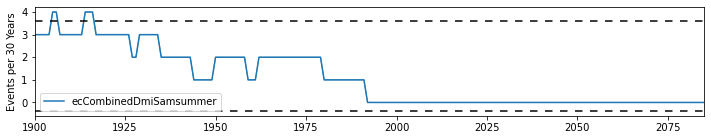

CAS-ESM2-0


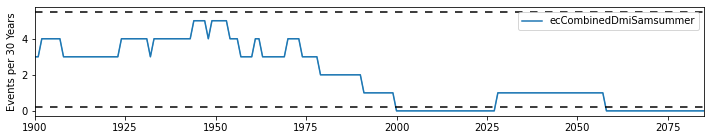

CESM2


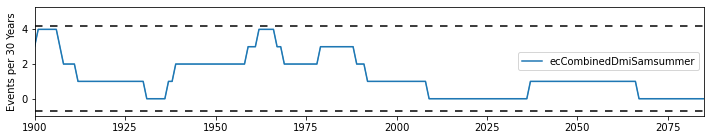

CESM2-WACCM


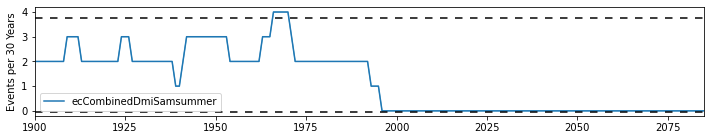

CIESM


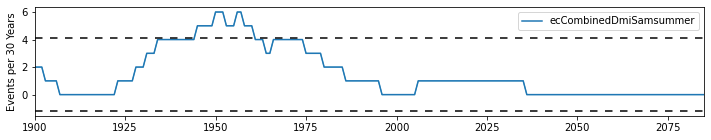

CMCC-CM2-SR5


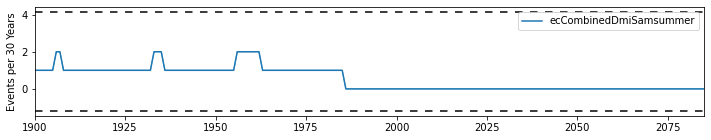

CMCC-ESM2


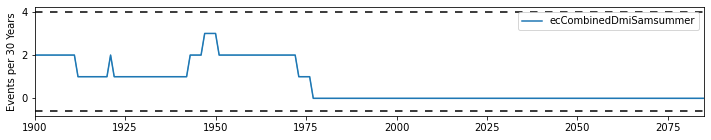

CNRM-CM6-1


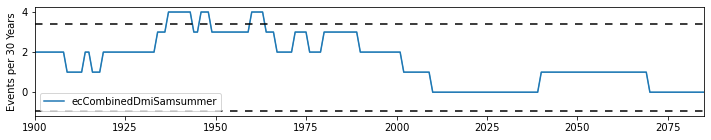

CNRM-ESM2-1


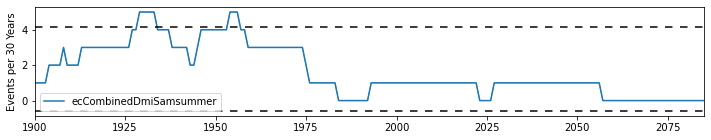

CanESM5


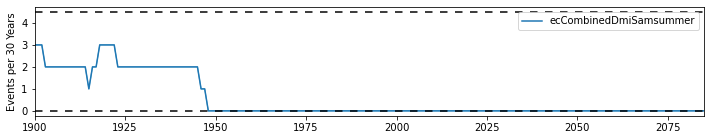

CanESM5-CanOE


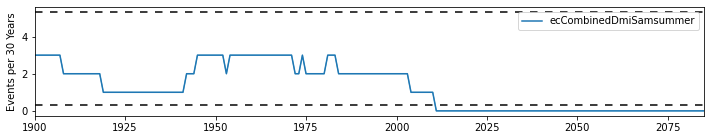

EC-Earth3


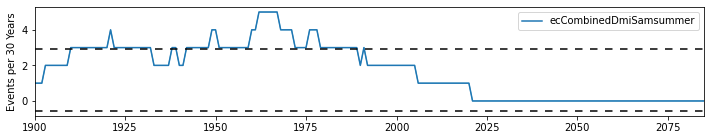

EC-Earth3-CC


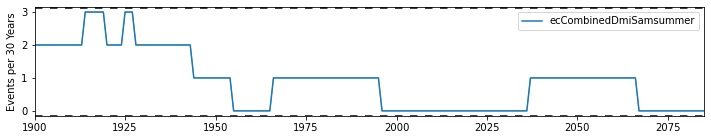

EC-Earth3-Veg


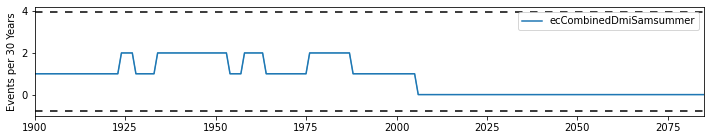

EC-Earth3-Veg-LR


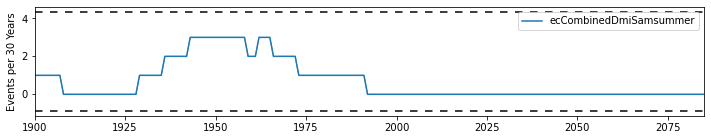

GFDL-CM4


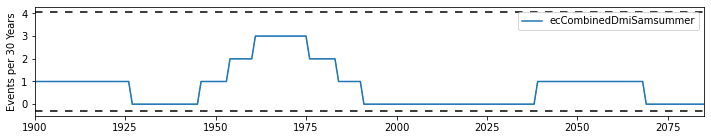

GFDL-ESM4


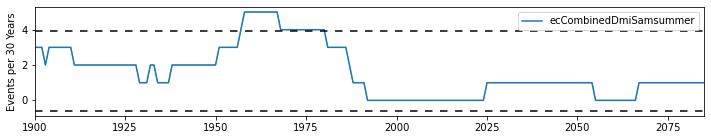

HadGEM3-GC31-LL


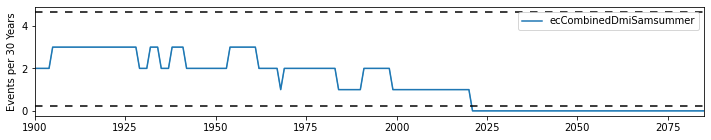

HadGEM3-GC31-MM


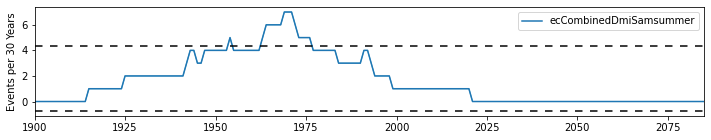

INM-CM4-8


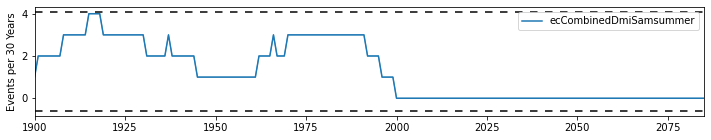

INM-CM5-0


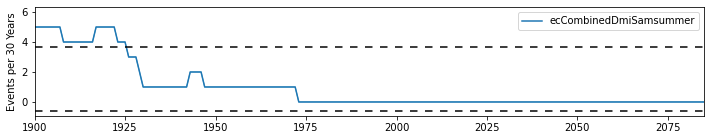

IPSL-CM6A-LR


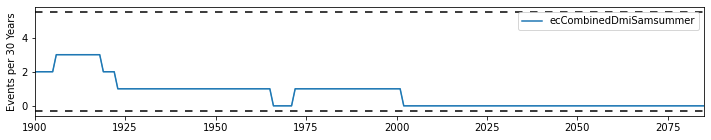

MCM-UA-1-0


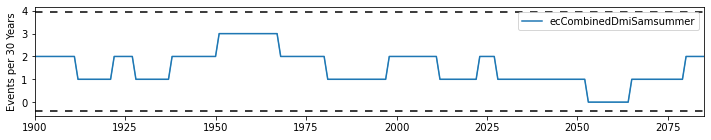

MIROC-ES2L


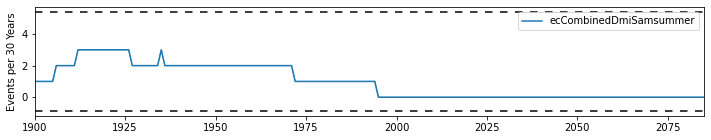

MIROC6


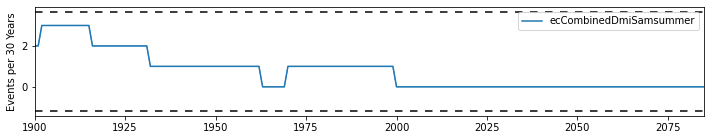

MPI-ESM1-2-HR


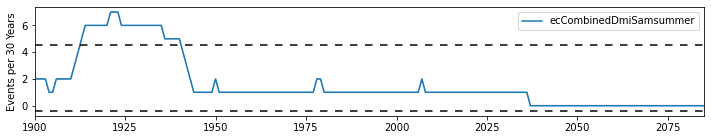

MPI-ESM1-2-LR


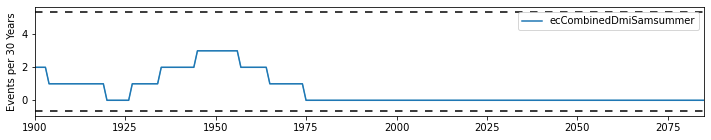

MRI-ESM2-0


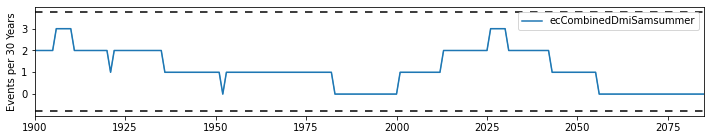

NorESM2-LM


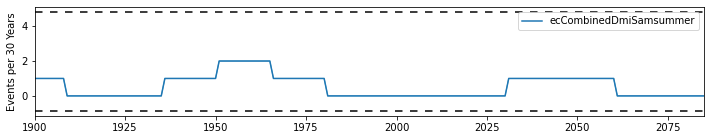

NorESM2-MM


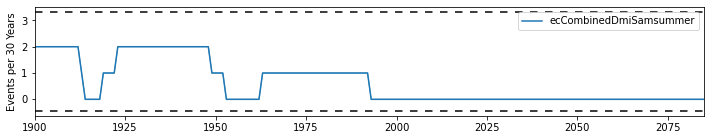

UKESM1-0-LL


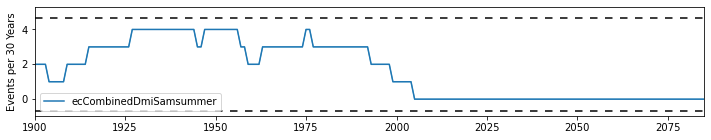

iod+sam
ACCESS-CM2


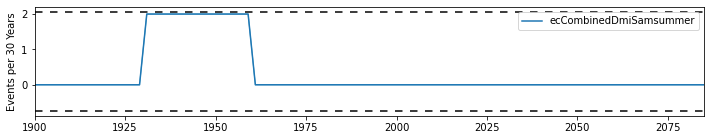

ACCESS-ESM1-5


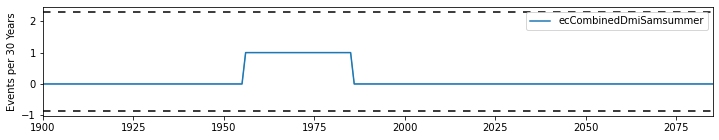

AWI-CM-1-1-MR


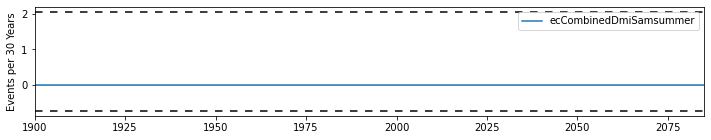

BCC-CSM2-MR


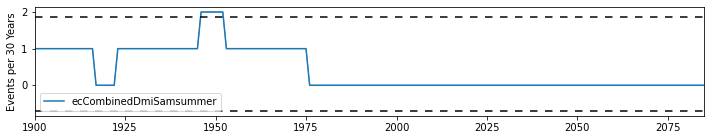

CAMS-CSM1-0


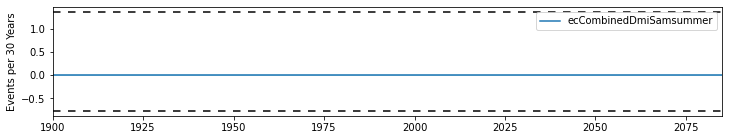

CAS-ESM2-0


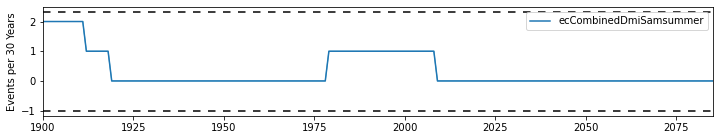

CESM2


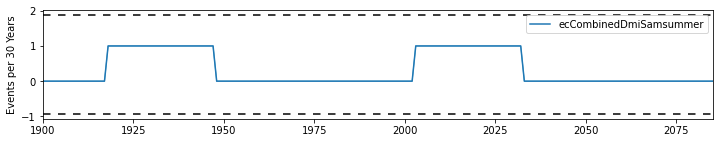

CESM2-WACCM


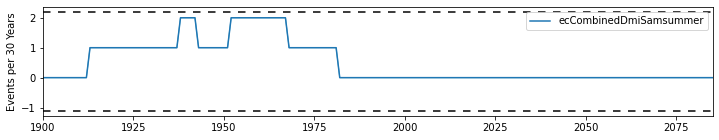

CIESM


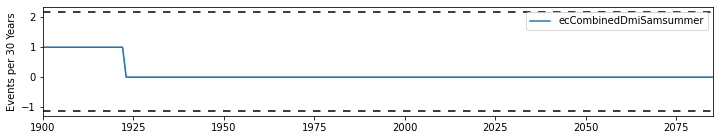

CMCC-CM2-SR5


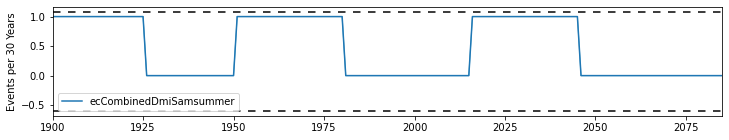

CMCC-ESM2


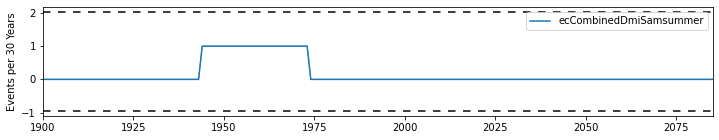

CNRM-CM6-1


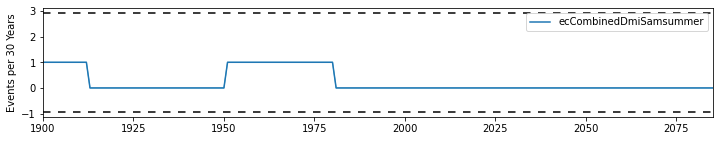

CNRM-ESM2-1


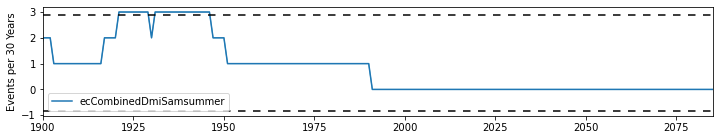

CanESM5


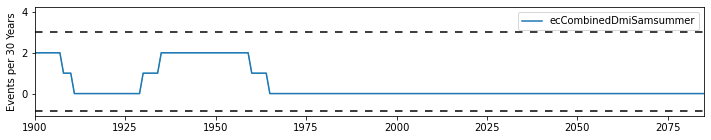

CanESM5-CanOE


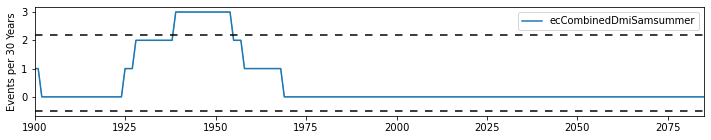

EC-Earth3


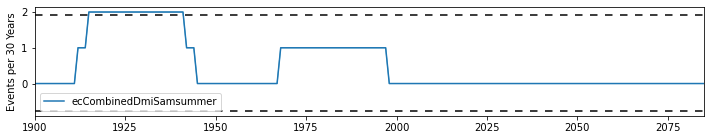

EC-Earth3-CC


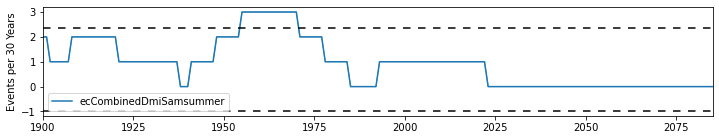

EC-Earth3-Veg


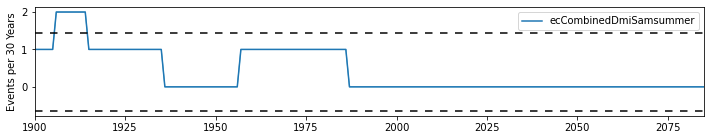

EC-Earth3-Veg-LR


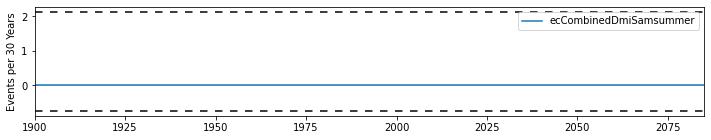

GFDL-CM4


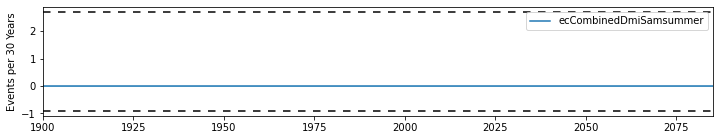

GFDL-ESM4


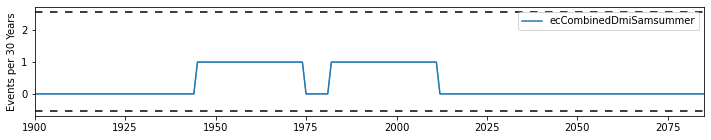

HadGEM3-GC31-LL


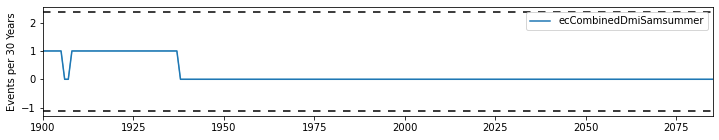

HadGEM3-GC31-MM


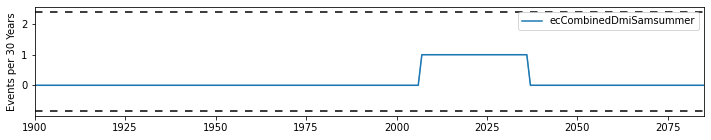

INM-CM4-8


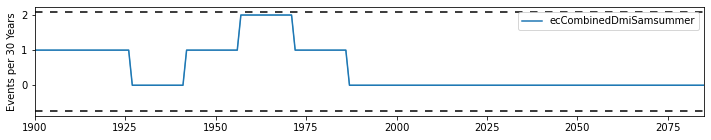

INM-CM5-0


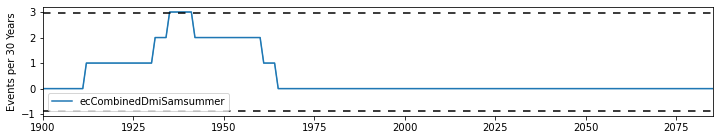

IPSL-CM6A-LR


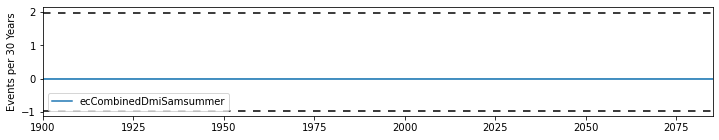

MCM-UA-1-0


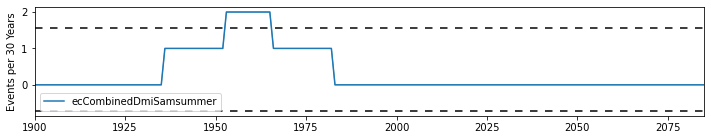

MIROC-ES2L


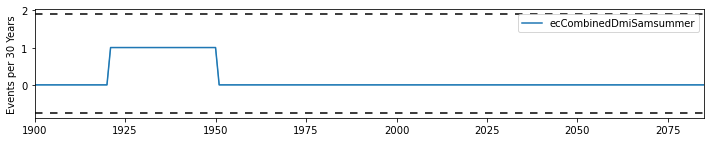

MIROC6


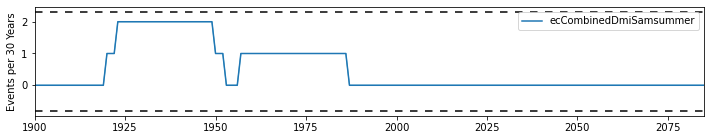

MPI-ESM1-2-HR


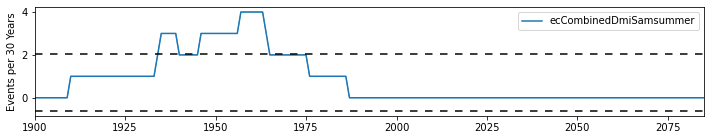

MPI-ESM1-2-LR


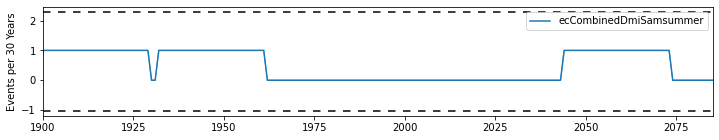

MRI-ESM2-0


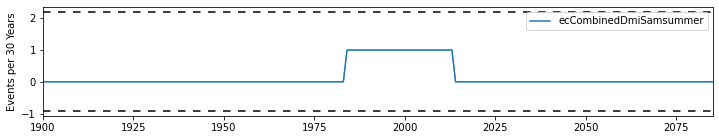

NorESM2-LM


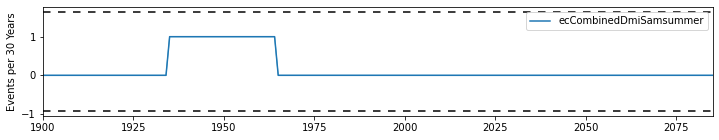

NorESM2-MM


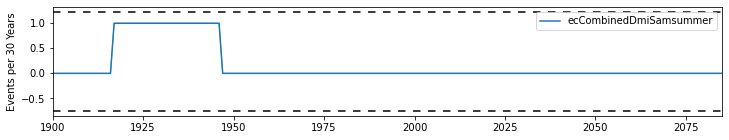

UKESM1-0-LL


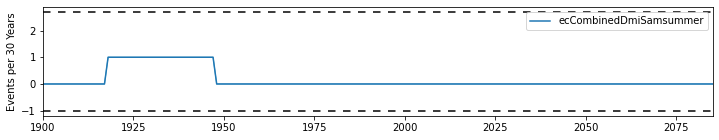

neg
winter
anyCompound
ACCESS-CM2


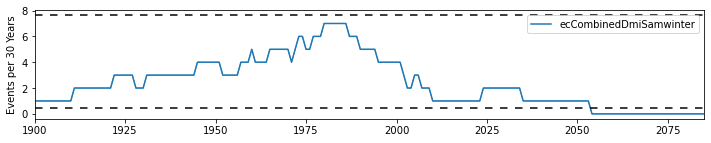

ACCESS-ESM1-5


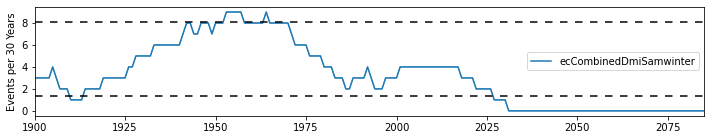

AWI-CM-1-1-MR


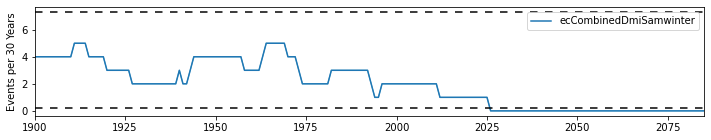

BCC-CSM2-MR


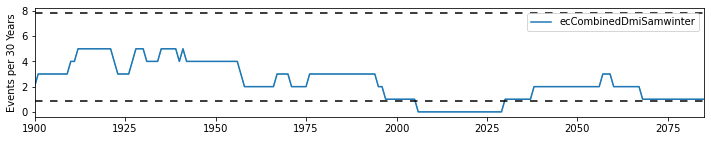

CAMS-CSM1-0


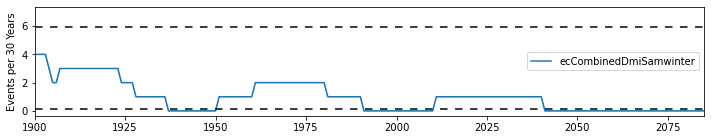

CAS-ESM2-0


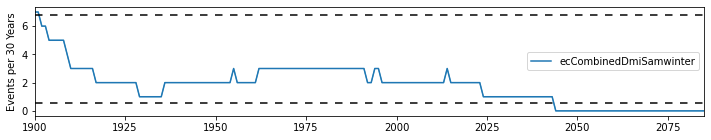

CESM2


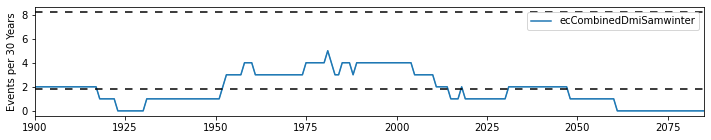

CESM2-WACCM


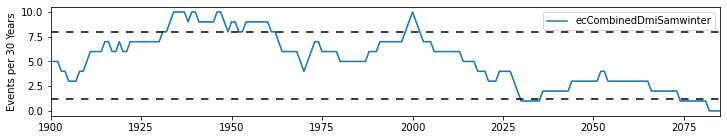

CIESM


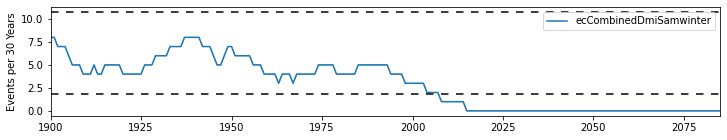

CMCC-CM2-SR5


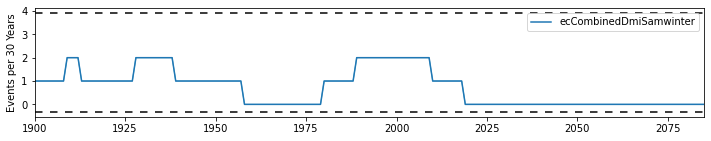

CMCC-ESM2


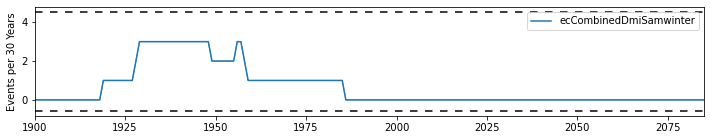

CNRM-CM6-1


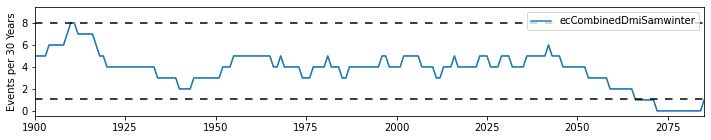

CNRM-ESM2-1


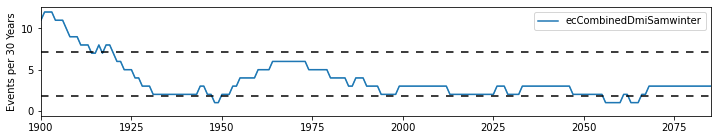

CanESM5


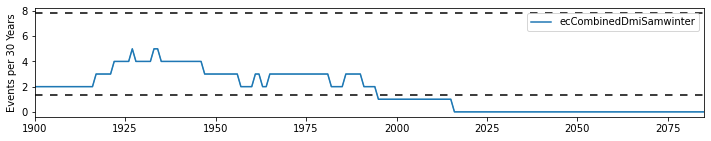

CanESM5-CanOE


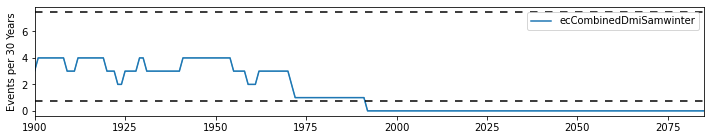

EC-Earth3


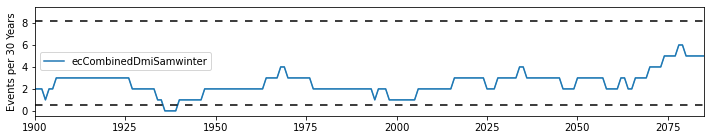

EC-Earth3-CC


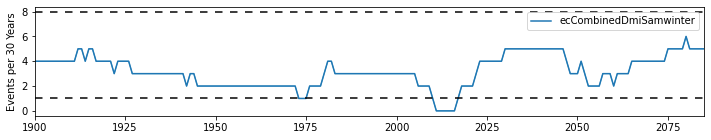

EC-Earth3-Veg


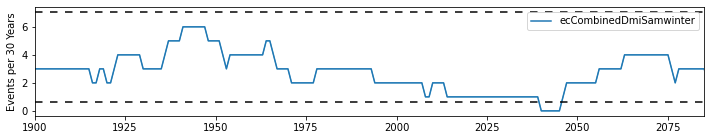

EC-Earth3-Veg-LR


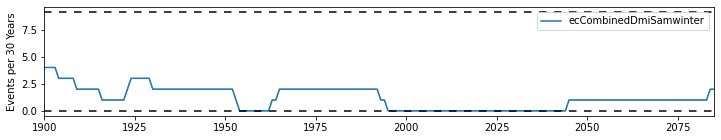

GFDL-CM4


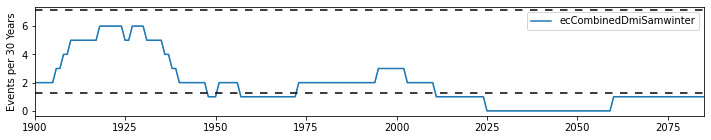

GFDL-ESM4


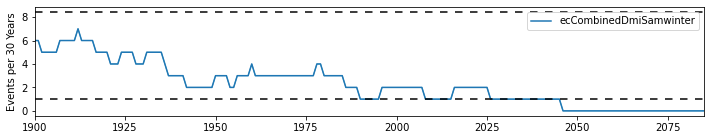

HadGEM3-GC31-LL


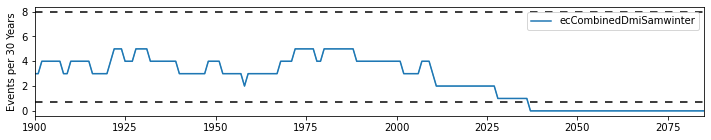

HadGEM3-GC31-MM


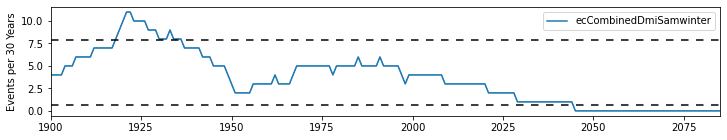

INM-CM4-8


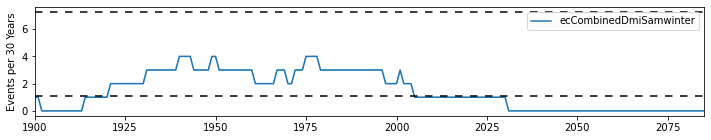

INM-CM5-0


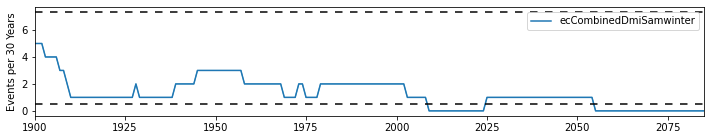

IPSL-CM6A-LR


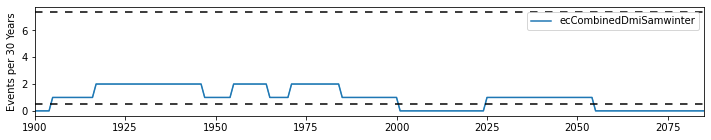

MCM-UA-1-0


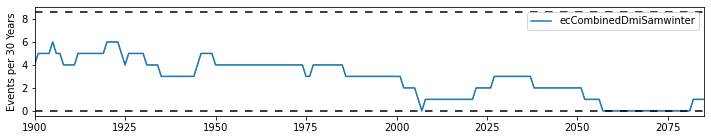

MIROC-ES2L


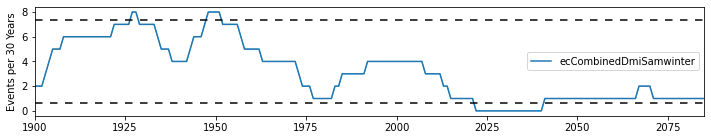

MIROC6


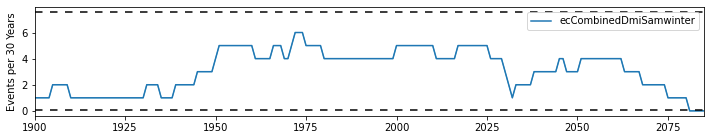

MPI-ESM1-2-HR


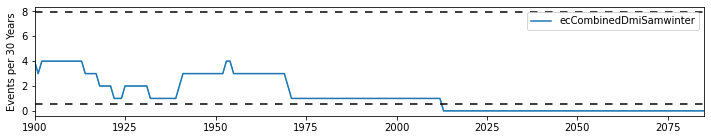

MPI-ESM1-2-LR


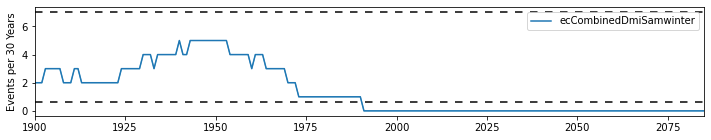

MRI-ESM2-0


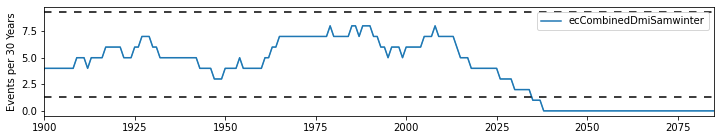

NorESM2-LM


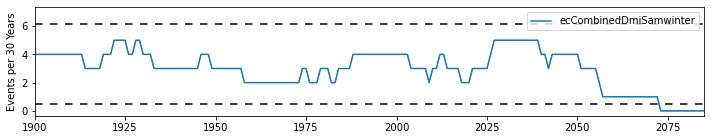

NorESM2-MM


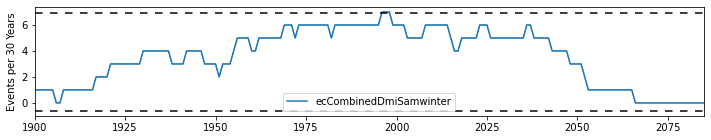

UKESM1-0-LL


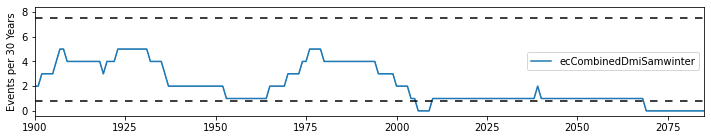

all3
ACCESS-CM2


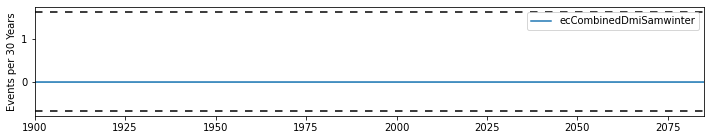

ACCESS-ESM1-5


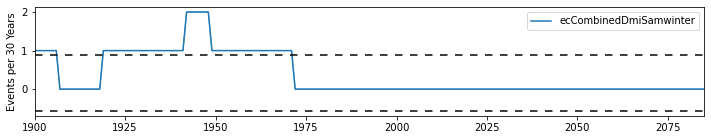

AWI-CM-1-1-MR


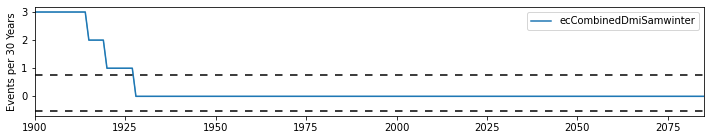

BCC-CSM2-MR


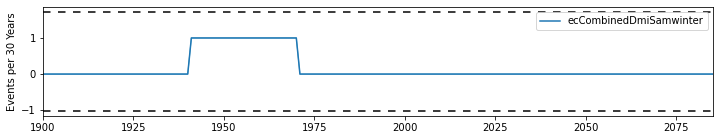

CAMS-CSM1-0


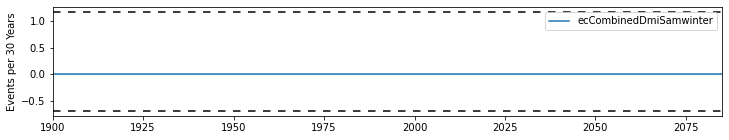

CAS-ESM2-0


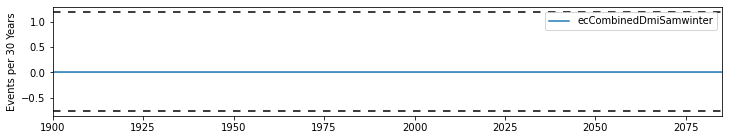

CESM2


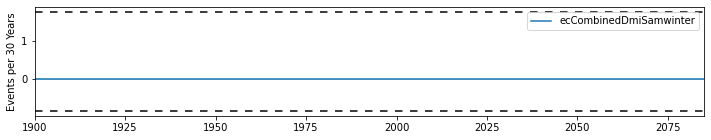

CESM2-WACCM


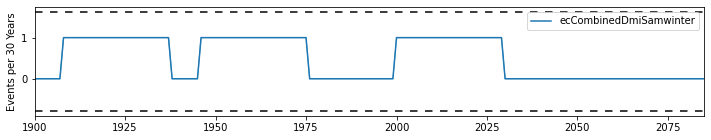

CIESM


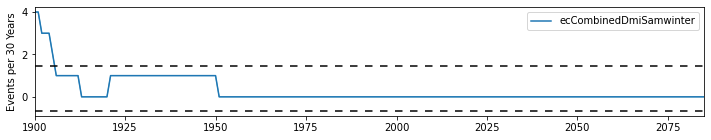

CMCC-CM2-SR5


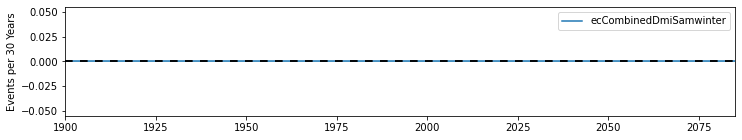

CMCC-ESM2


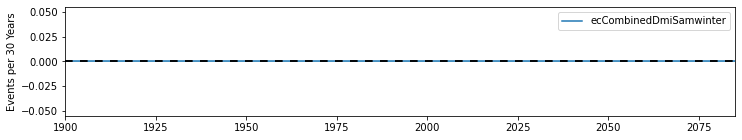

CNRM-CM6-1


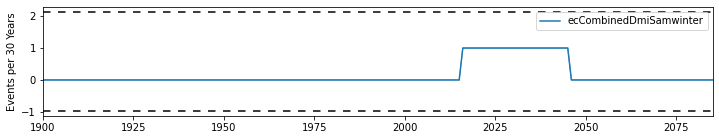

CNRM-ESM2-1


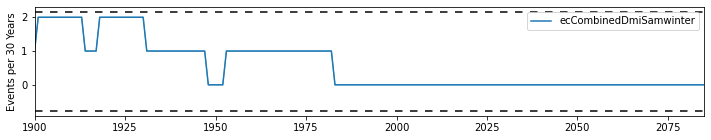

CanESM5


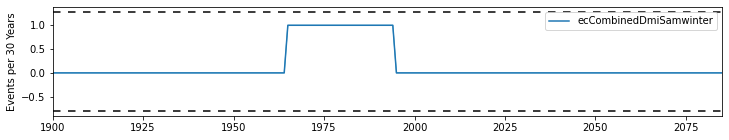

CanESM5-CanOE


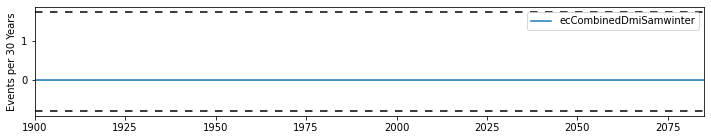

EC-Earth3


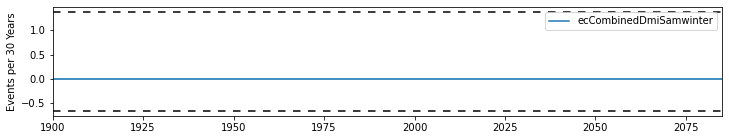

EC-Earth3-CC


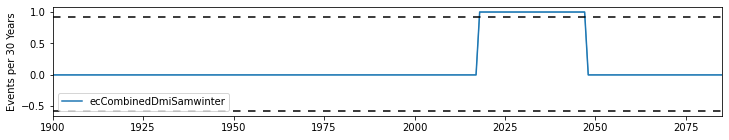

EC-Earth3-Veg


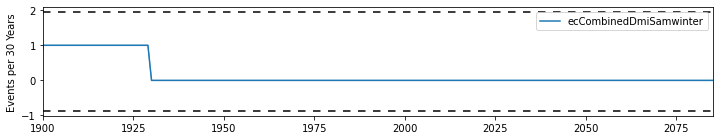

EC-Earth3-Veg-LR


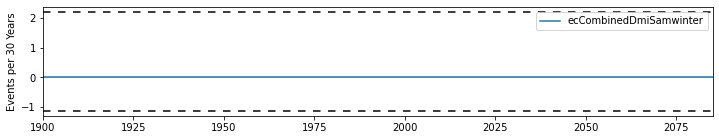

GFDL-CM4


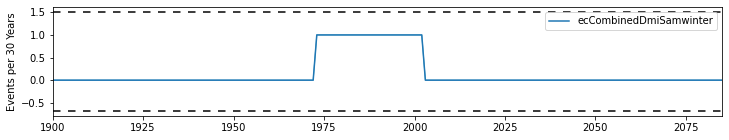

GFDL-ESM4


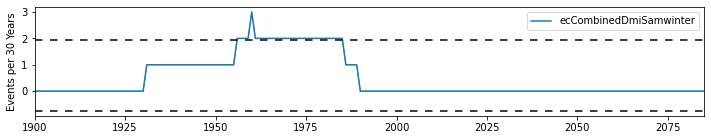

HadGEM3-GC31-LL


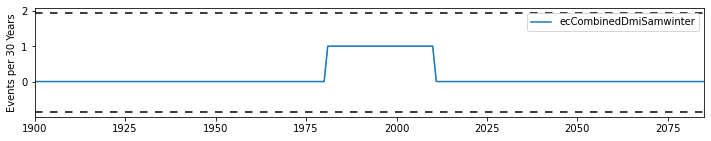

HadGEM3-GC31-MM


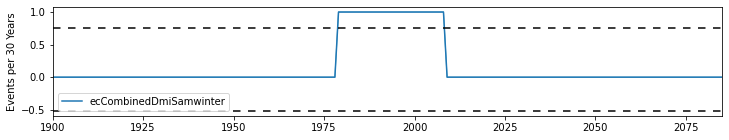

INM-CM4-8


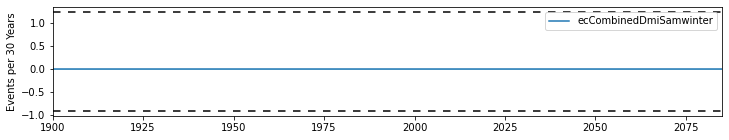

INM-CM5-0


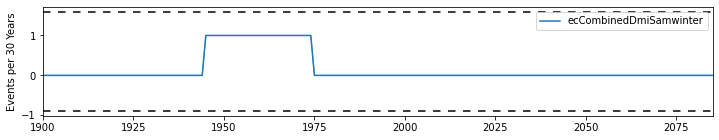

IPSL-CM6A-LR


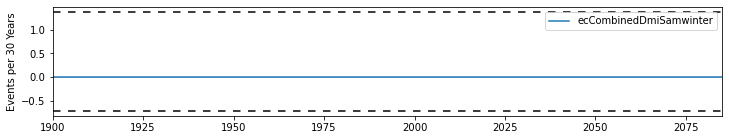

MCM-UA-1-0


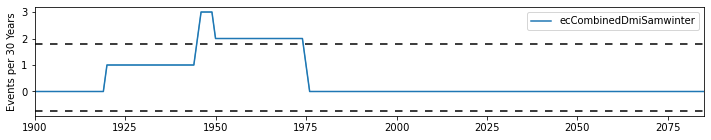

MIROC-ES2L


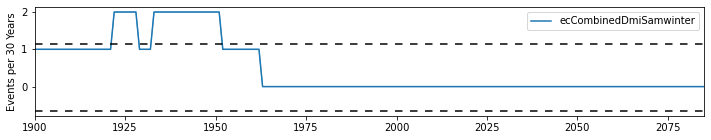

MIROC6


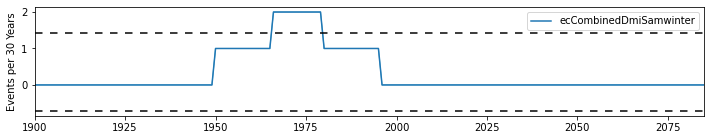

MPI-ESM1-2-HR


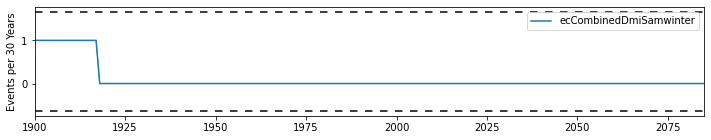

MPI-ESM1-2-LR


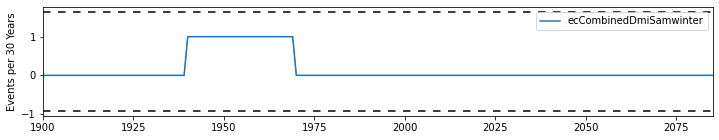

MRI-ESM2-0


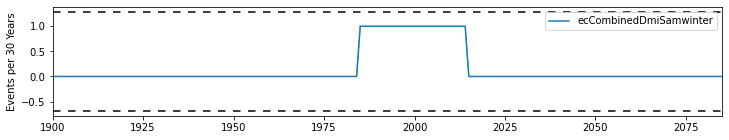

NorESM2-LM


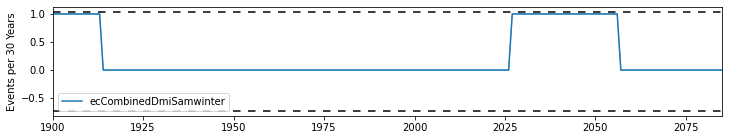

NorESM2-MM


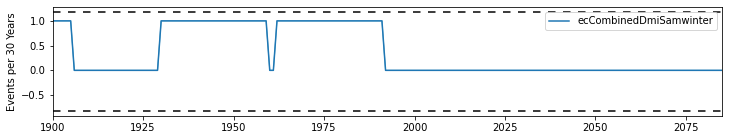

UKESM1-0-LL


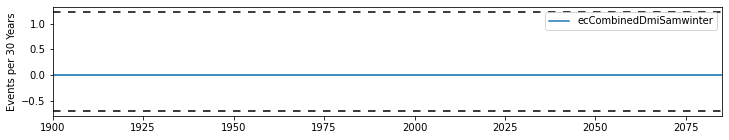

enso+iod
ACCESS-CM2


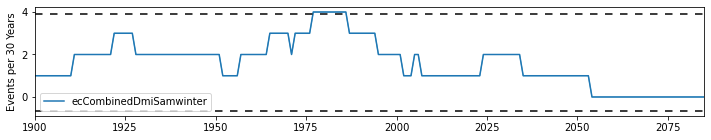

ACCESS-ESM1-5


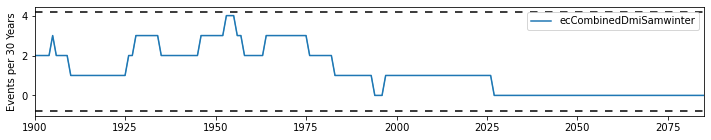

AWI-CM-1-1-MR


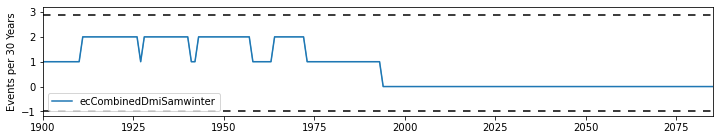

BCC-CSM2-MR


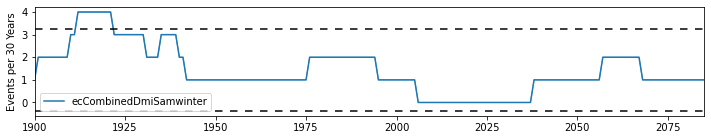

CAMS-CSM1-0


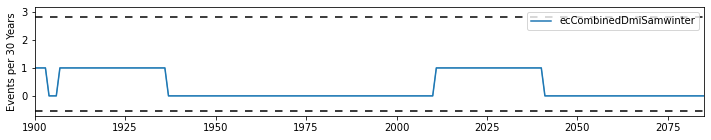

CAS-ESM2-0


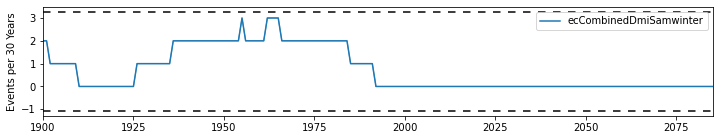

CESM2


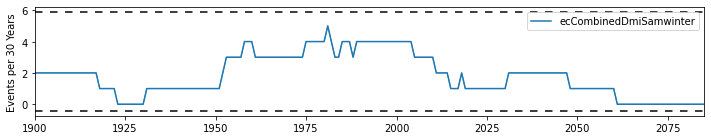

CESM2-WACCM


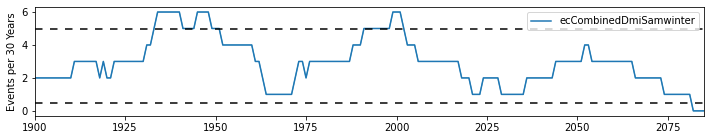

CIESM


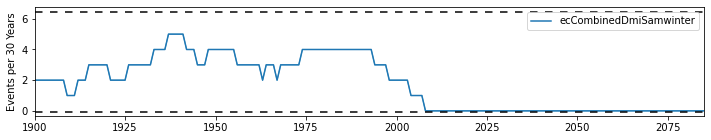

CMCC-CM2-SR5


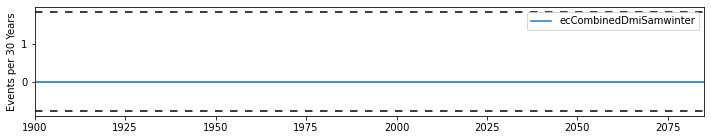

CMCC-ESM2


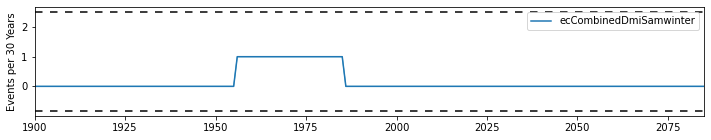

CNRM-CM6-1


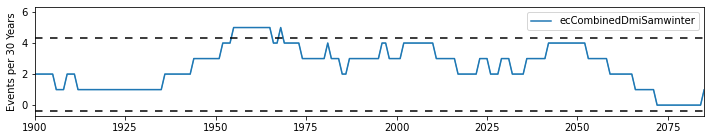

CNRM-ESM2-1


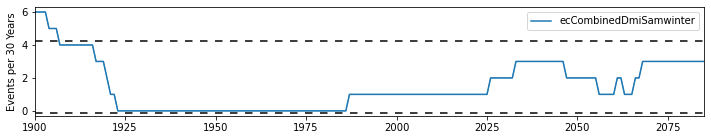

CanESM5


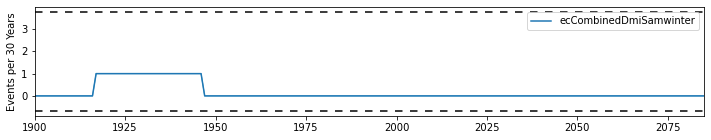

CanESM5-CanOE


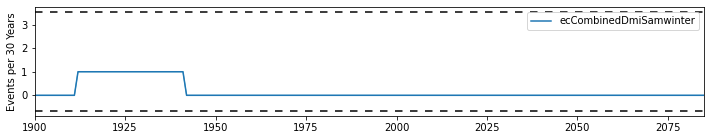

EC-Earth3


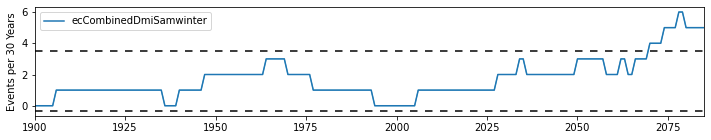

EC-Earth3-CC


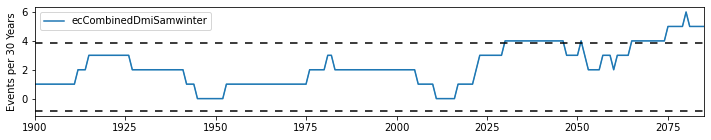

EC-Earth3-Veg


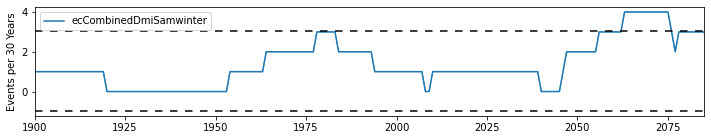

EC-Earth3-Veg-LR


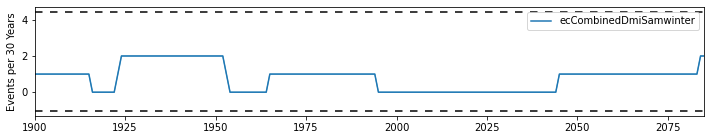

GFDL-CM4


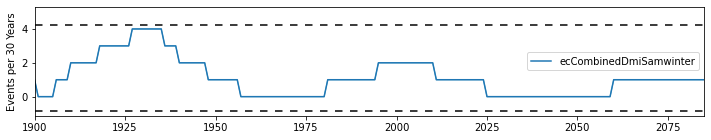

GFDL-ESM4


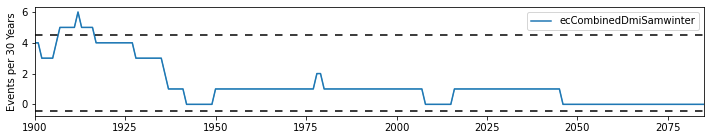

HadGEM3-GC31-LL


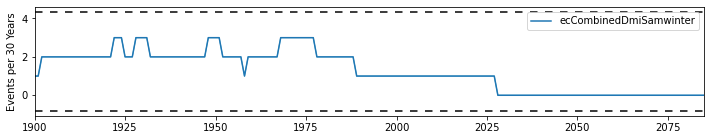

HadGEM3-GC31-MM


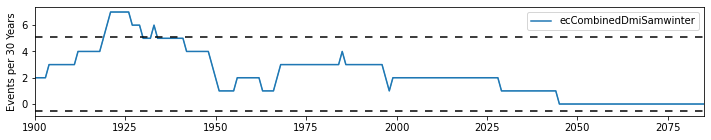

INM-CM4-8


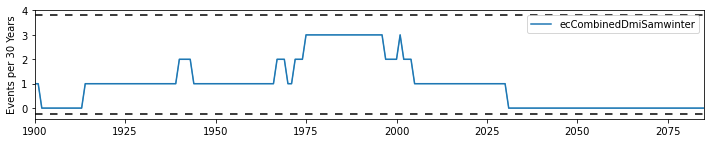

INM-CM5-0


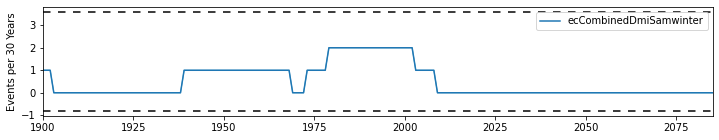

IPSL-CM6A-LR


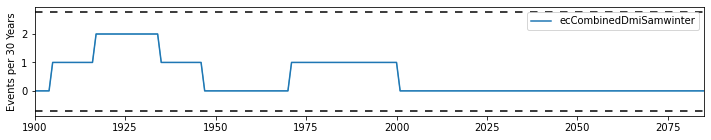

MCM-UA-1-0


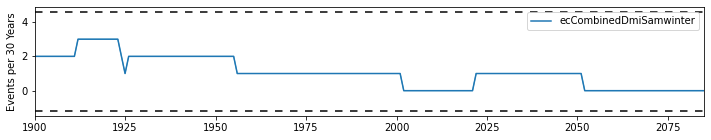

MIROC-ES2L


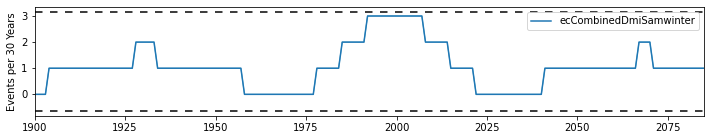

MIROC6


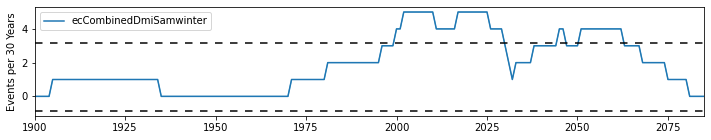

MPI-ESM1-2-HR


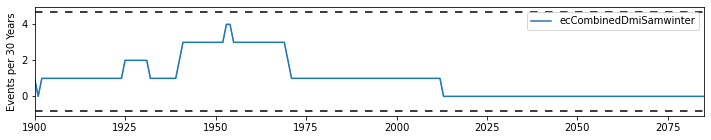

MPI-ESM1-2-LR


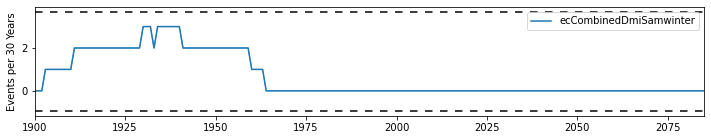

MRI-ESM2-0


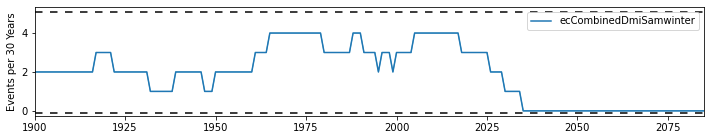

NorESM2-LM


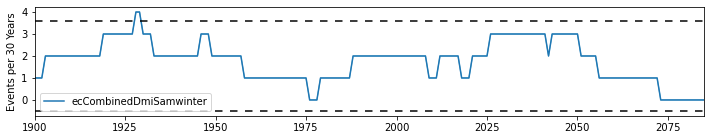

NorESM2-MM


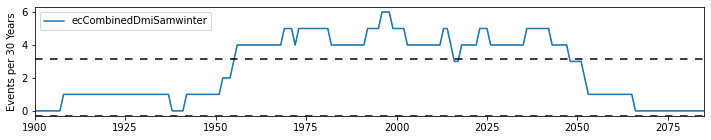

UKESM1-0-LL


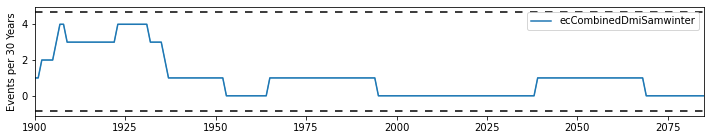

enso+sam
ACCESS-CM2


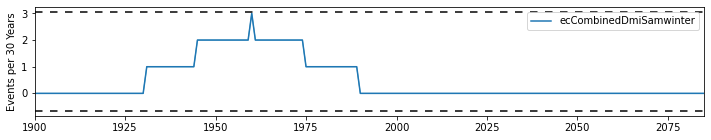

ACCESS-ESM1-5


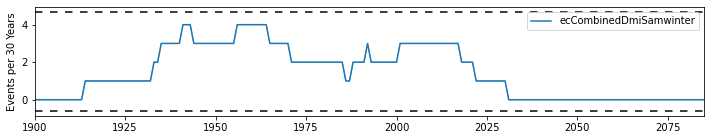

AWI-CM-1-1-MR


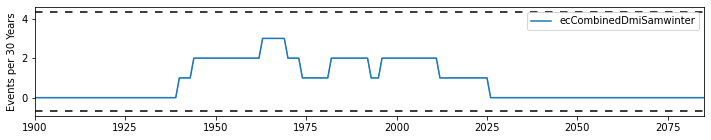

BCC-CSM2-MR


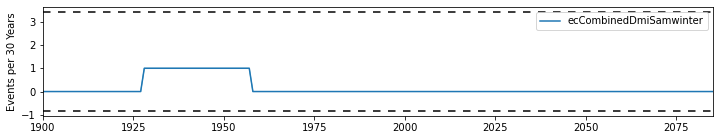

CAMS-CSM1-0


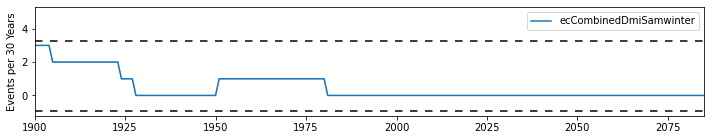

CAS-ESM2-0


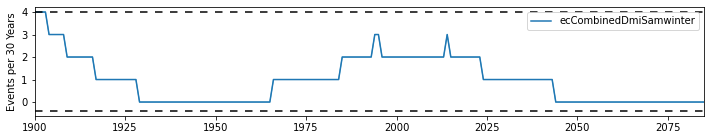

CESM2


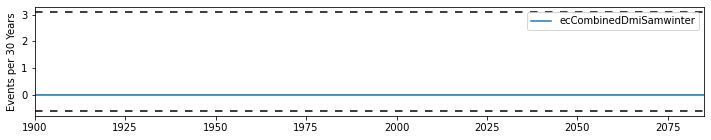

CESM2-WACCM


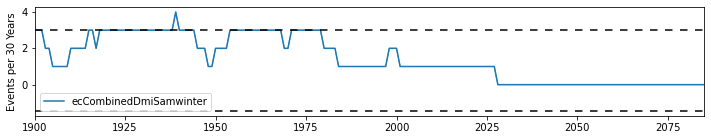

CIESM


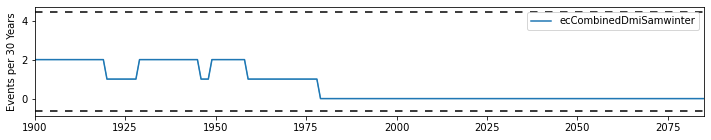

CMCC-CM2-SR5


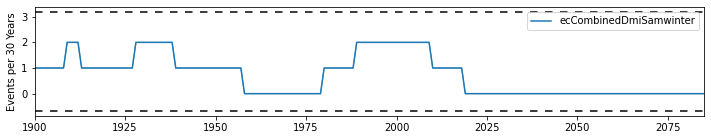

CMCC-ESM2


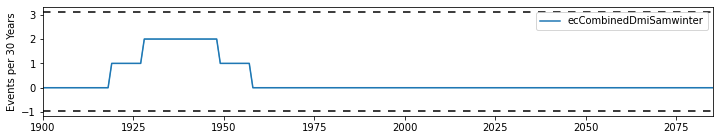

CNRM-CM6-1


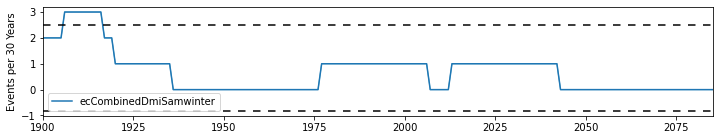

CNRM-ESM2-1


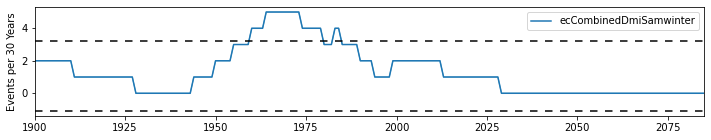

CanESM5


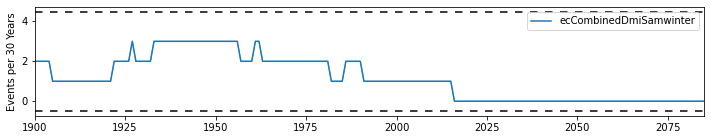

CanESM5-CanOE


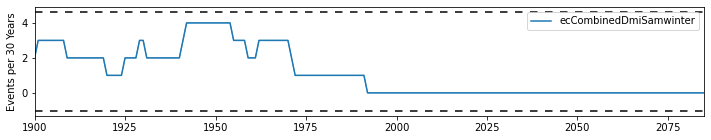

EC-Earth3


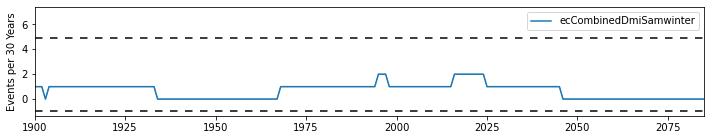

EC-Earth3-CC


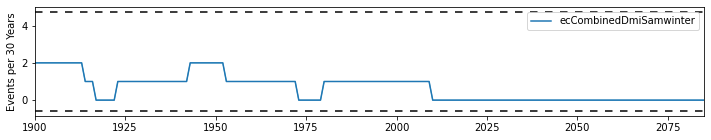

EC-Earth3-Veg


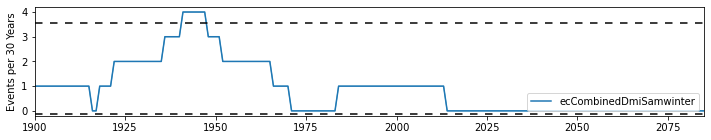

EC-Earth3-Veg-LR


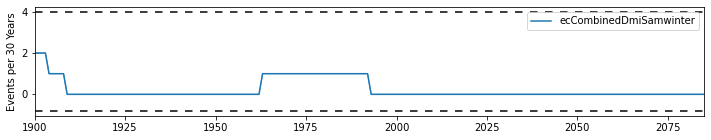

GFDL-CM4


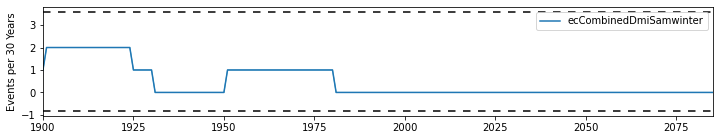

GFDL-ESM4


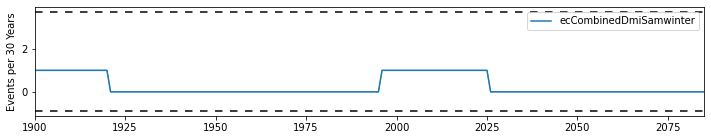

HadGEM3-GC31-LL


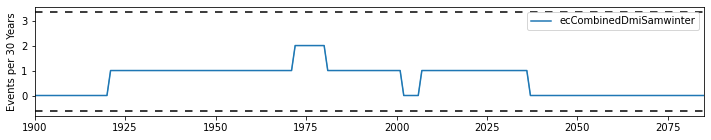

HadGEM3-GC31-MM


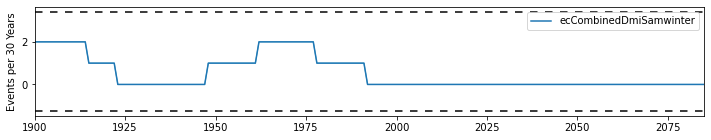

INM-CM4-8


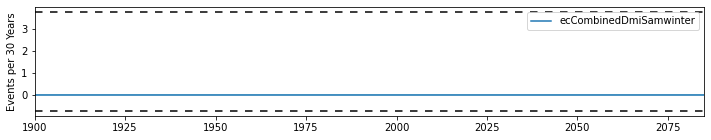

INM-CM5-0


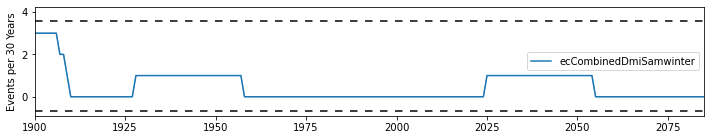

IPSL-CM6A-LR


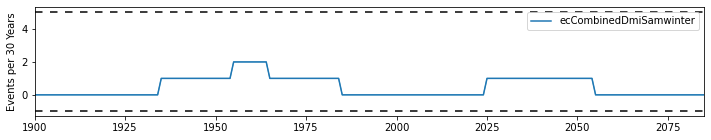

MCM-UA-1-0


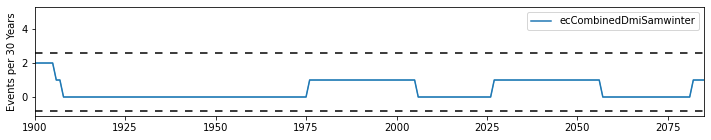

MIROC-ES2L


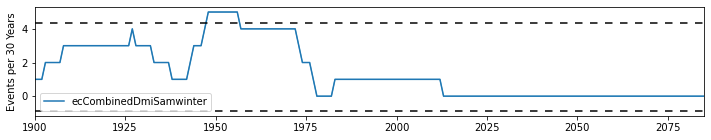

MIROC6


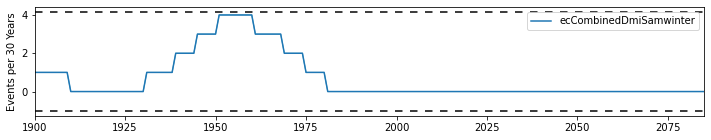

MPI-ESM1-2-HR


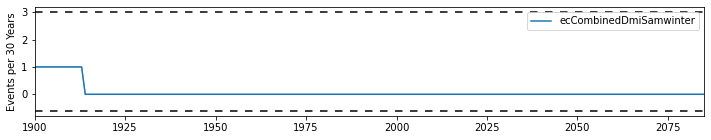

MPI-ESM1-2-LR


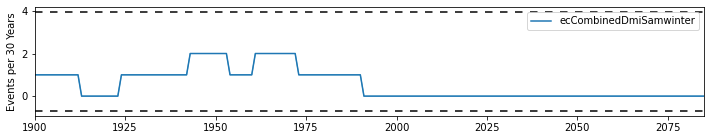

MRI-ESM2-0


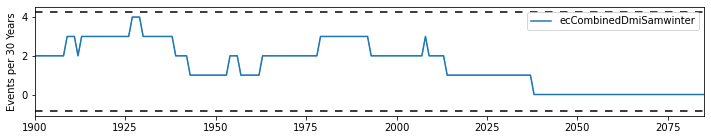

NorESM2-LM


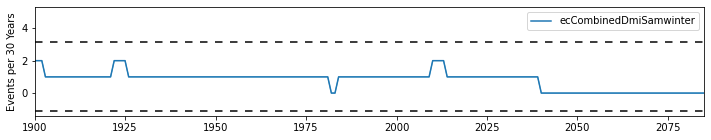

NorESM2-MM


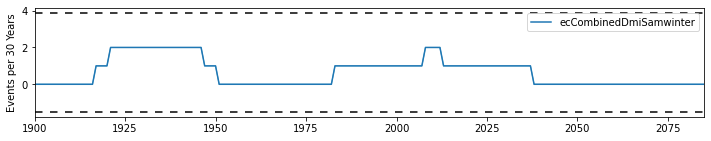

UKESM1-0-LL


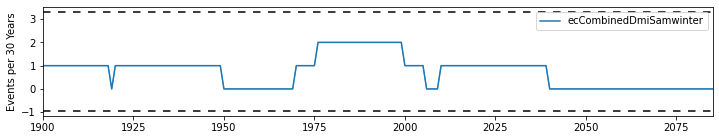

iod+sam
ACCESS-CM2


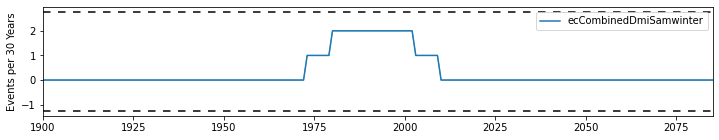

ACCESS-ESM1-5


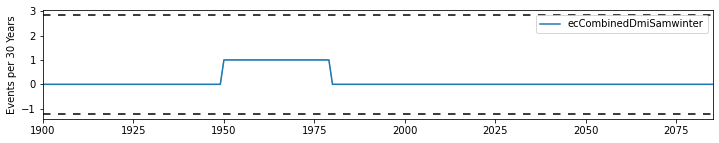

AWI-CM-1-1-MR


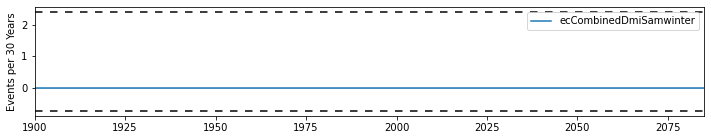

BCC-CSM2-MR


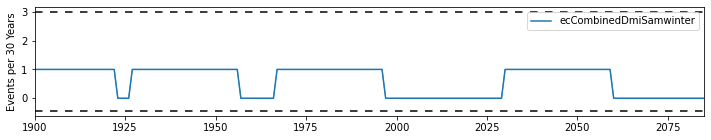

CAMS-CSM1-0


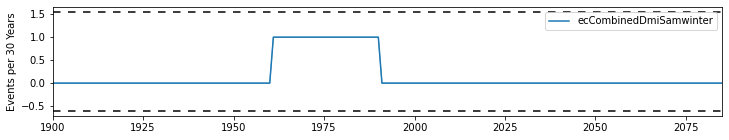

CAS-ESM2-0


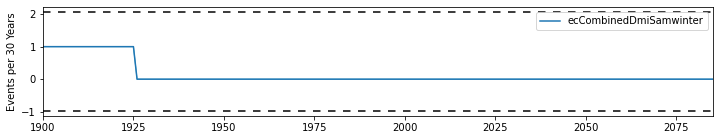

CESM2


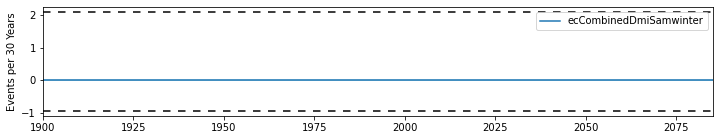

CESM2-WACCM


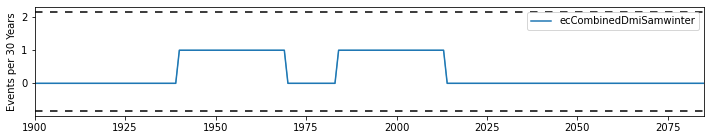

CIESM


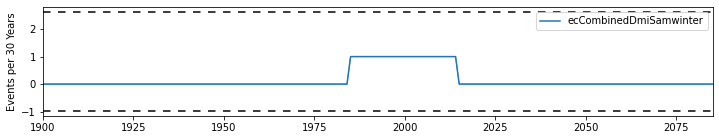

CMCC-CM2-SR5


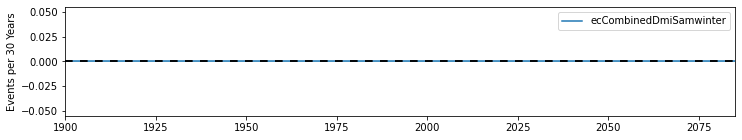

CMCC-ESM2


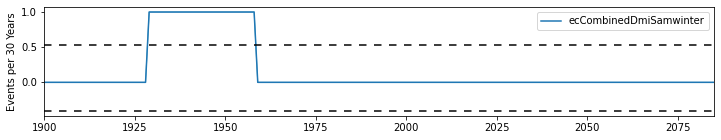

CNRM-CM6-1


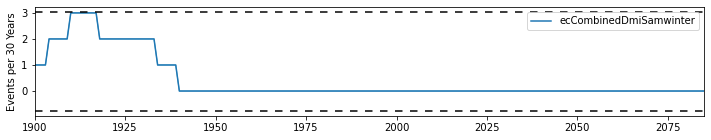

CNRM-ESM2-1


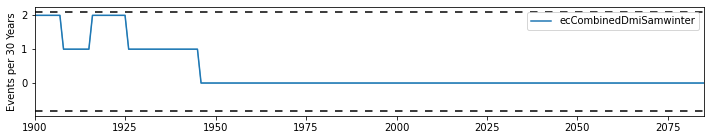

CanESM5


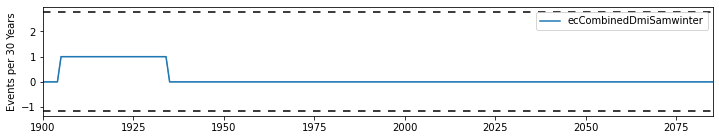

CanESM5-CanOE


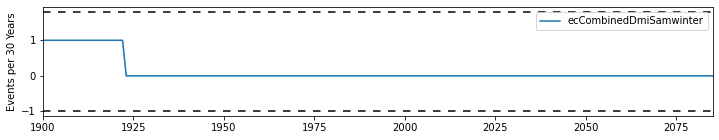

EC-Earth3


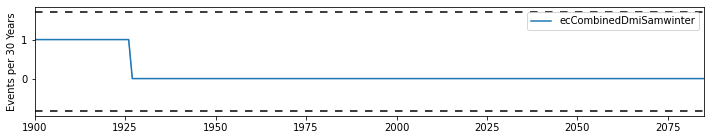

EC-Earth3-CC


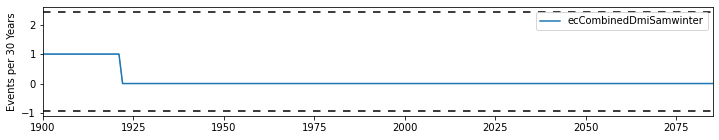

EC-Earth3-Veg


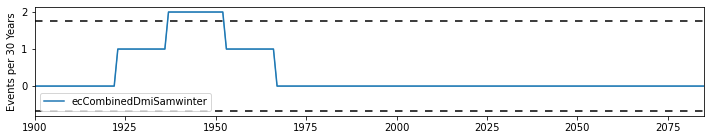

EC-Earth3-Veg-LR


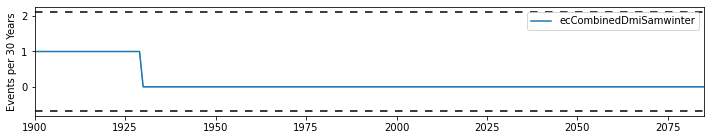

GFDL-CM4


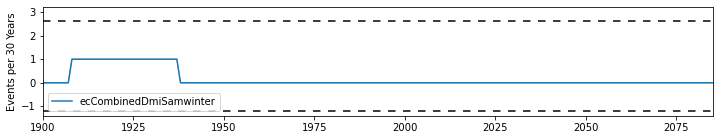

GFDL-ESM4


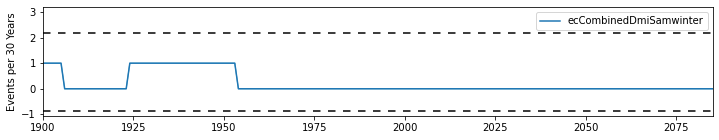

HadGEM3-GC31-LL


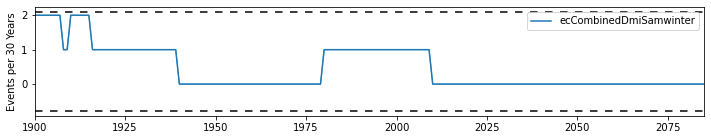

HadGEM3-GC31-MM


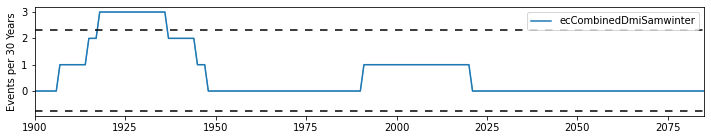

INM-CM4-8


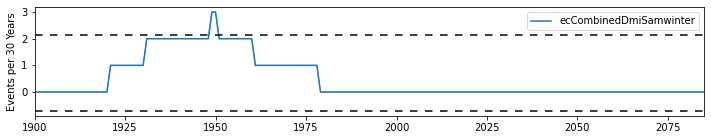

INM-CM5-0


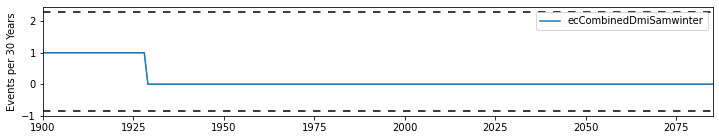

IPSL-CM6A-LR


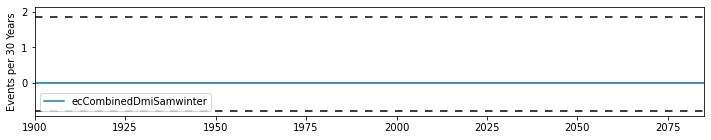

MCM-UA-1-0


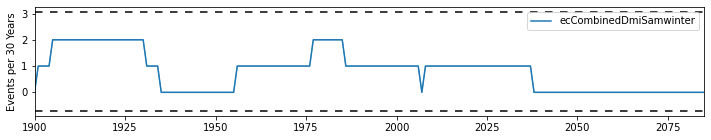

MIROC-ES2L


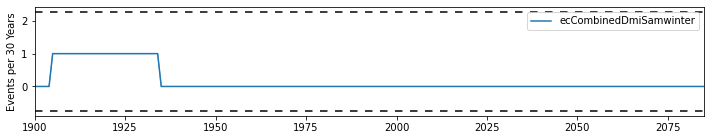

MIROC6


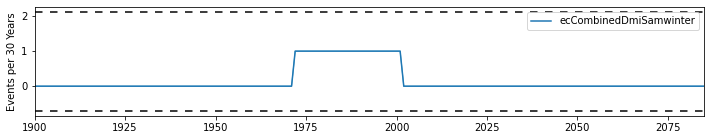

MPI-ESM1-2-HR


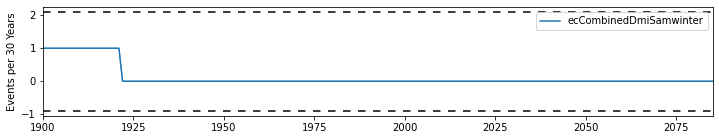

MPI-ESM1-2-LR


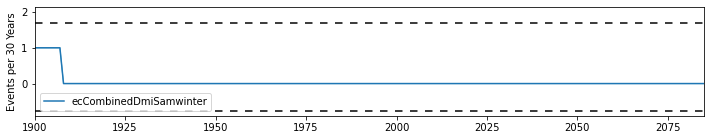

MRI-ESM2-0


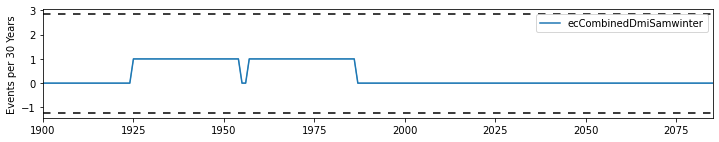

NorESM2-LM


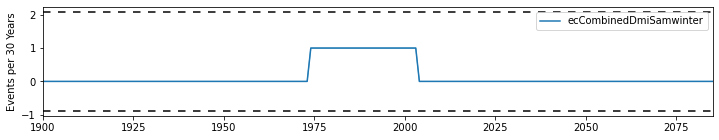

NorESM2-MM


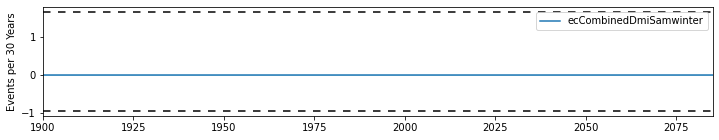

UKESM1-0-LL


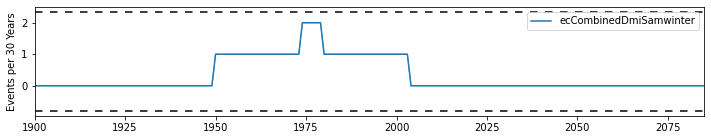

summer
anyCompound
ACCESS-CM2


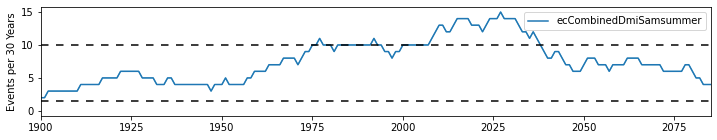

ACCESS-ESM1-5


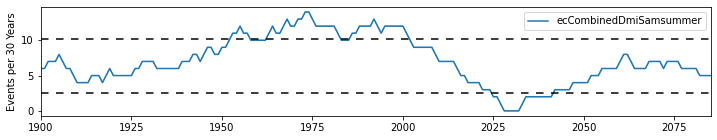

AWI-CM-1-1-MR


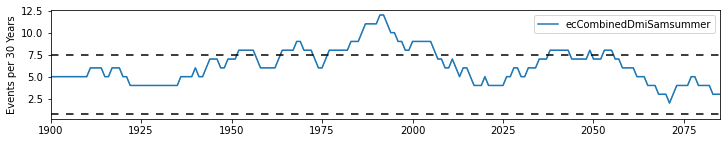

BCC-CSM2-MR


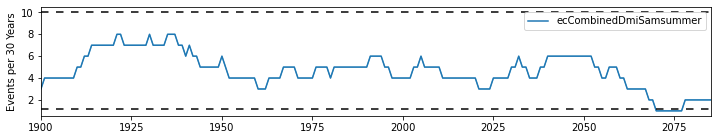

CAMS-CSM1-0


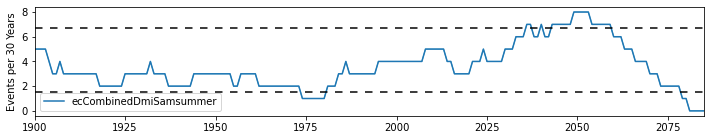

CAS-ESM2-0


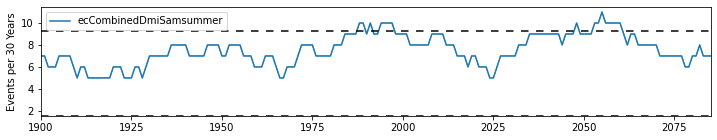

CESM2


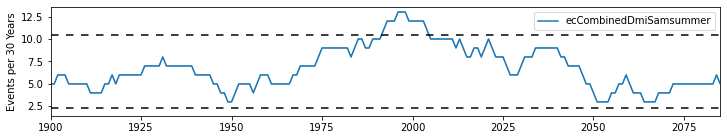

CESM2-WACCM


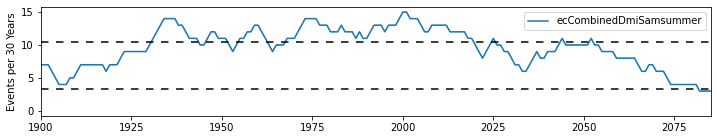

CIESM


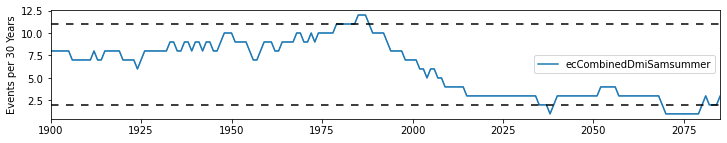

CMCC-CM2-SR5


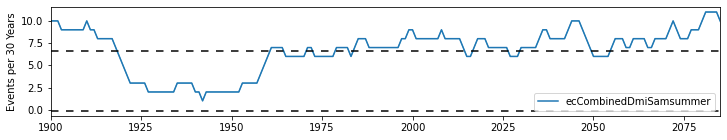

CMCC-ESM2


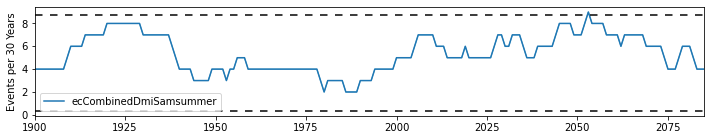

CNRM-CM6-1


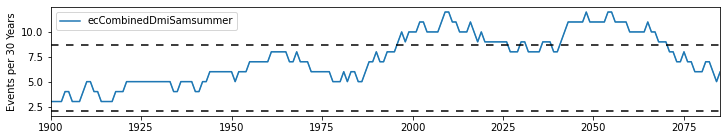

CNRM-ESM2-1


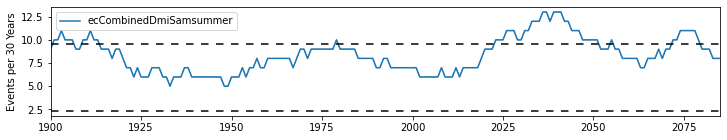

CanESM5


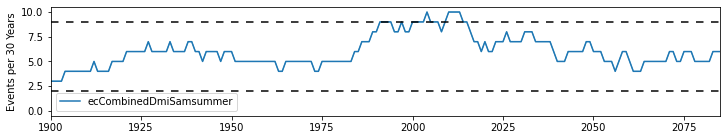

CanESM5-CanOE


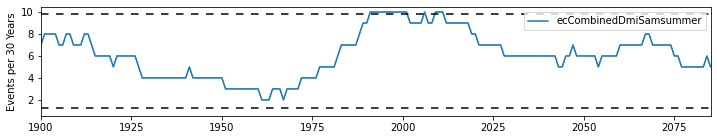

EC-Earth3


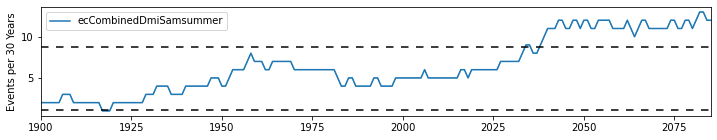

EC-Earth3-CC


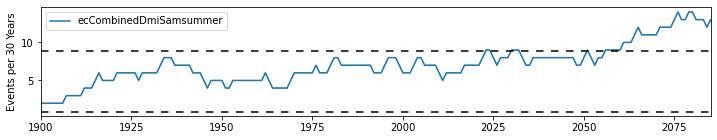

EC-Earth3-Veg


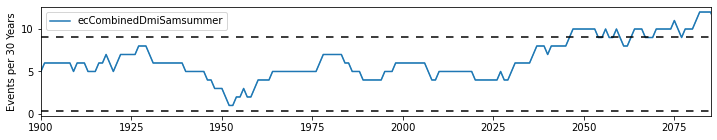

EC-Earth3-Veg-LR


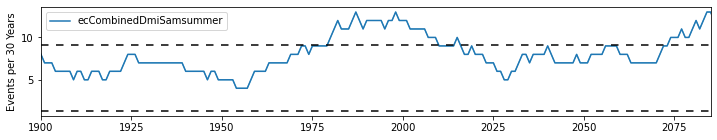

GFDL-CM4


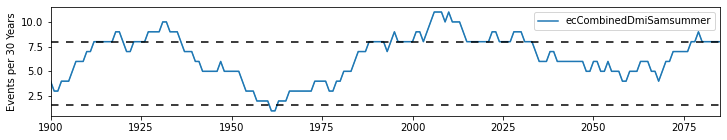

GFDL-ESM4


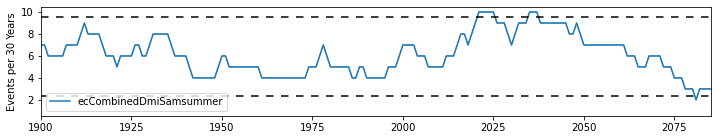

HadGEM3-GC31-LL


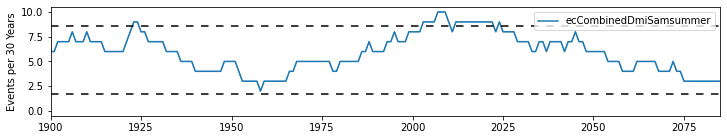

HadGEM3-GC31-MM


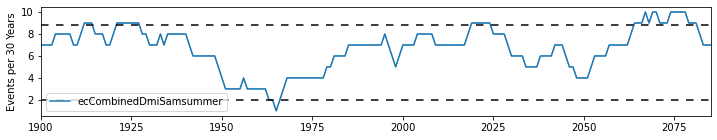

INM-CM4-8


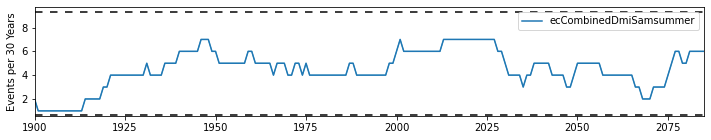

INM-CM5-0


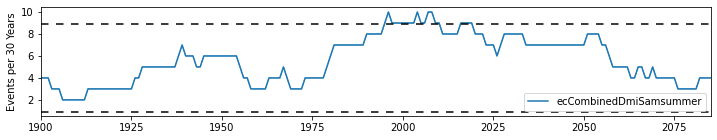

IPSL-CM6A-LR


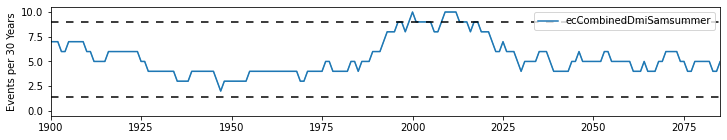

MCM-UA-1-0


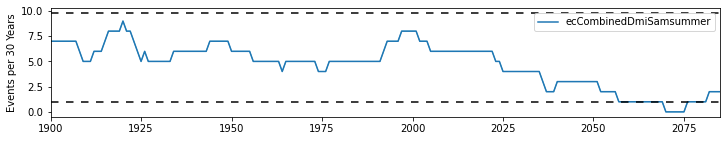

MIROC-ES2L


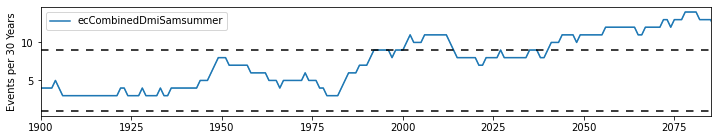

MIROC6


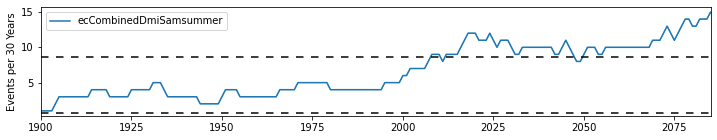

MPI-ESM1-2-HR


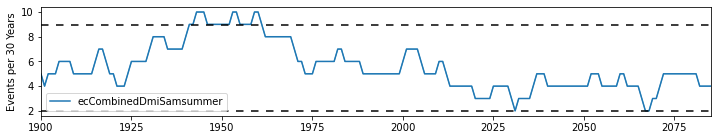

MPI-ESM1-2-LR


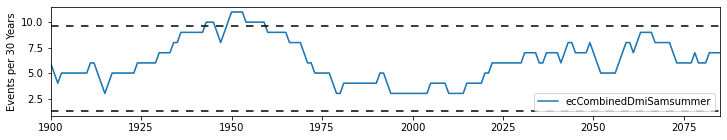

MRI-ESM2-0


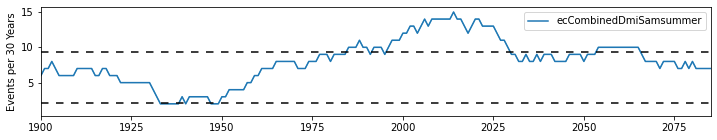

NorESM2-LM


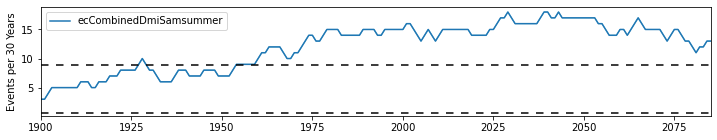

NorESM2-MM


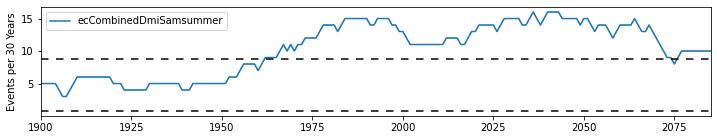

UKESM1-0-LL


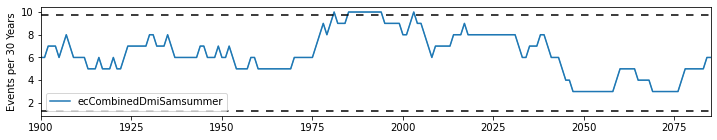

all3
ACCESS-CM2


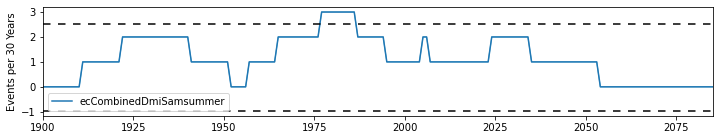

ACCESS-ESM1-5


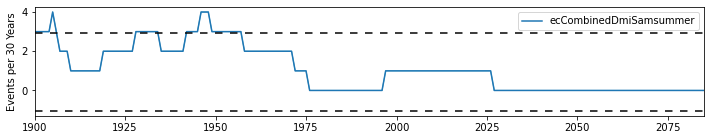

AWI-CM-1-1-MR


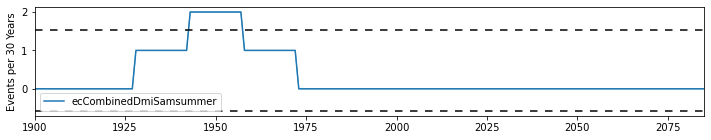

BCC-CSM2-MR


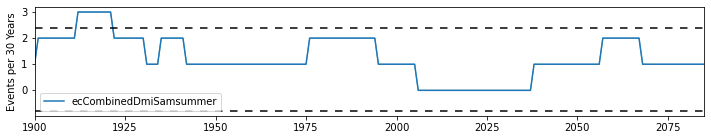

CAMS-CSM1-0


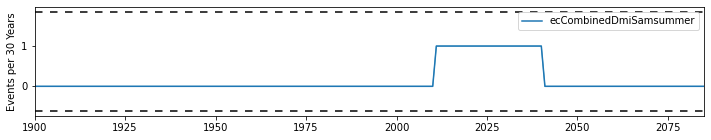

CAS-ESM2-0


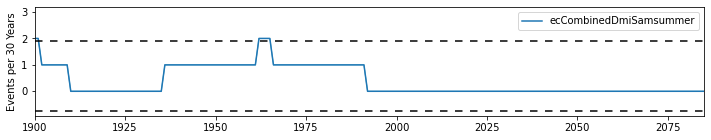

CESM2


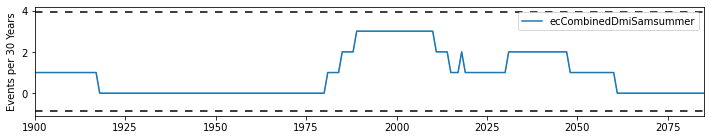

CESM2-WACCM


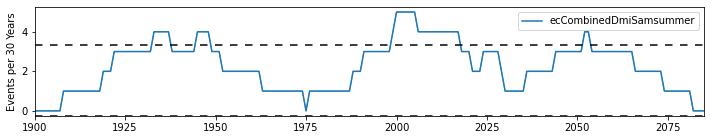

CIESM


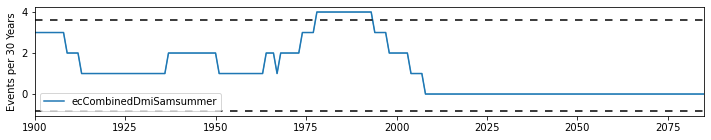

CMCC-CM2-SR5


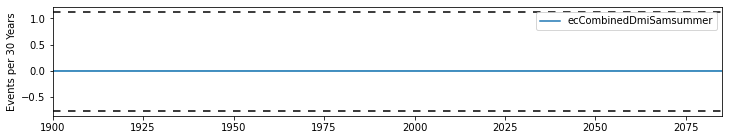

CMCC-ESM2


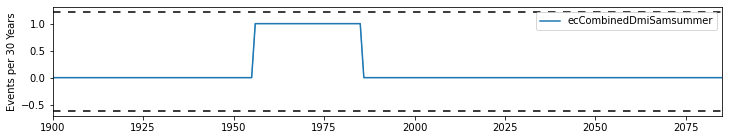

CNRM-CM6-1


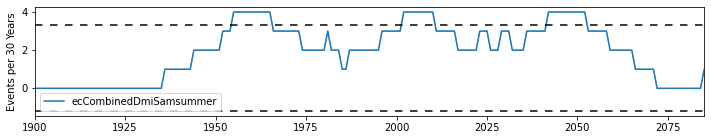

CNRM-ESM2-1


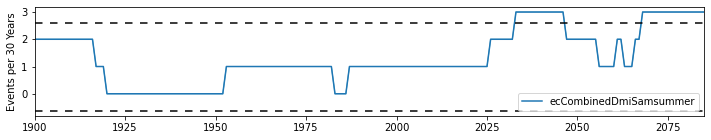

CanESM5


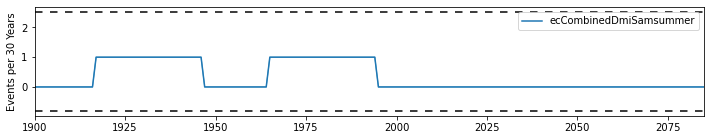

CanESM5-CanOE


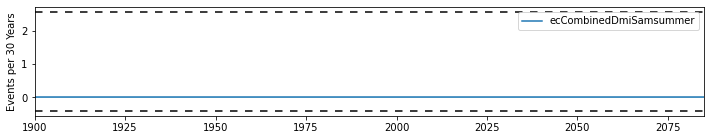

EC-Earth3


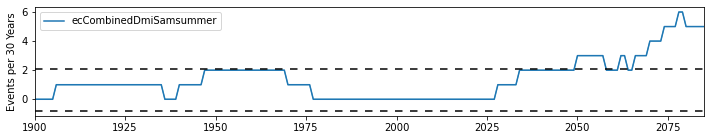

EC-Earth3-CC


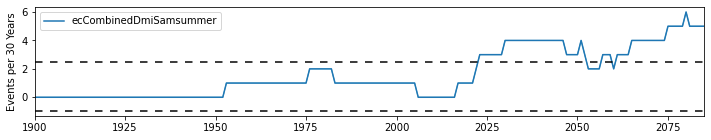

EC-Earth3-Veg


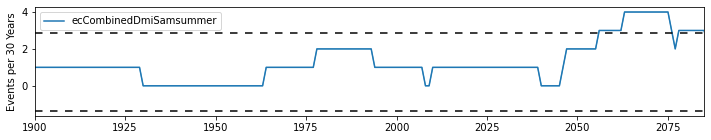

EC-Earth3-Veg-LR


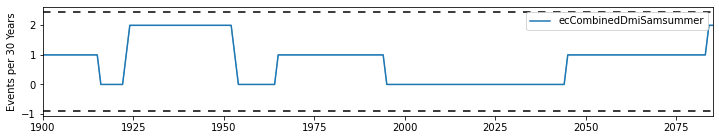

GFDL-CM4


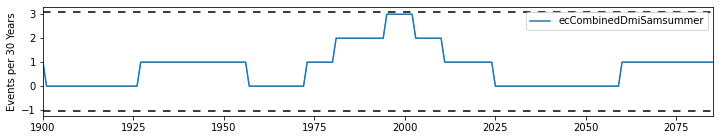

GFDL-ESM4


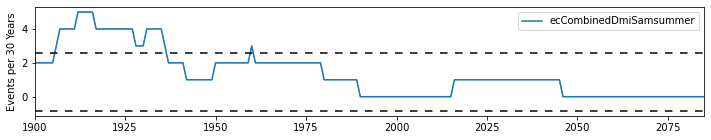

HadGEM3-GC31-LL


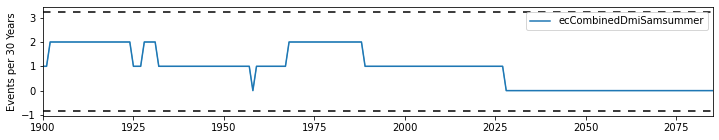

HadGEM3-GC31-MM


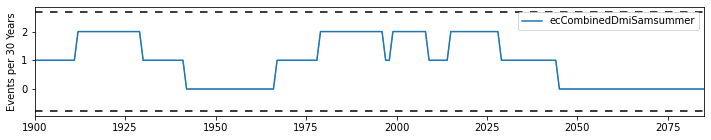

INM-CM4-8


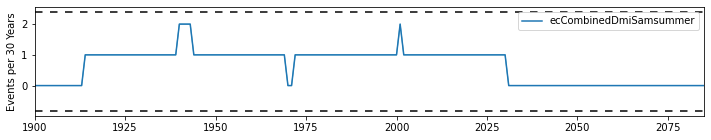

INM-CM5-0


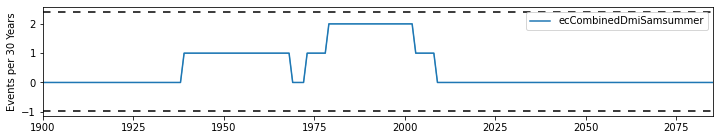

IPSL-CM6A-LR


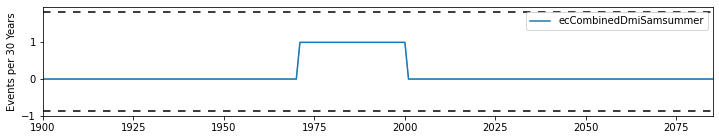

MCM-UA-1-0


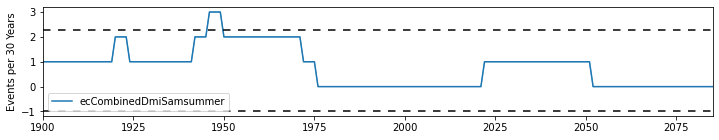

MIROC-ES2L


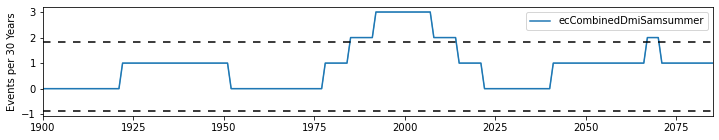

MIROC6


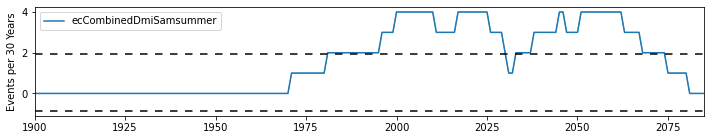

MPI-ESM1-2-HR


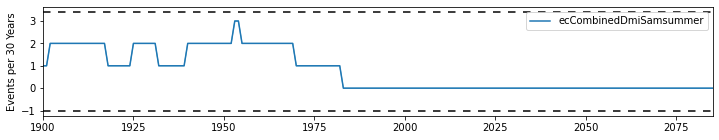

MPI-ESM1-2-LR


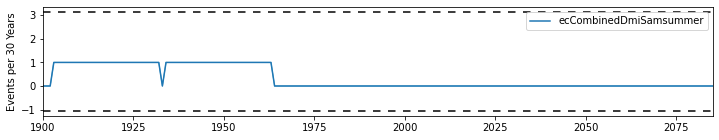

MRI-ESM2-0


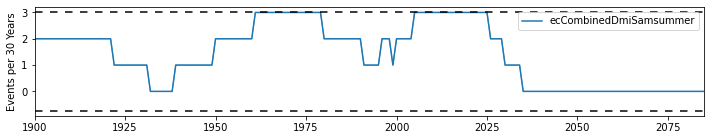

NorESM2-LM


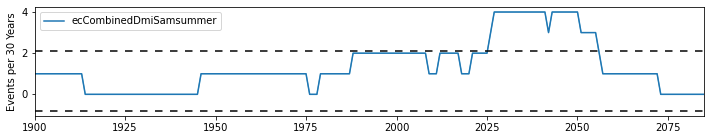

NorESM2-MM


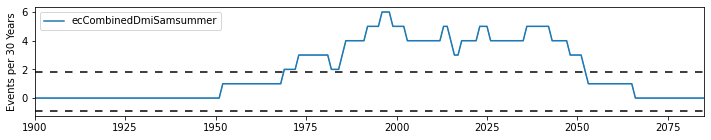

UKESM1-0-LL


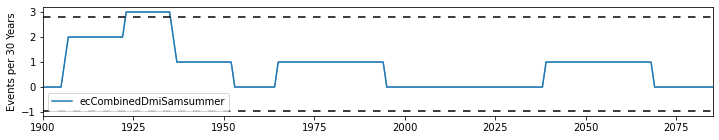

enso+iod
ACCESS-CM2


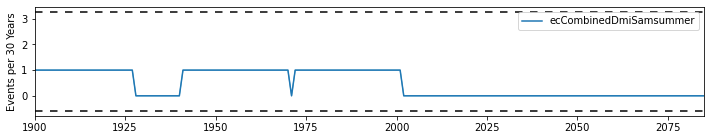

ACCESS-ESM1-5


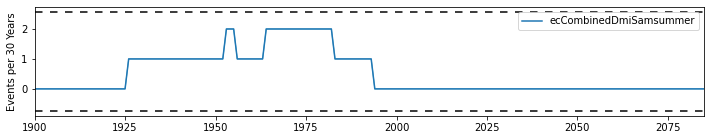

AWI-CM-1-1-MR


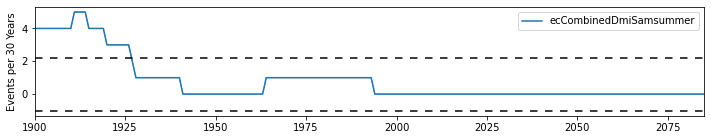

BCC-CSM2-MR


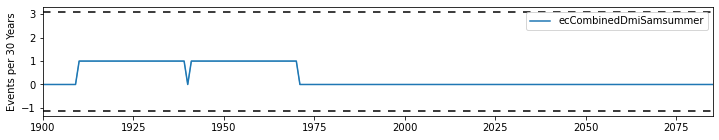

CAMS-CSM1-0


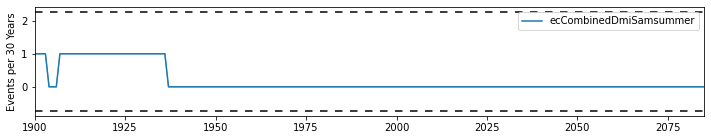

CAS-ESM2-0


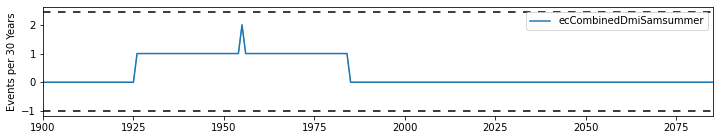

CESM2


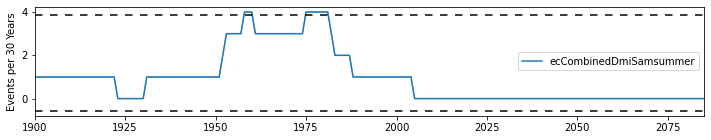

CESM2-WACCM


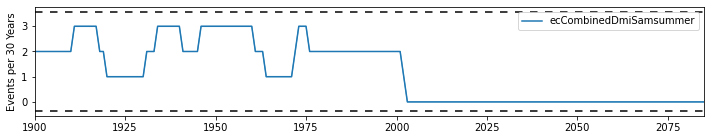

CIESM


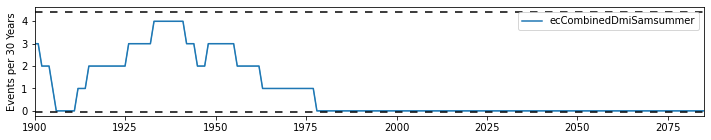

CMCC-CM2-SR5


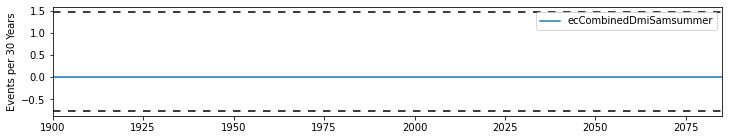

CMCC-ESM2


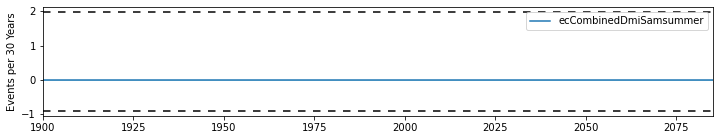

CNRM-CM6-1


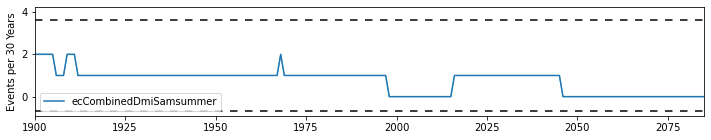

CNRM-ESM2-1


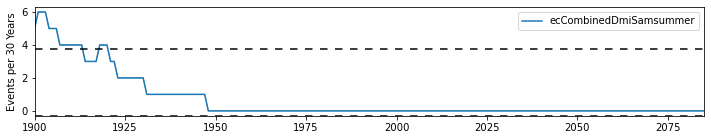

CanESM5


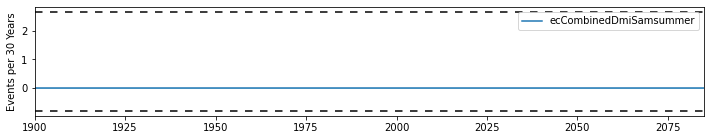

CanESM5-CanOE


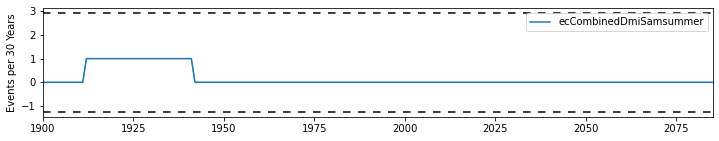

EC-Earth3


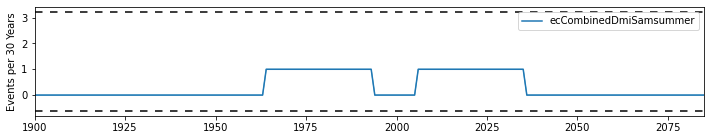

EC-Earth3-CC


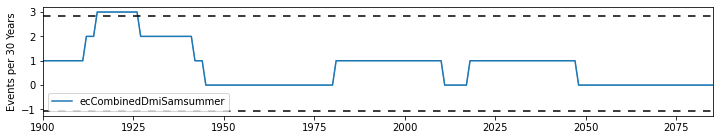

EC-Earth3-Veg


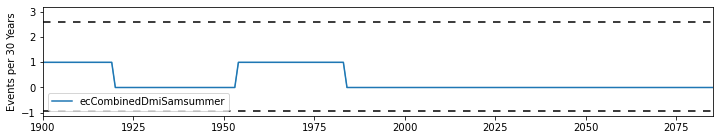

EC-Earth3-Veg-LR


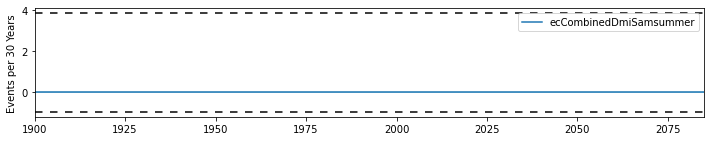

GFDL-CM4


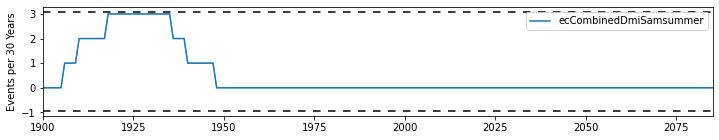

GFDL-ESM4


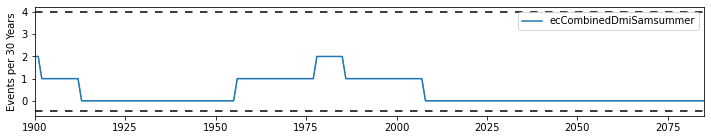

HadGEM3-GC31-LL


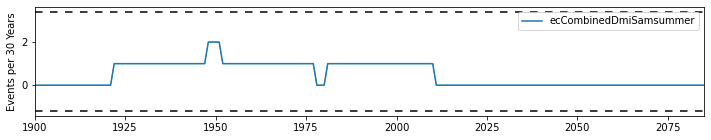

HadGEM3-GC31-MM


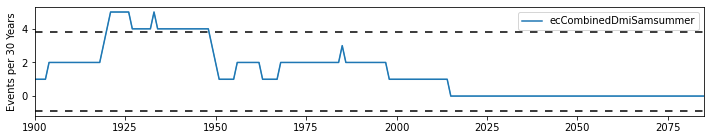

INM-CM4-8


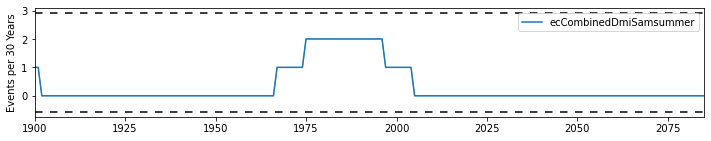

INM-CM5-0


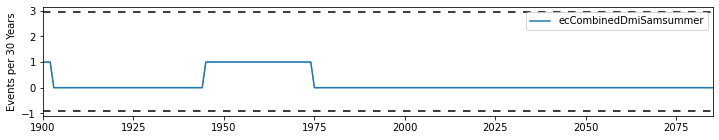

IPSL-CM6A-LR


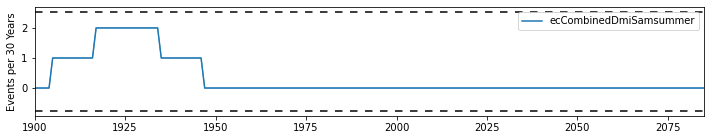

MCM-UA-1-0


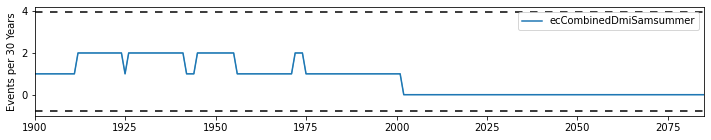

MIROC-ES2L


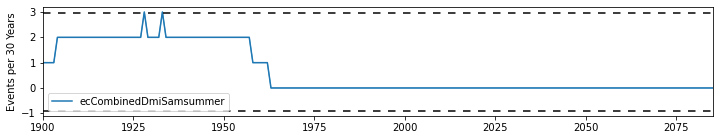

MIROC6


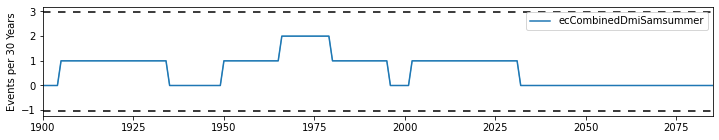

MPI-ESM1-2-HR


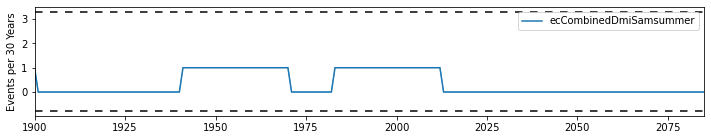

MPI-ESM1-2-LR


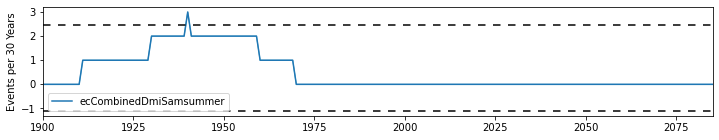

MRI-ESM2-0


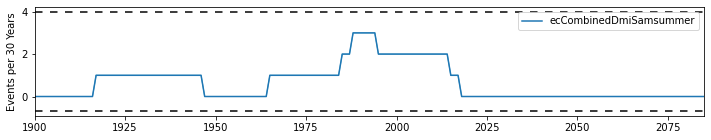

NorESM2-LM


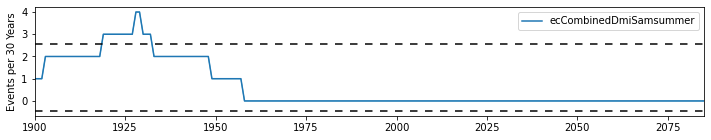

NorESM2-MM


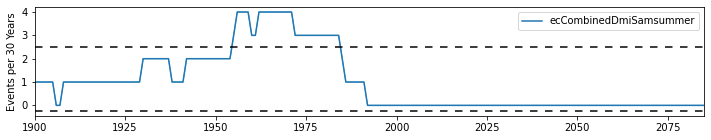

UKESM1-0-LL


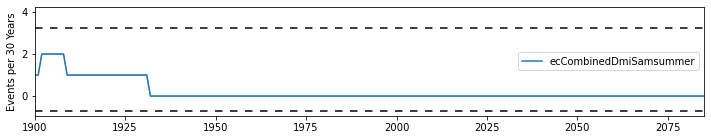

enso+sam
ACCESS-CM2


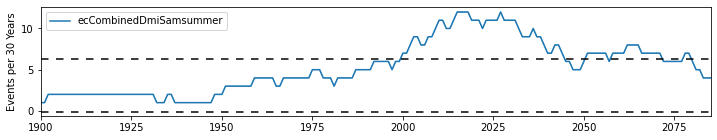

ACCESS-ESM1-5


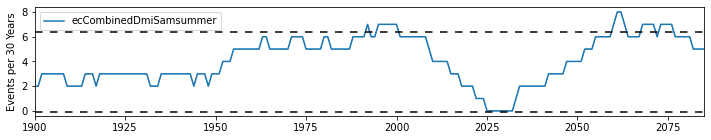

AWI-CM-1-1-MR


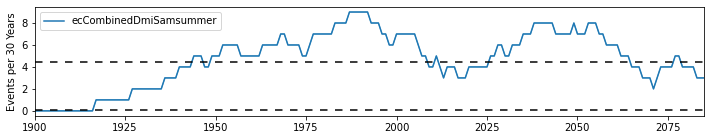

BCC-CSM2-MR


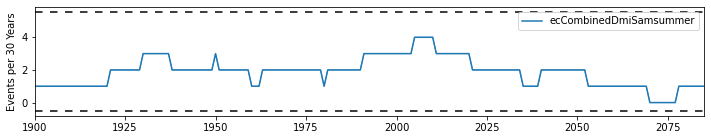

CAMS-CSM1-0


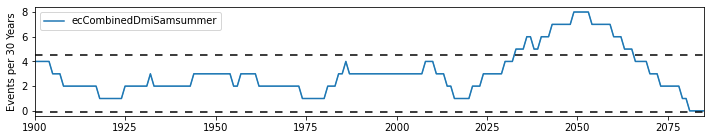

CAS-ESM2-0


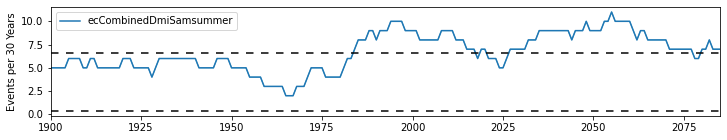

CESM2


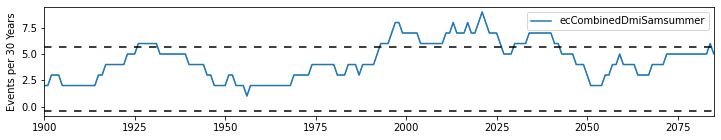

CESM2-WACCM


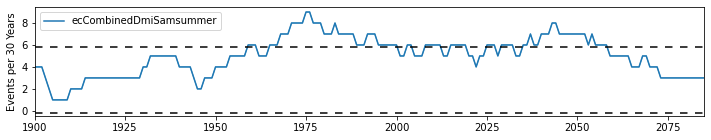

CIESM


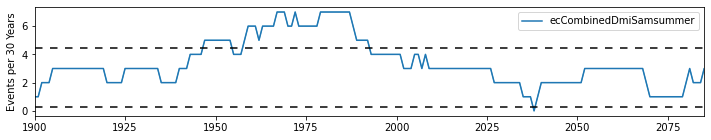

CMCC-CM2-SR5


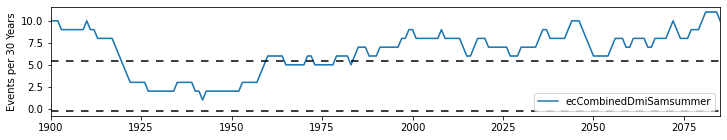

CMCC-ESM2


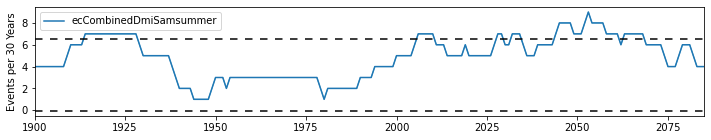

CNRM-CM6-1


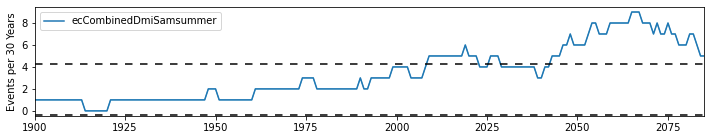

CNRM-ESM2-1


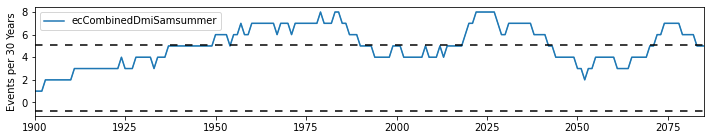

CanESM5


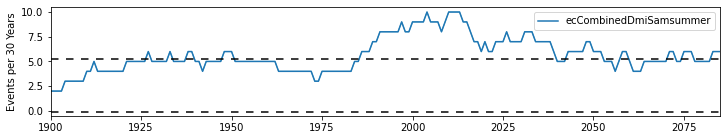

CanESM5-CanOE


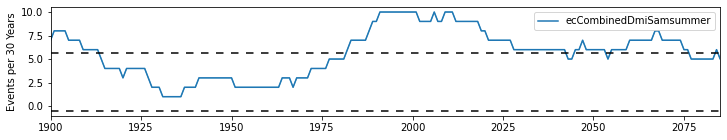

EC-Earth3


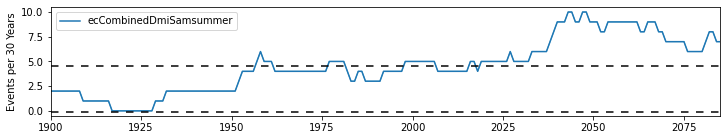

EC-Earth3-CC


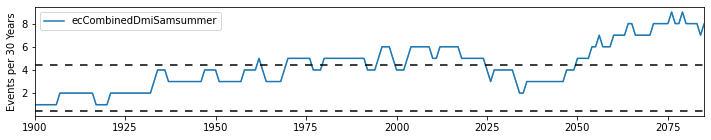

EC-Earth3-Veg


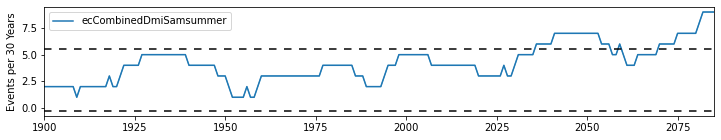

EC-Earth3-Veg-LR


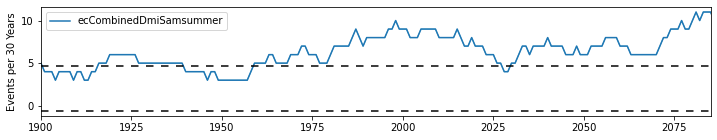

GFDL-CM4


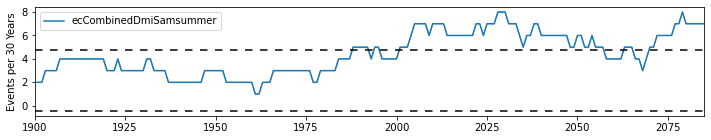

GFDL-ESM4


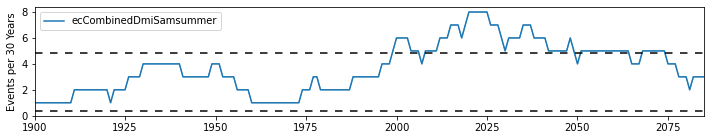

HadGEM3-GC31-LL


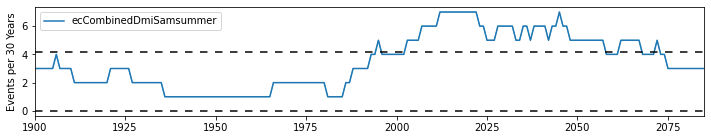

HadGEM3-GC31-MM


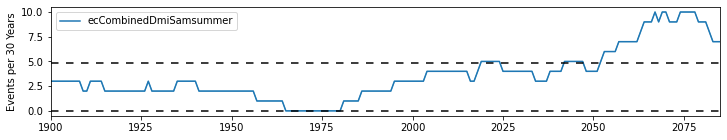

INM-CM4-8


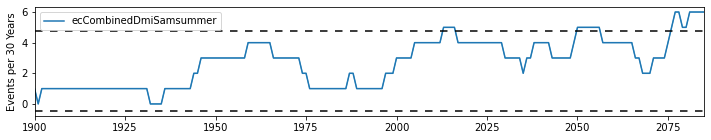

INM-CM5-0


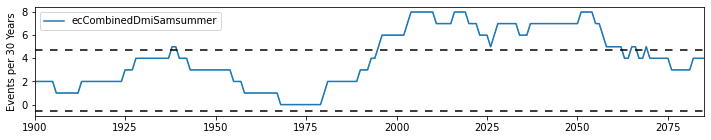

IPSL-CM6A-LR


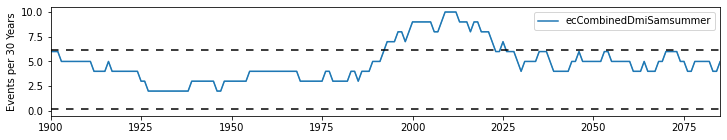

MCM-UA-1-0


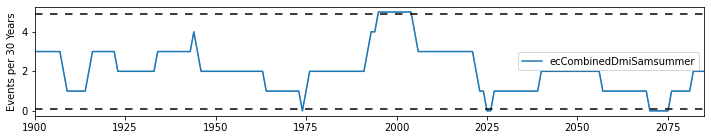

MIROC-ES2L


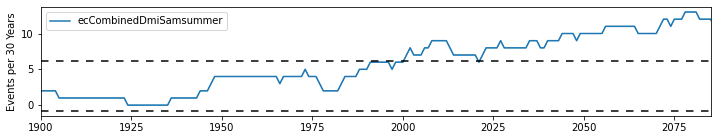

MIROC6


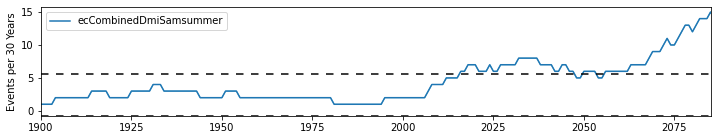

MPI-ESM1-2-HR


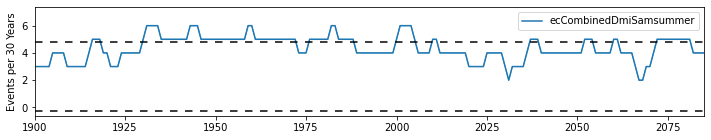

MPI-ESM1-2-LR


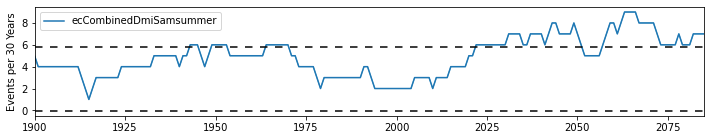

MRI-ESM2-0


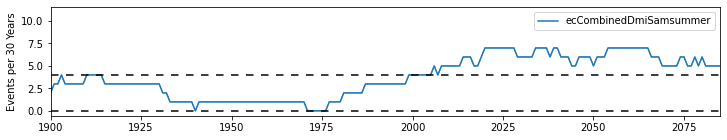

NorESM2-LM


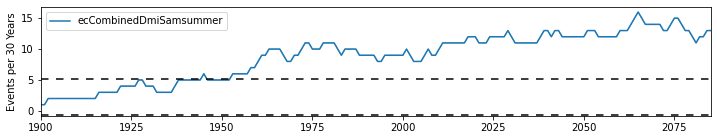

NorESM2-MM


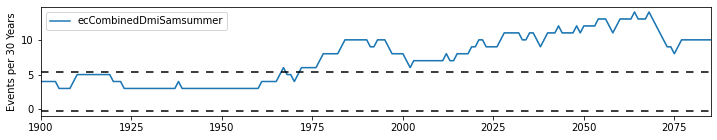

UKESM1-0-LL


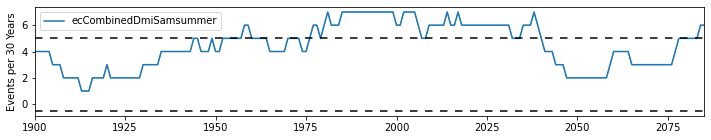

iod+sam
ACCESS-CM2


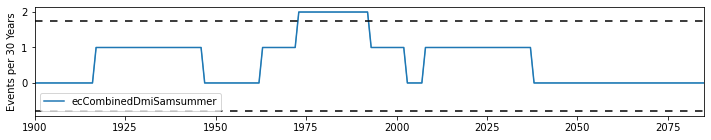

ACCESS-ESM1-5


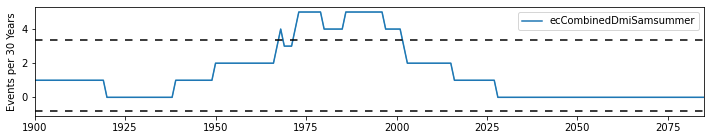

AWI-CM-1-1-MR


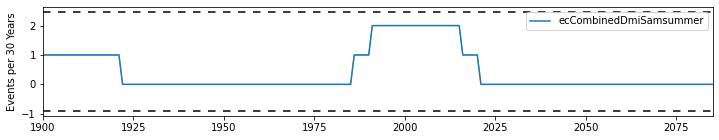

BCC-CSM2-MR


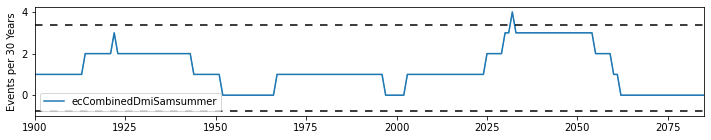

CAMS-CSM1-0


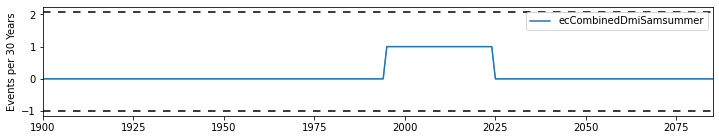

CAS-ESM2-0


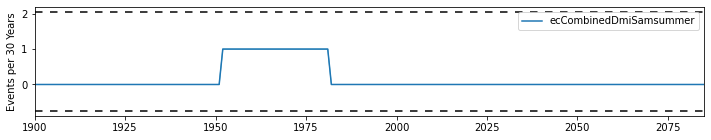

CESM2


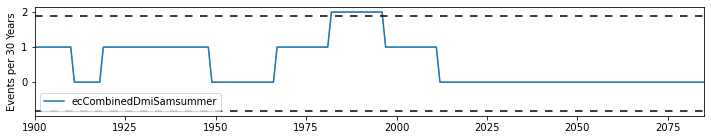

CESM2-WACCM


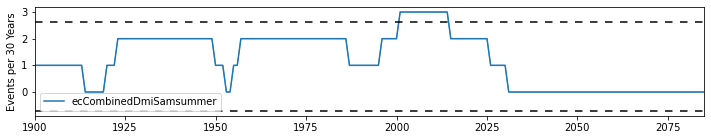

CIESM


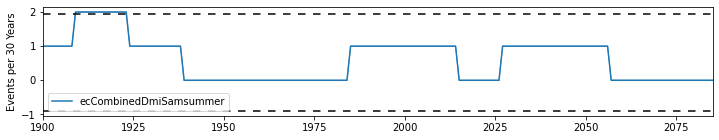

CMCC-CM2-SR5


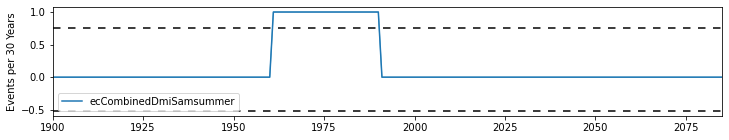

CMCC-ESM2


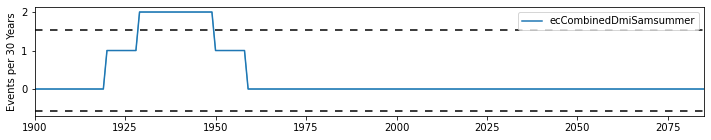

CNRM-CM6-1


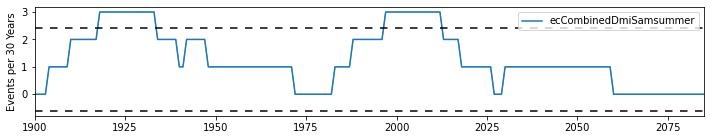

CNRM-ESM2-1


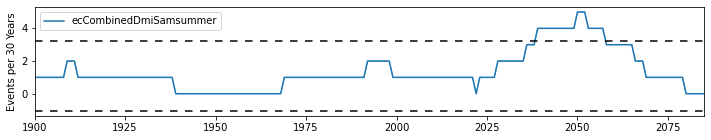

CanESM5


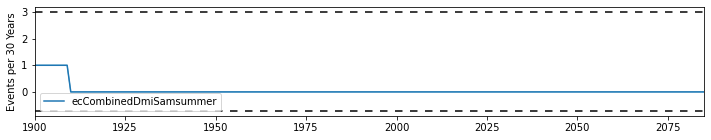

CanESM5-CanOE


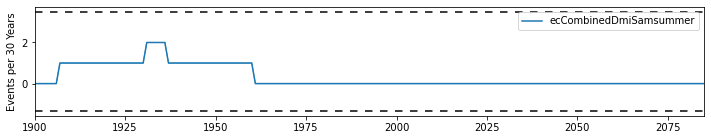

EC-Earth3


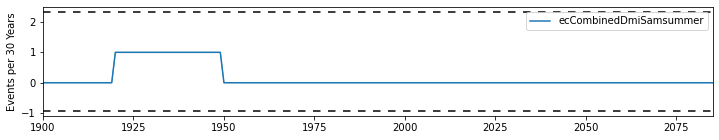

EC-Earth3-CC


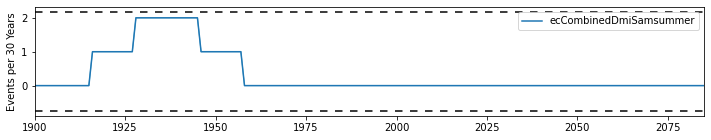

EC-Earth3-Veg


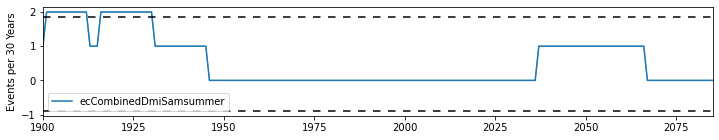

EC-Earth3-Veg-LR


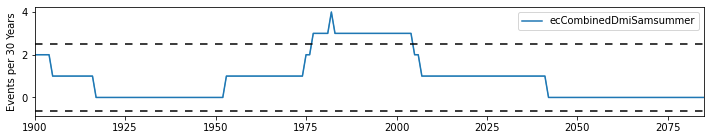

GFDL-CM4


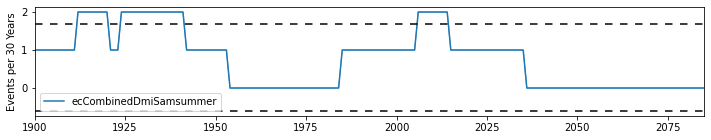

GFDL-ESM4


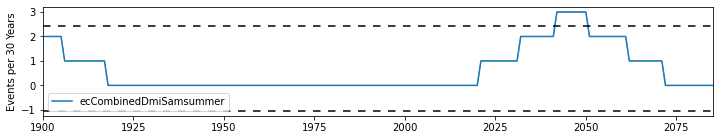

HadGEM3-GC31-LL


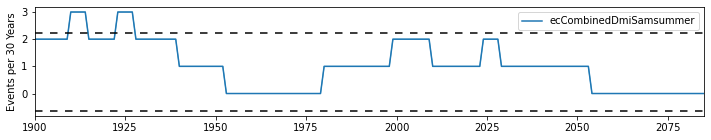

HadGEM3-GC31-MM


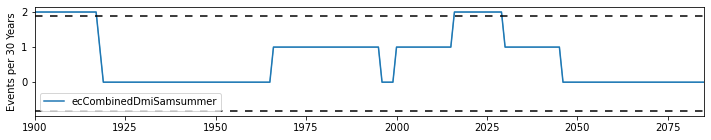

INM-CM4-8


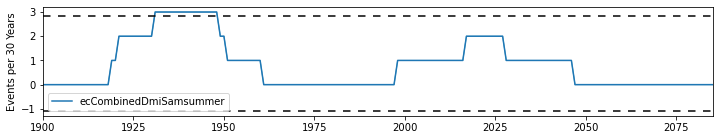

INM-CM5-0


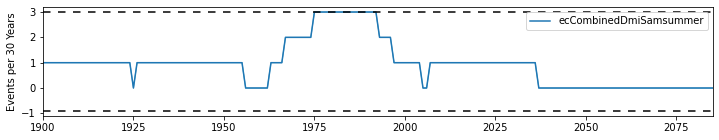

IPSL-CM6A-LR


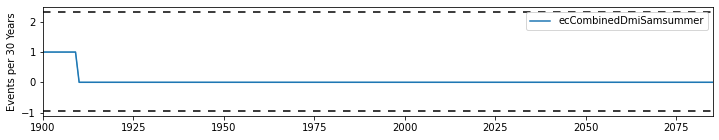

MCM-UA-1-0


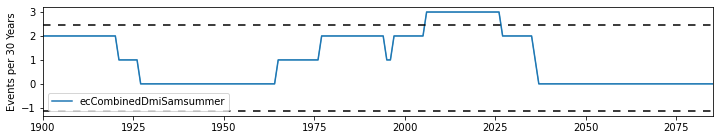

MIROC-ES2L


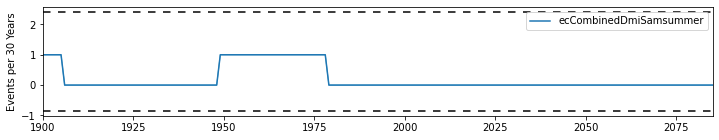

MIROC6


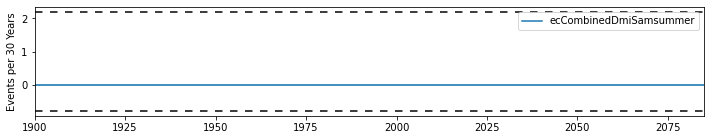

MPI-ESM1-2-HR


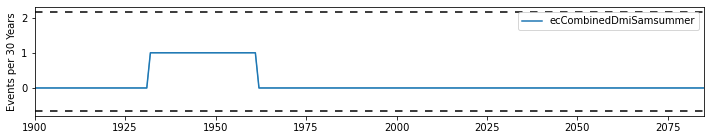

MPI-ESM1-2-LR


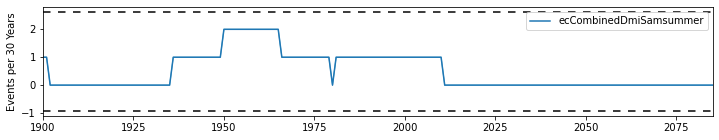

MRI-ESM2-0


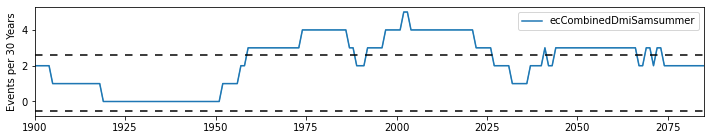

NorESM2-LM


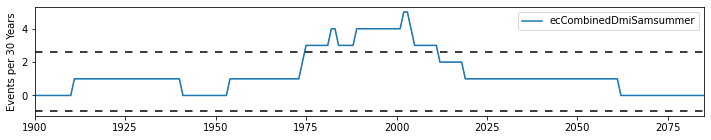

NorESM2-MM


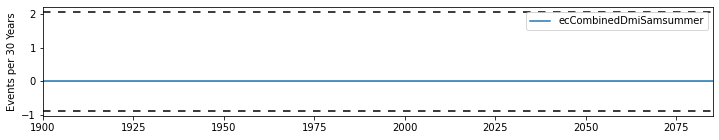

UKESM1-0-LL


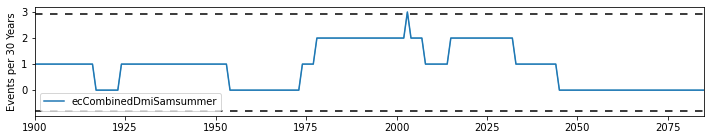

In [38]:
for iFire in ['pos','neg']:
    print(iFire)
    for iSeason in ['winter','summer']:
        print(iSeason)
        for iCompound in compounds:
            print(iCompound)
            for iModel in compoundXr.model.values:
                print(iModel)

                iCompoundsXr=compoundXr[indexSet+iSeason].sel(
                        model=iModel, fire=iFire, compound=iCompound, drop=True
                    ).rolling(
                        year=30,min_periods=15,center=True
                    ).sum('year').to_dataset()

                modelEmergePlot(
                    iCompoundsXr.sel(experiment='ssp585',drop=True),
                    iCompoundsXr.sel(experiment='piControl',drop=True),
                    xlim=[1900,2085]
                )

                plt.show()

ACCESS-CM2


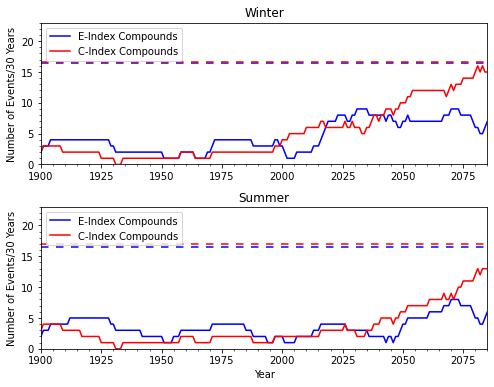

ACCESS-ESM1-5


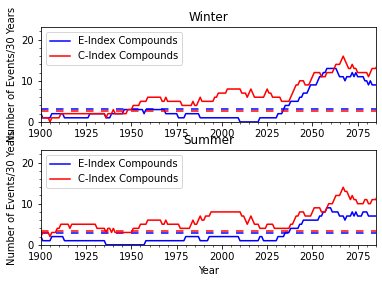

AWI-CM-1-1-MR


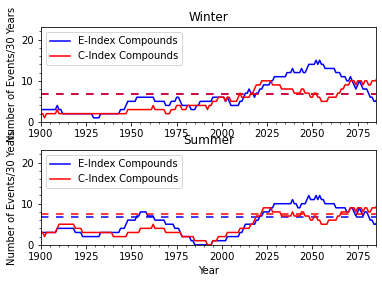

BCC-CSM2-MR


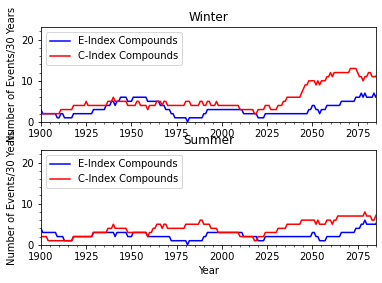

CAMS-CSM1-0


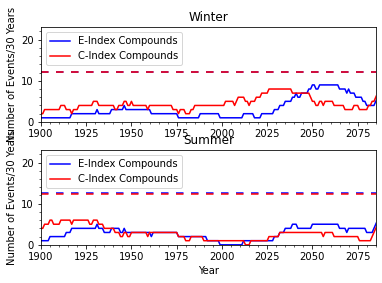

CAS-ESM2-0


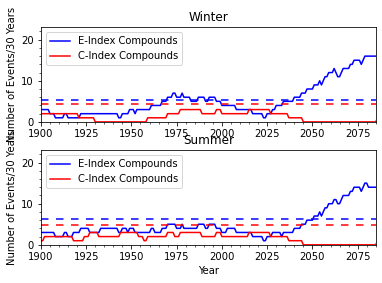

CESM2


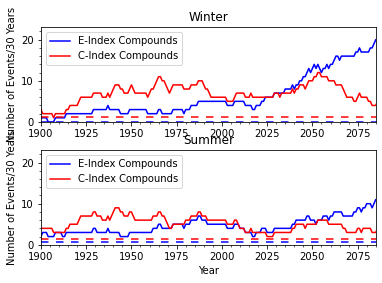

CESM2-WACCM


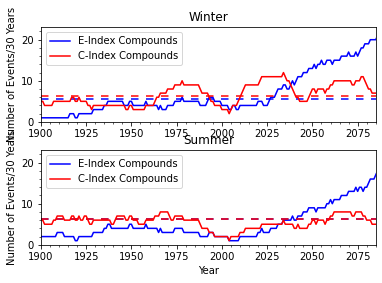

CIESM


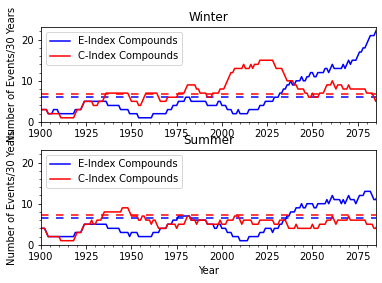

CMCC-CM2-SR5


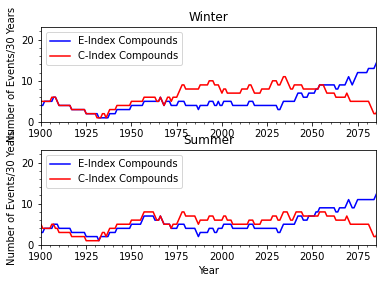

CMCC-ESM2


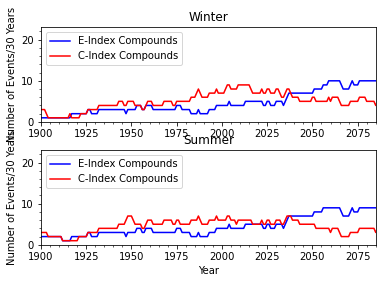

CNRM-CM6-1


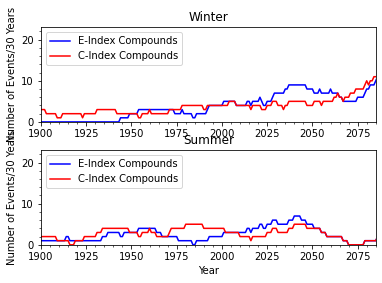

CNRM-ESM2-1


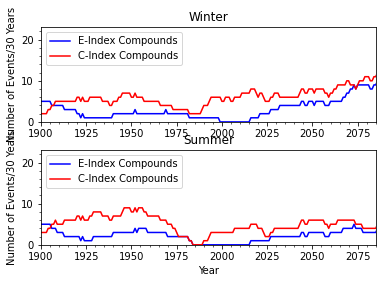

CanESM5


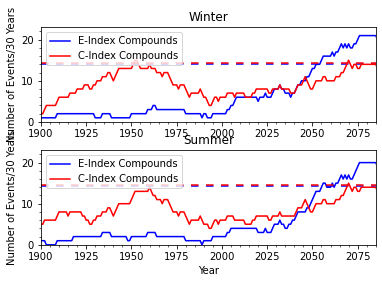

CanESM5-CanOE


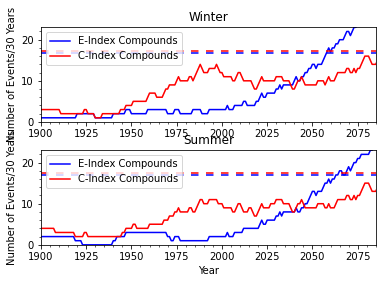

EC-Earth3


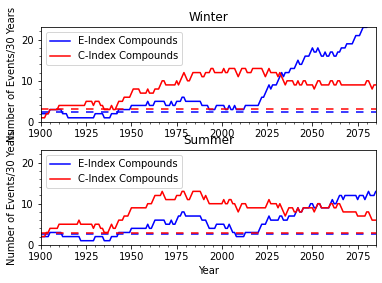

EC-Earth3-CC


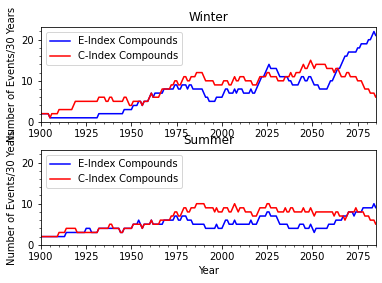

EC-Earth3-Veg


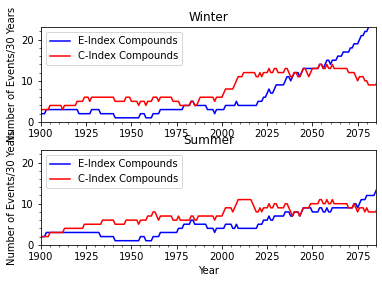

EC-Earth3-Veg-LR


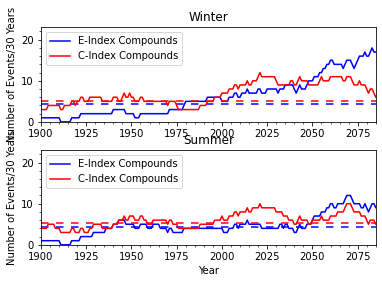

GFDL-CM4


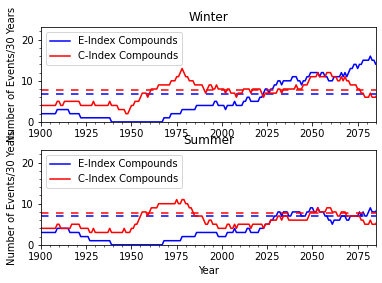

GFDL-ESM4


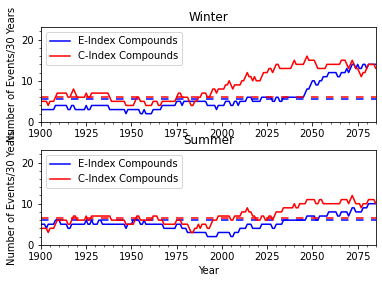

HadGEM3-GC31-LL


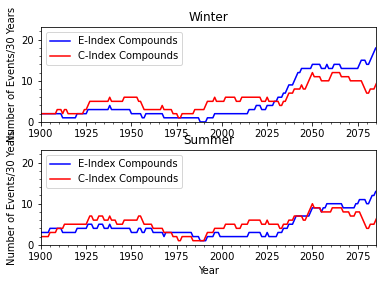

HadGEM3-GC31-MM


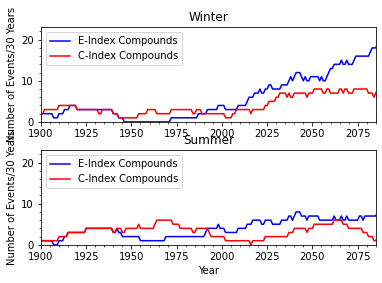

INM-CM4-8


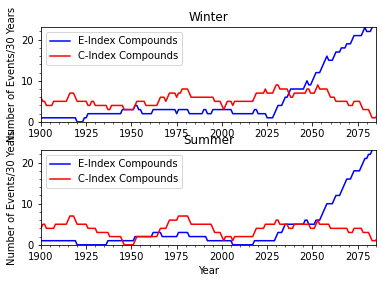

INM-CM5-0


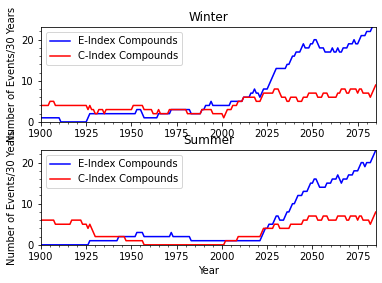

IPSL-CM6A-LR


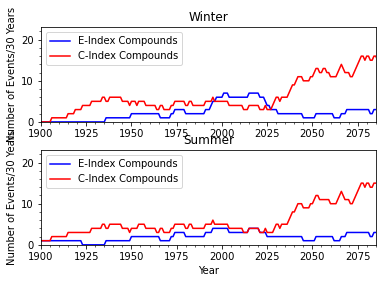

MCM-UA-1-0


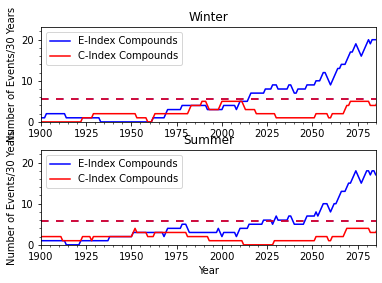

MIROC-ES2L


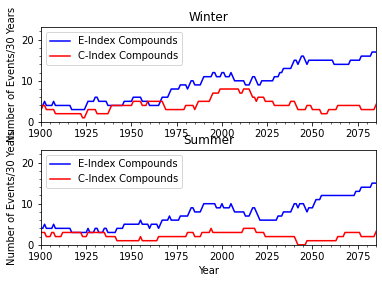

MIROC6


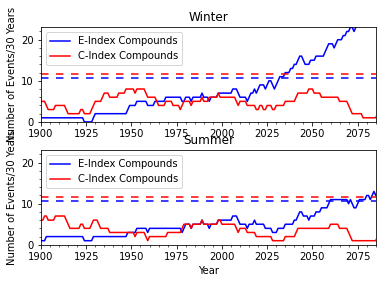

MPI-ESM1-2-HR


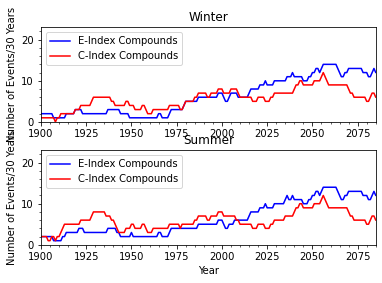

MPI-ESM1-2-LR


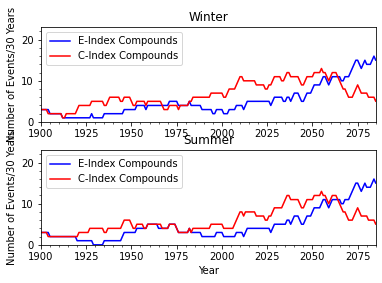

MRI-ESM2-0


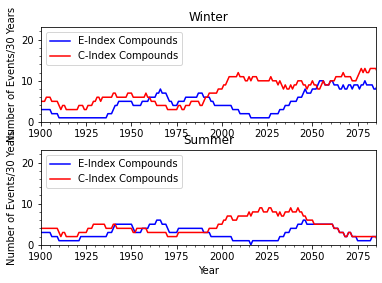

NorESM2-LM


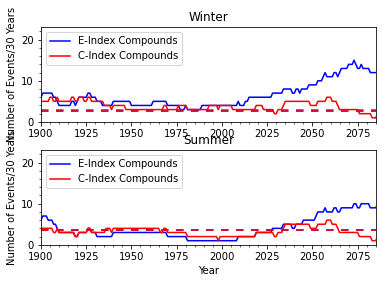

NorESM2-MM


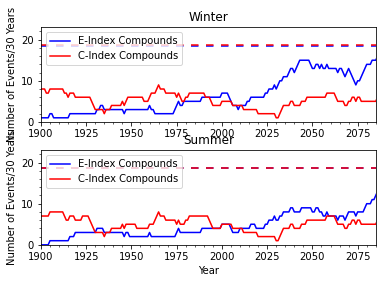

UKESM1-0-LL


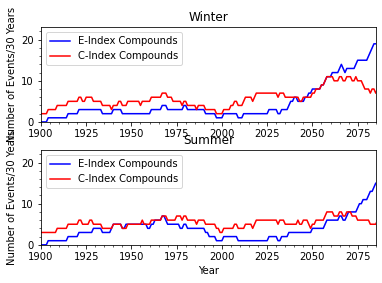

In [39]:
plt.figure(figsize=(8,6))
compounds=['enso+iod','enso+sam','all3']
for iModel in firePos.model.values:
    print(iModel)
    for i,iSeason in [[1,'winter'],[2,'summer']]:

        data_vars=[
            'eIndexDmiSam'+iSeason,'cIndexDmiSam'+iSeason
       ]

        ax=plt.subplot(2,1,i)
        overlaidEmergePlot(
                firePos[data_vars].sel(compound=compounds, model=iModel,drop=True).any('compound').rolling(year=30,min_periods=15,center=True).sum('year'), 
                piConPos[data_vars].sel(compound=compounds, model=iModel,drop=True).any('compound').where(
                            piConPos.eIndexDmiSamsummer.isnull()==False
                        ).rolling(year=30,min_periods=15,center=True).sum('year') 
        )
        if i==1:
            plt.xlabel('')
        plt.legend(['E-Index Compounds','_no_','_no_', 'C-Index Compounds'], loc='upper left')
        plt.title(iSeason.capitalize())
        plt.xlim([1900,2085])
        plt.ylim([0,23])


    plt.subplots_adjust(hspace=0.3)

    plt.show()
    
